# Prediction and analysis on n_streams prediction

https://towardsdatascience.com/time-series-problems-simply-explained-as-fast-food-combo-meals-70c6eb9bdef

#### Install Environment

In [72]:
### ***Enviroment Preparation***
# Install Pandas
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install scikit-learn
!pip install lightgbm

!pip install dtale

!pip install sktime
!pip install sklego

#!pip install skforecast

# Update pip -- WARNING Resolution
!python.exe -m pip install --upgrade pip

In [73]:
### ***Imports***
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import dtale

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from datetime import datetime
from datetime import timedelta

from statsmodels.tsa.stattools import adfuller, kpss

from sklego.preprocessing import RepeatingBasisFunction

from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit

import time
# Current Location.. !cd
#C:\Users\ghoyo\Desktop\TFM\Nuevo\Proyect

# Paths
data = r"C:\Users\ghoyo\Desktop\TFM 2.0\BETA\Project\RegularDatasets\easy_by_day.json"
data2 = r"C:\Users\ghoyo\Desktop\TFM 2.0\BETA\Project\RegularDatasets\easy_by_day_2.json"

#### Import and prepare DF

In [74]:
df = pd.read_json(data2)
df.shape

(2061, 7)

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2061 entries, 2017-04-04 to 2022-11-24
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   day_n_streams    2061 non-null   int64
 1   week_day         2061 non-null   int64
 2   day_n_songs      2061 non-null   int64
 3   day_n_podcast    2061 non-null   int64
 4   day_new_stream   2061 non-null   int64
 5   day_new_song     2061 non-null   int64
 6   day_new_podcast  2061 non-null   int64
dtypes: int64(7)
memory usage: 128.8 KB


In [76]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
day_n_streams,2061.0,39.800097,28.399624,0.0,20.0,35.0,53.0,247.0
week_day,2061.0,2.998544,1.999635,0.0,1.0,3.0,5.0,6.0
day_n_songs,2061.0,39.741388,28.401398,0.0,20.0,35.0,53.0,247.0
day_n_podcast,2061.0,0.058709,0.666791,0.0,0.0,0.0,0.0,22.0
day_new_stream,2061.0,6.515284,9.862028,0.0,0.0,3.0,9.0,106.0
day_new_song,2061.0,6.498787,9.855146,0.0,0.0,3.0,9.0,106.0
day_new_podcast,2061.0,0.016497,0.145213,0.0,0.0,0.0,0.0,2.0


In [77]:
df.head(20)

,day_n_streams,week_day,day_n_songs,day_n_podcast,day_new_stream,day_new_song,day_new_podcast
2017-04-04,66,1,66,0,0,0,0
2017-04-05,123,2,123,0,0,0,0
2017-04-06,63,3,63,0,0,0,0
2017-04-07,45,4,45,0,0,0,0
2017-04-08,56,5,56,0,0,0,0
2017-04-09,36,6,36,0,0,0,0
2017-04-10,73,0,73,0,0,0,0
2017-04-11,18,1,18,0,0,0,0
2017-04-12,0,2,0,0,0,0,0
2017-04-13,0,3,0,0,0,0,0


In [78]:
TARGETS = ['day_n_streams', 'day_n_songs', 'day_n_podcast', 'day_new_stream', 'day_new_song', 'day_new_podcast']

# EDA

Text(0.5, 1.0, 'Number of New Podcasts listened each day')

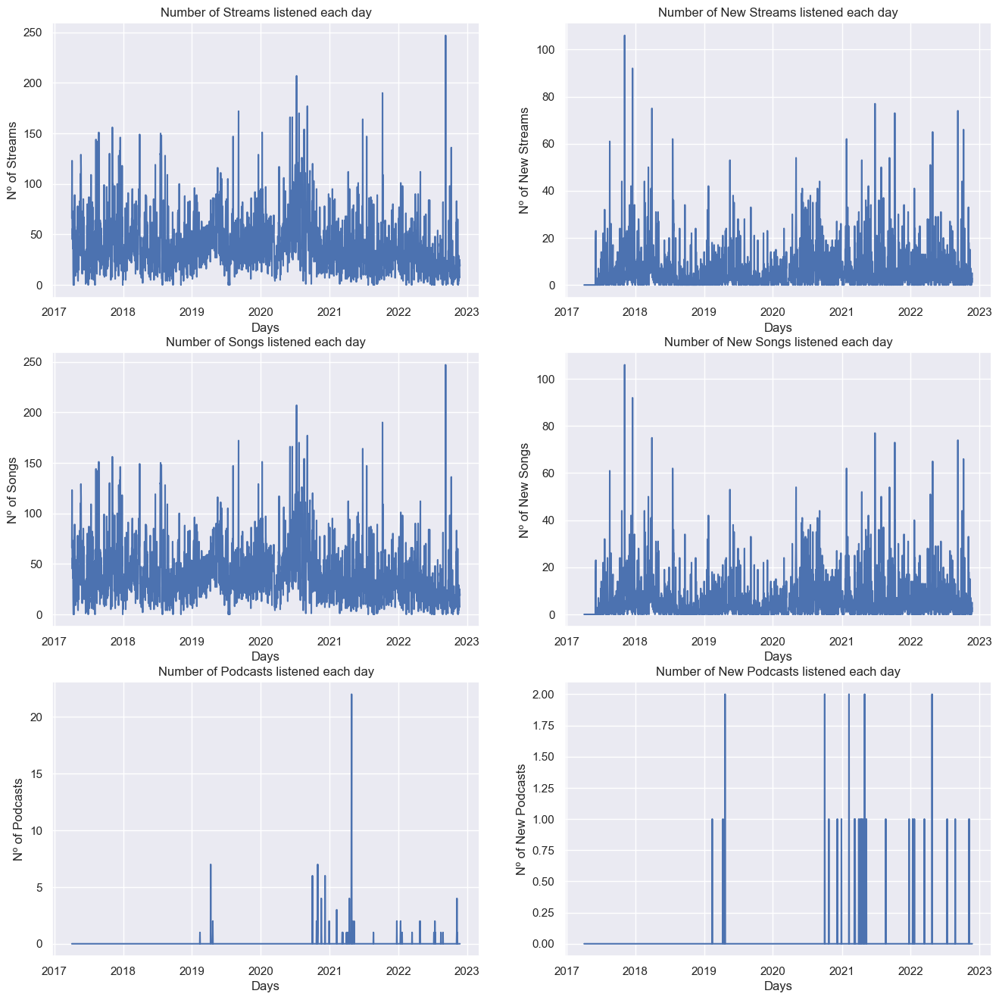

In [79]:
fig, ax = plt.subplots(3,2,figsize=(16,16))

#Plot Number of Streams Listened Each Day
ax[0][0].plot(df['day_n_streams'])
ax[0][0].set(xlabel = 'Days', ylabel = 'Nº of Streams')
ax[0][0].set_title("Number of Streams listened each day")

ax[0][1].plot(df['day_new_stream'])
ax[0][1].set(xlabel = 'Days', ylabel = 'Nº of New Streams')
ax[0][1].set_title("Number of New Streams listened each day")

ax[1][0].plot(df['day_n_songs'])
ax[1][0].set(xlabel = 'Days', ylabel = 'Nº of Songs')
ax[1][0].set_title("Number of Songs listened each day")

ax[1][1].plot(df['day_new_song'])
ax[1][1].set(xlabel = 'Days', ylabel = 'Nº of New Songs')
ax[1][1].set_title("Number of New Songs listened each day")

ax[2][0].plot(df['day_n_podcast'])
ax[2][0].set(xlabel = 'Days', ylabel = 'Nº of Podcasts')
ax[2][0].set_title("Number of Podcasts listened each day")

ax[2][1].plot(df['day_new_podcast'])
ax[2][1].set(xlabel = 'Days', ylabel = 'Nº of New Podcasts')
ax[2][1].set_title("Number of New Podcasts listened each day")


In [80]:
def analyse_by(df=df, op='y'):
    fig, ax = plt.subplots(3,2,figsize=(16,16))
    
    if(op == 'm'):
        xcoords = [d for d in df.index if(d.day == 1)]
        ax.set_title('describe by months')
        
    elif(op == 'y'):
        xcoords = [d for d in df.index if(d.day == 1 and d.month == 1)]
        ax[0][0].set_title('describe by years')
    
    for i in range(3):
        for j in range(2):
            for xc in xcoords:
                ax[i][j].axvline(x=xc, color='black', linestyle='--')
        
    ax[0][0].plot(df['day_n_streams'])
    ax[0][0].set(xlabel = 'Days', ylabel = 'Nº of Streams')
    ax[0][0].set_title("Number of Streams listened each day")
    
    ax[0][1].plot(df['day_new_stream'])
    ax[0][1].set(xlabel = 'Days', ylabel = 'Nº of New Streams')
    ax[0][1].set_title("Number of New Streams listened each day")

    ax[1][0].plot(df['day_n_songs'])
    ax[1][0].set(xlabel = 'Days', ylabel = 'Nº of Songs')
    ax[1][0].set_title("Number of Songs listened each day")

    ax[1][1].plot(df['day_new_song'])
    ax[1][1].set(xlabel = 'Days', ylabel = 'Nº of New Songs')
    ax[1][1].set_title("Number of New Songs listened each day")

    ax[2][0].plot(df['day_n_podcast'])
    ax[2][0].set(xlabel = 'Days', ylabel = 'Nº of Podcasts')
    ax[2][0].set_title("Number of Podcasts listened each day")

    ax[2][1].plot(df['day_new_podcast'])
    ax[2][1].set(xlabel = 'Days', ylabel = 'Nº of New Podcasts')
    ax[2][1].set_title("Number of New Podcasts listened each day")
    
    
def analyse_one_by(df=df, op='m', data = 'day_n_streams'):
    ax = df.plot(y='day_n_streams', figsize=(12,3))
    
    if(op == 'm'):
        xcoords = [d for d in df.index if(d.day == 1)]
        ax.set_title('describe by months')
    elif(op == 'y'):
        xcoords = [d for d in df.index if(d.day == 1 and d.month == 1)]
        ax.set_title('describe by years')
    
    for xc in xcoords:
        plt.axvline(x=xc, color='black', linestyle='--')
    ax.set_ylabel('number of Streams/Songs/Podcasts')
    
# Analyse by month and year
#analyse_by(df, 'y', y = 'day_new_stream')
#analyse_by(df, 'm', y = 'day_new_stream')

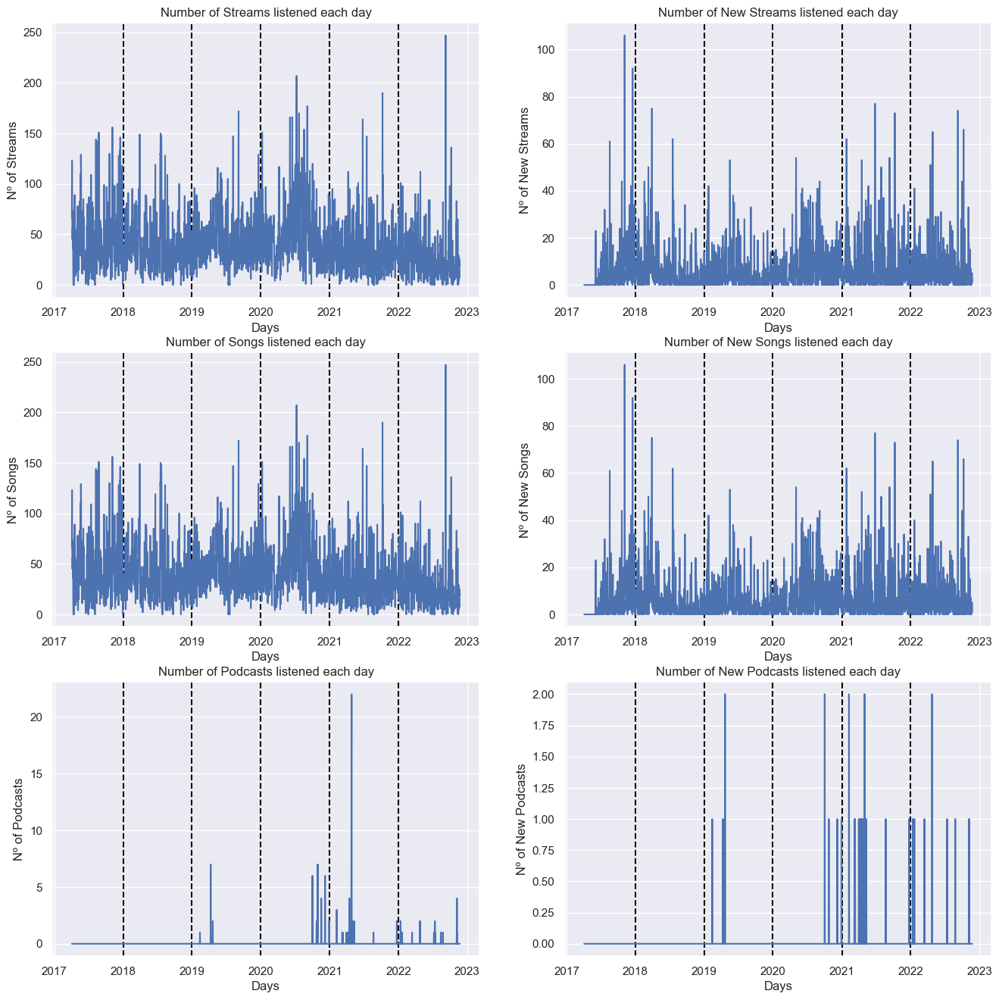

In [81]:
analyse_by(df, 'y')

# Decompose Seasonality, Trend and Noise

In [82]:
def deco(df, share_type='day_n_streams', samples=2033, period=30):
    if samples == 'all':
        #decomposing all time series timestamps
        res = seasonal_decompose(df[share_type].values, period=period)
    else:
        #decomposing a sample of the time series
        res = seasonal_decompose(df[share_type].values[-samples:], period=period)
    
    observed = res.observed
    trend = res.trend
    seasonal = res.seasonal
    residual = res.resid
    
    #plot the complete time series
    fig, axs = plt.subplots(4, figsize=(20,8))
    axs[0].set_ylabel('OBSERVED', fontsize=12)
    axs[0].plot(observed)
    axs[0].grid()
    
    #plot the trend of the time series
    axs[1].set_ylabel('TREND', fontsize=12)
    axs[1].plot(trend)
    axs[1].grid()
    
    #plot the seasonality of the time series. Period=30 Month seasonality | Period=7 weekly seasonality.
    axs[2].set_ylabel('SEASONALITY', fontsize=12)
    axs[2].plot(seasonal)
    axs[2].grid()
    
    #plot the noise of the time series
    axs[3].set_ylabel('NOISE', fontsize=12)
    axs[3].plot(residual)
    axs[3].scatter(y=residual, x=range(len(residual)), alpha=0.5)
    axs[3].grid()
    
    plt.show()

-------------------------------------------- day_n_streams -----------------------------------------------------------------
 - - - - - - - - - - - - - - - - - - - - - - period 30 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


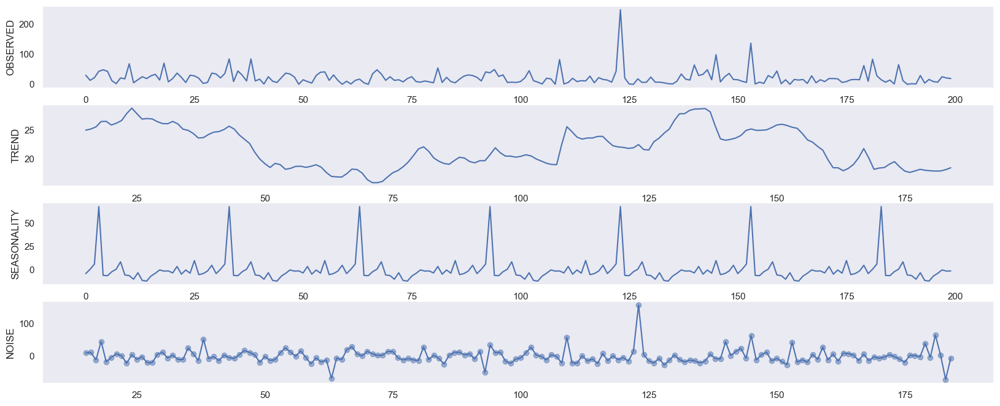

 - - - - - - - - - - - - - - - - - - - - - - period 90 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


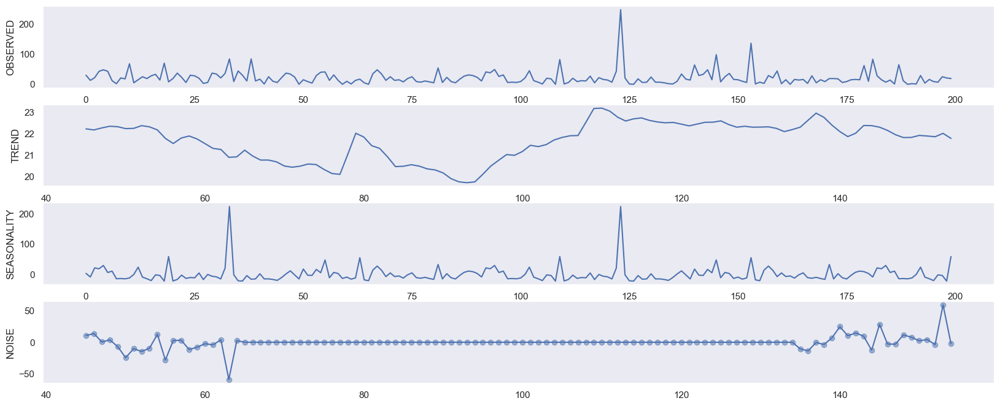

 - - - - - - - - - - - - - - - - - - - - - - period 7 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


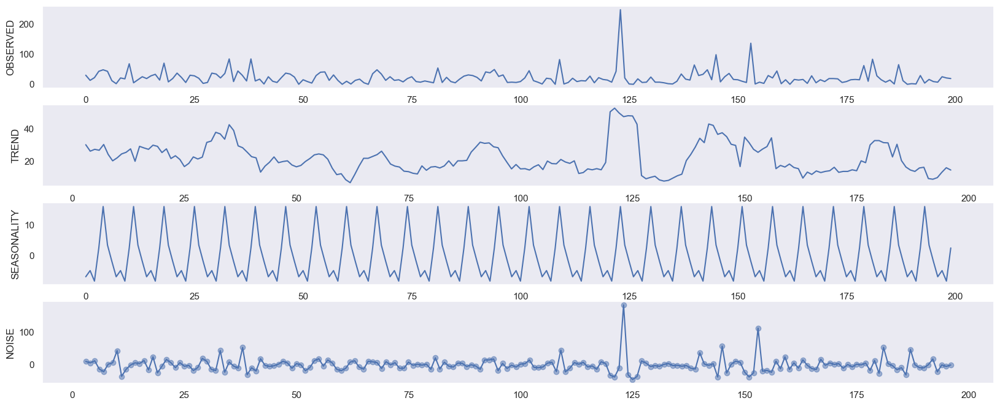

 - - - - - - - - - - - - - - - - - - - - - - period 14 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


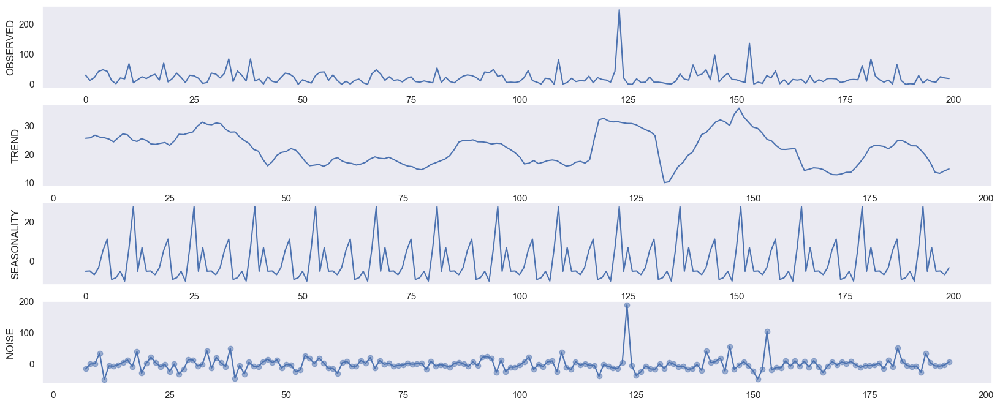

888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888
-------------------------------------------- day_n_songs -----------------------------------------------------------------
 - - - - - - - - - - - - - - - - - - - - - - period 30 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


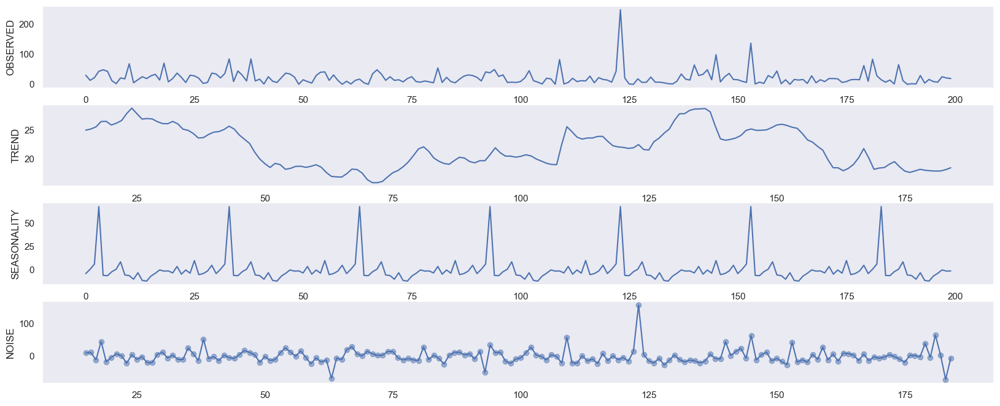

 - - - - - - - - - - - - - - - - - - - - - - period 90 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


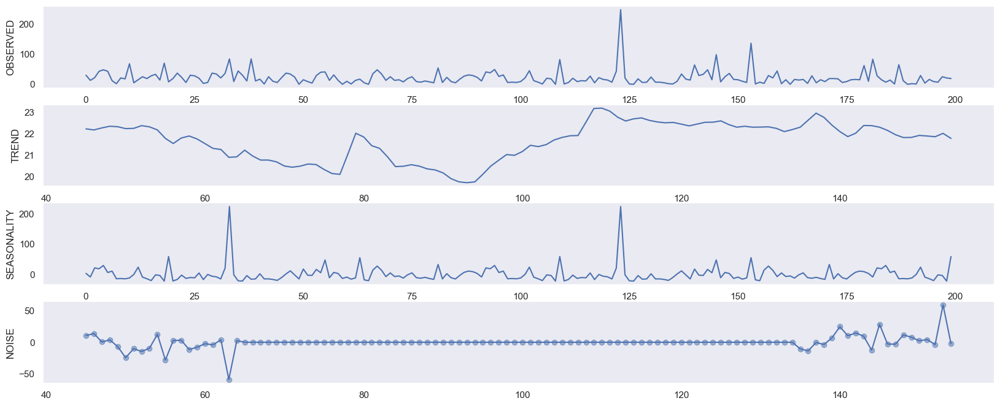

 - - - - - - - - - - - - - - - - - - - - - - period 7 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


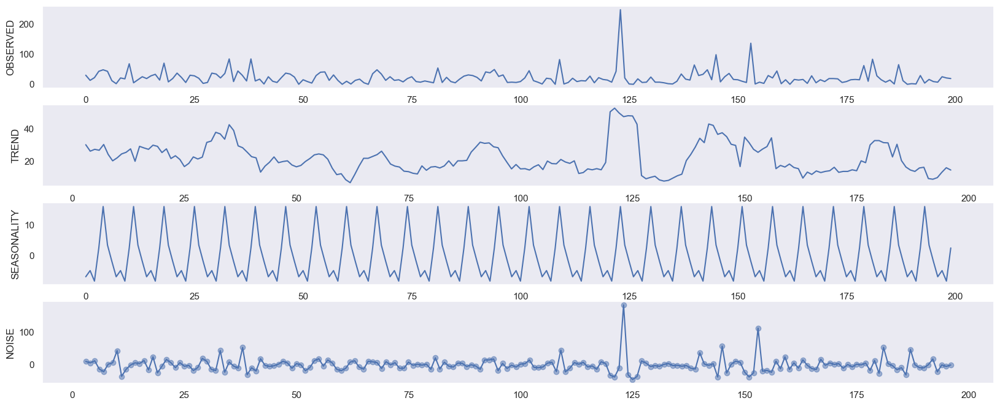

 - - - - - - - - - - - - - - - - - - - - - - period 14 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


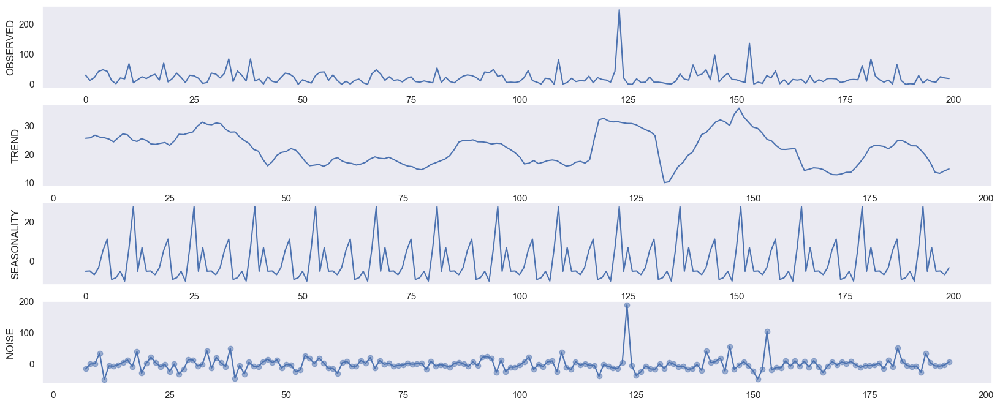

888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888
-------------------------------------------- day_n_podcast -----------------------------------------------------------------
 - - - - - - - - - - - - - - - - - - - - - - period 30 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


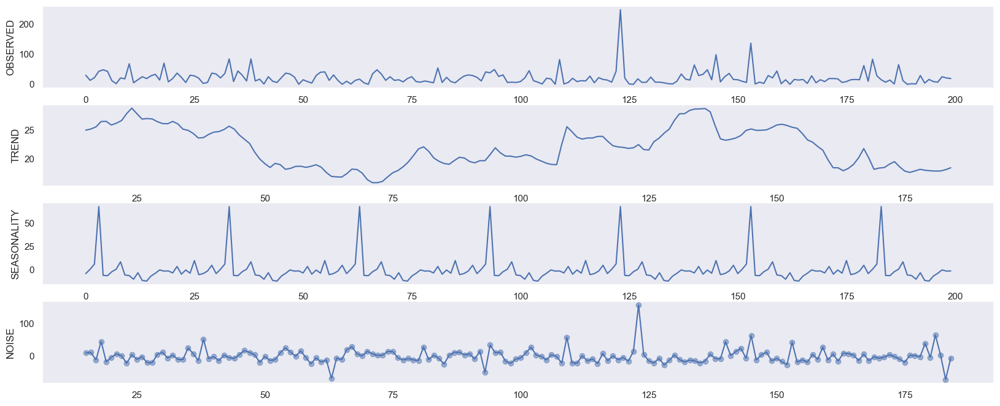

 - - - - - - - - - - - - - - - - - - - - - - period 90 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


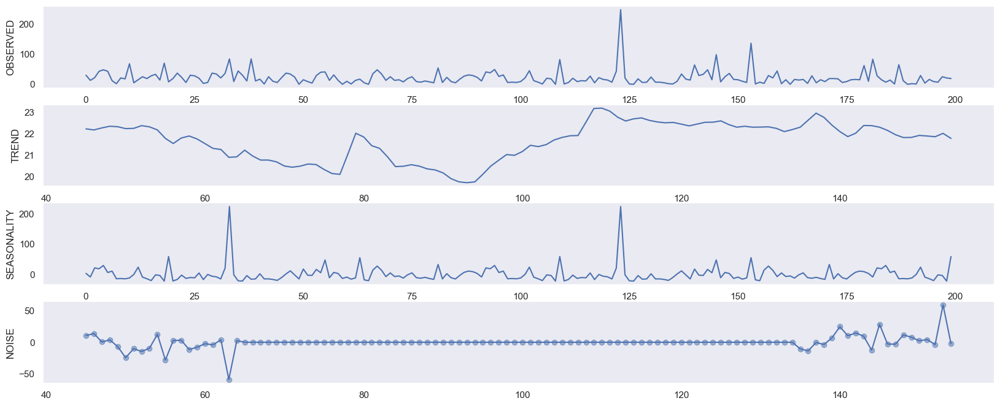

 - - - - - - - - - - - - - - - - - - - - - - period 7 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


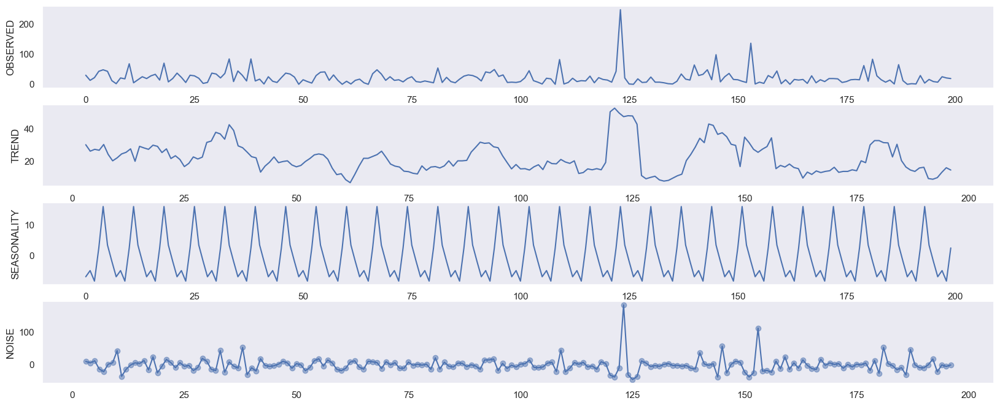

 - - - - - - - - - - - - - - - - - - - - - - period 14 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


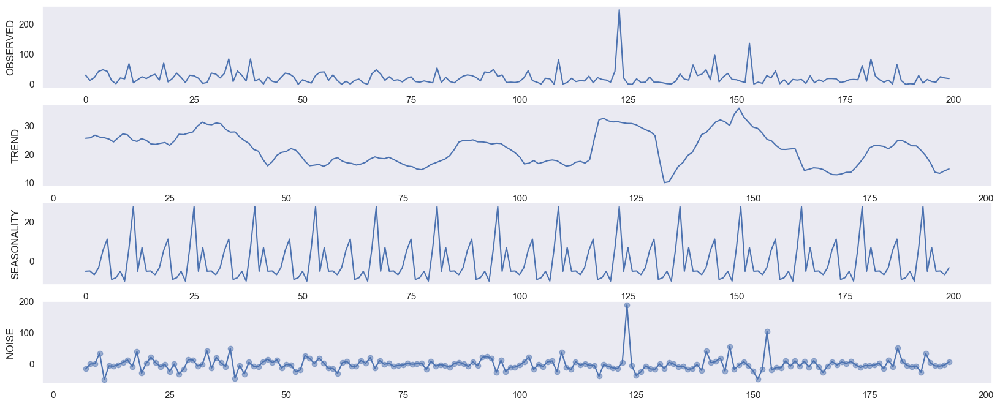

888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888
-------------------------------------------- day_new_stream -----------------------------------------------------------------
 - - - - - - - - - - - - - - - - - - - - - - period 30 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


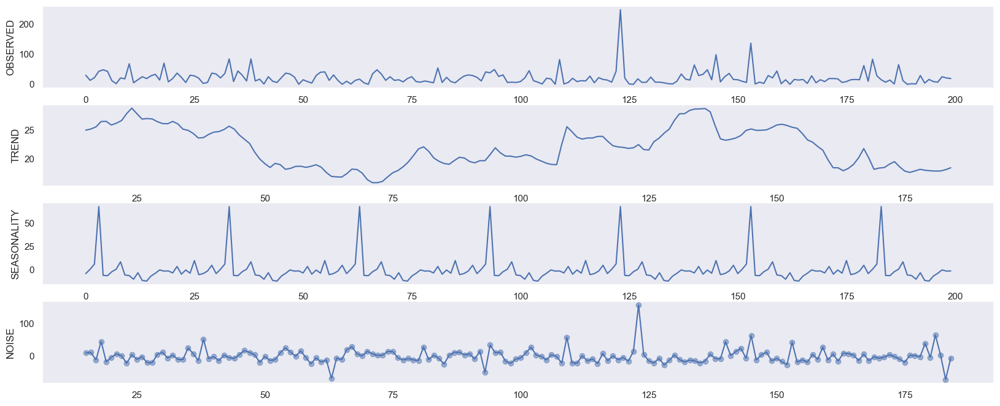

 - - - - - - - - - - - - - - - - - - - - - - period 90 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


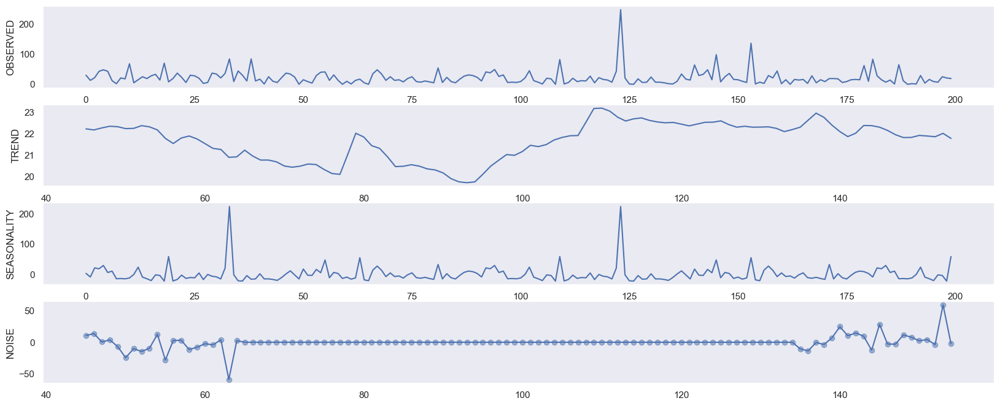

 - - - - - - - - - - - - - - - - - - - - - - period 7 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


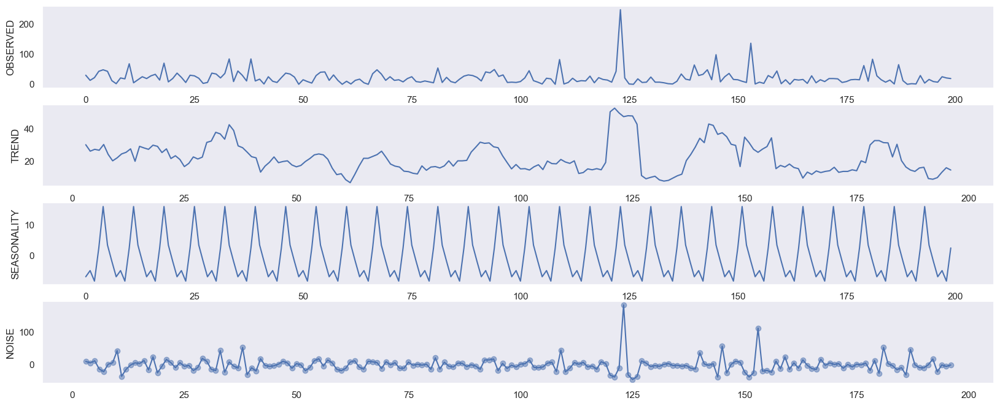

 - - - - - - - - - - - - - - - - - - - - - - period 14 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


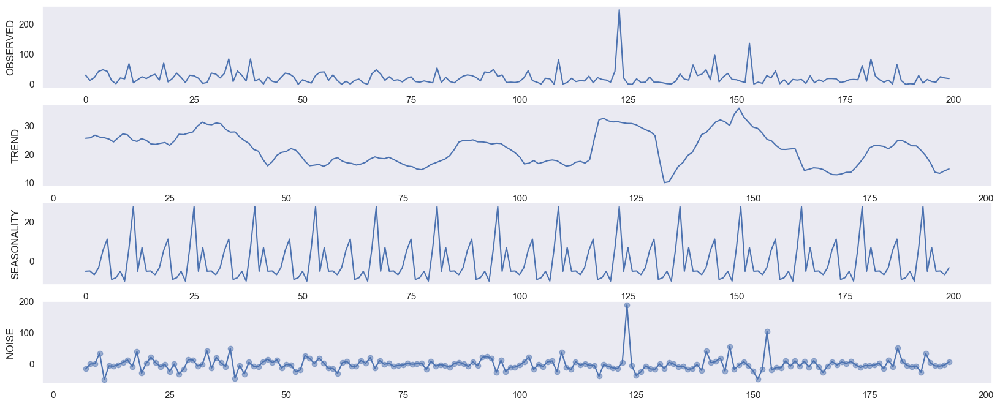

888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888
-------------------------------------------- day_new_song -----------------------------------------------------------------
 - - - - - - - - - - - - - - - - - - - - - - period 30 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


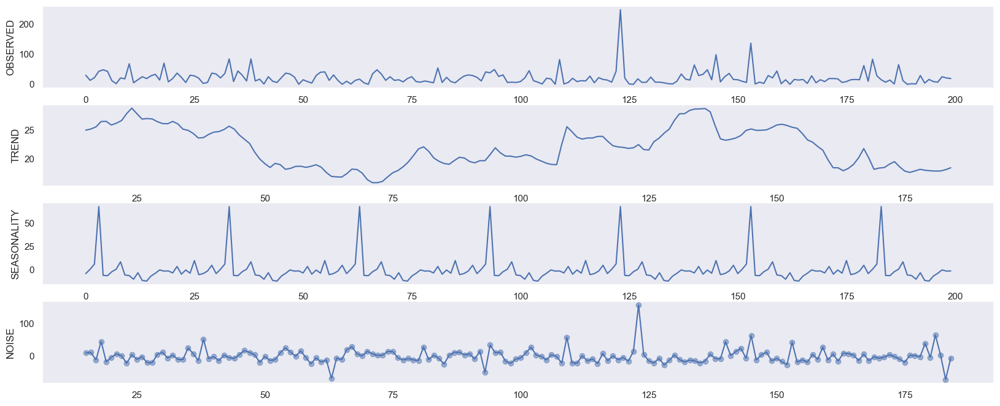

 - - - - - - - - - - - - - - - - - - - - - - period 90 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


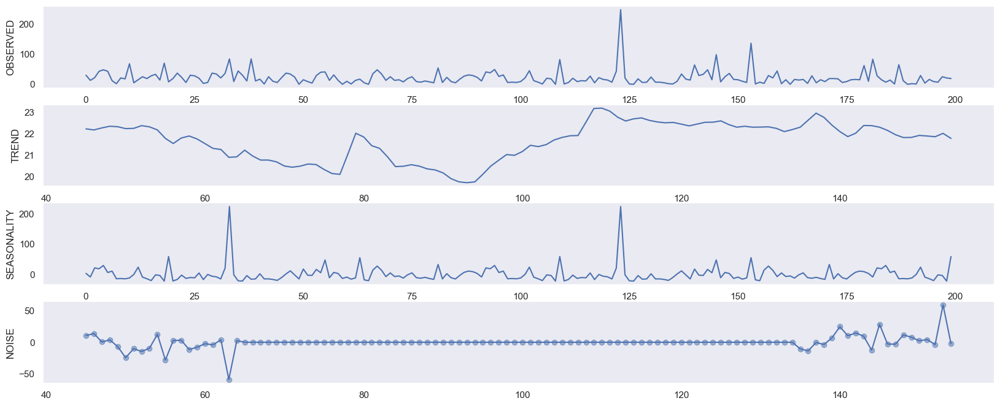

 - - - - - - - - - - - - - - - - - - - - - - period 7 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


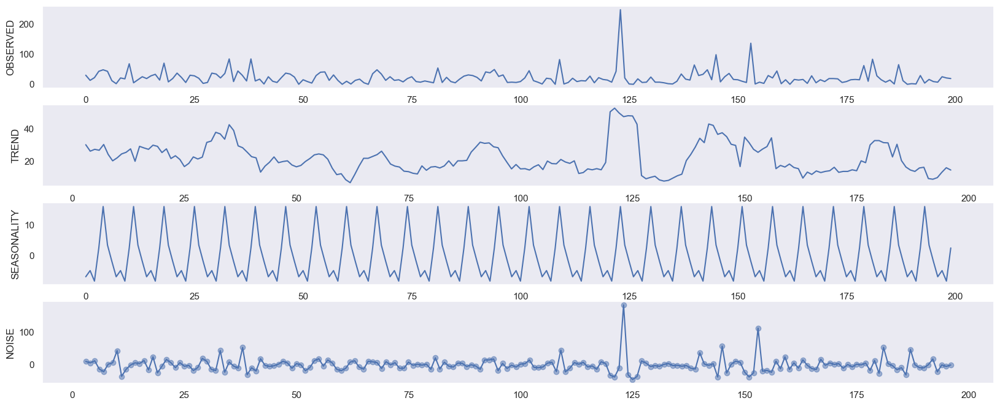

 - - - - - - - - - - - - - - - - - - - - - - period 14 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


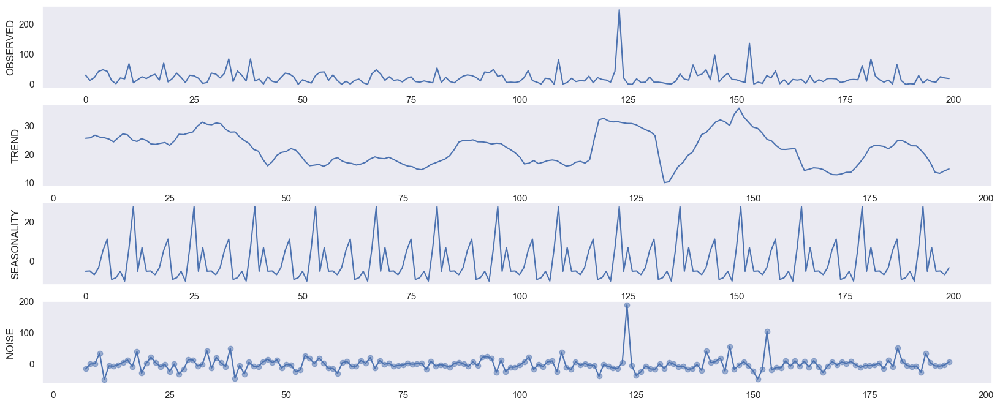

888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888
-------------------------------------------- day_new_podcast -----------------------------------------------------------------
 - - - - - - - - - - - - - - - - - - - - - - period 30 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


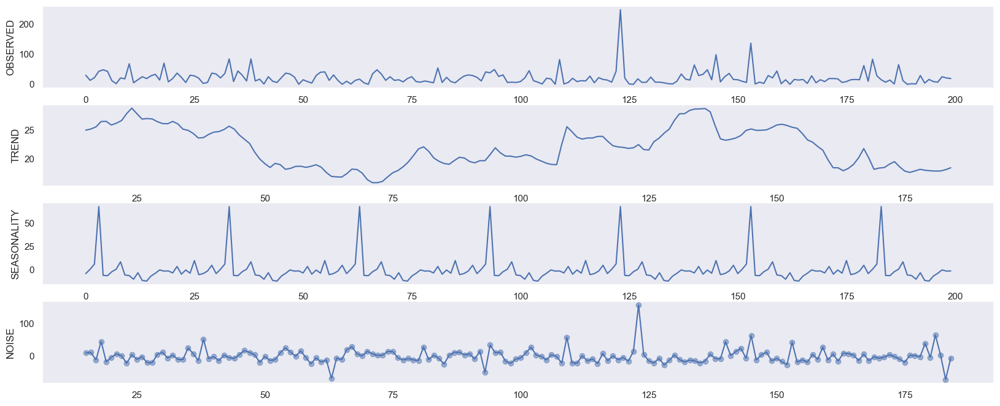

 - - - - - - - - - - - - - - - - - - - - - - period 90 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


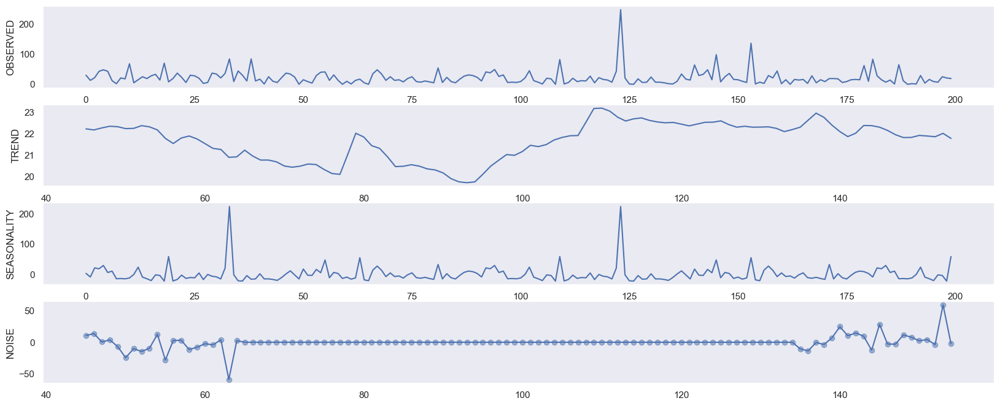

 - - - - - - - - - - - - - - - - - - - - - - period 7 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


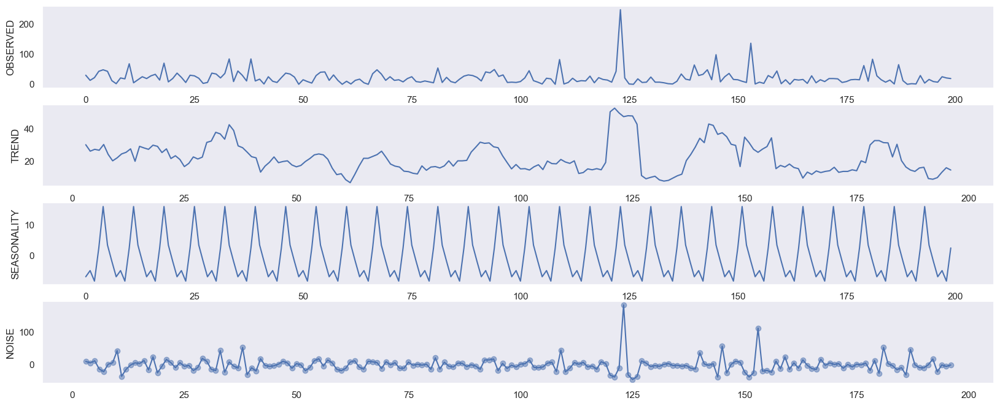

 - - - - - - - - - - - - - - - - - - - - - - period 14 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


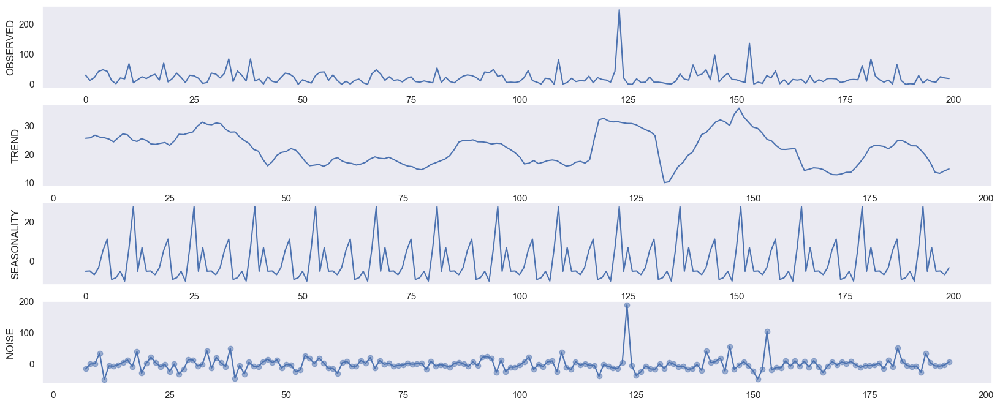

888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888


In [83]:
# samples=2033 = ALL DATA
for i in TARGETS:
    print('-------------------------------------------- ' + str(i) + ' -----------------------------------------------------------------')    
    print(' - - - - - - - - - - - - - - - - - - - - - - ' + 'period ' + str(30) + ' - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - ')
    deco(df, samples=200, period=30)
    print(' - - - - - - - - - - - - - - - - - - - - - - ' + 'period ' + str(90) + ' - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - ')
    deco(df, samples=200, period=90)
    print(' - - - - - - - - - - - - - - - - - - - - - - ' + 'period ' + str(7) + ' - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - ')
    deco(df, samples=200, period=7)
    print(' - - - - - - - - - - - - - - - - - - - - - - ' + 'period ' + str(14) + ' - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - ')
    deco(df, samples=200, period=14)
    print('888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888')

# Check autorregresiveness

In [84]:
# Plot Correlation
def plot_corrs(data = 'day_n_streams', l1 = 90, l2 = 14):
    fig, ax = plt.subplots(2,2,figsize=(16,12))
    plot_acf(df[data].values, lags=l1, ax=ax[0][0], title='Autocorr '+ data + ' ' + str(l1))
    plot_pacf(df[data].values, lags=l1, ax=ax[0][1], title='Partialcorr '+ data + ' ' + str(l1))
    plot_acf(df[data].values, lags=l2, ax=ax[1][0], title='Autocorr '+ data + ' ' + str(l2))
    plot_pacf(df[data].values, lags=l2, ax=ax[1][1], title='Partialcorr '+ data + ' ' + str(l2))

    plt.show()

-------------------------------------------- day_n_streams --------------------------------------------------------------------


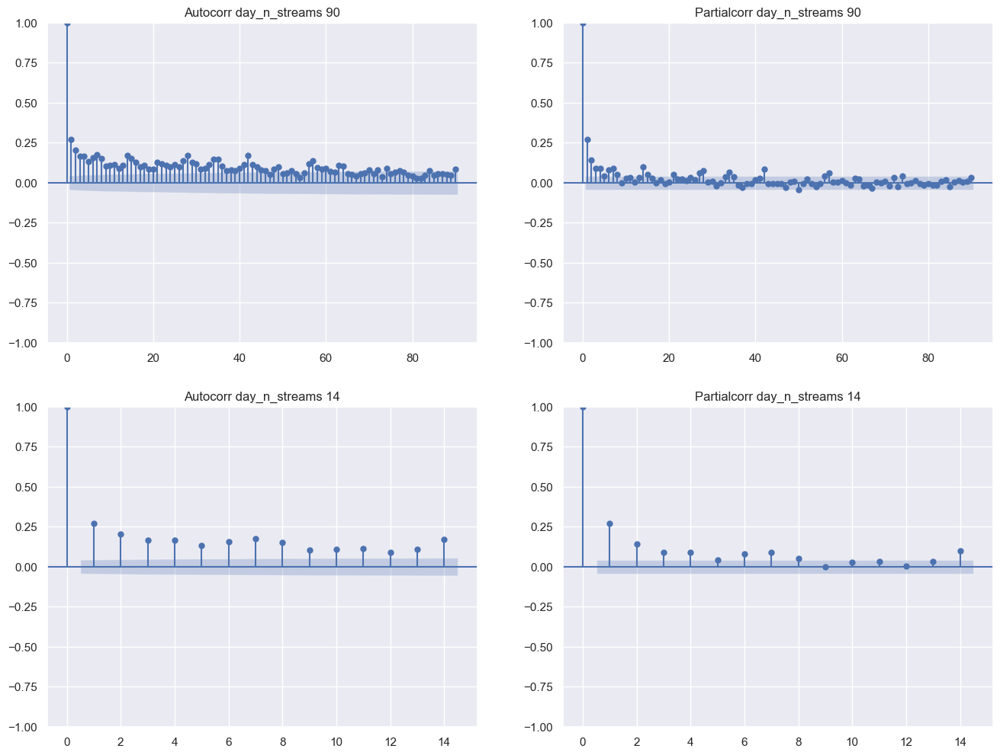

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_n_songs --------------------------------------------------------------------


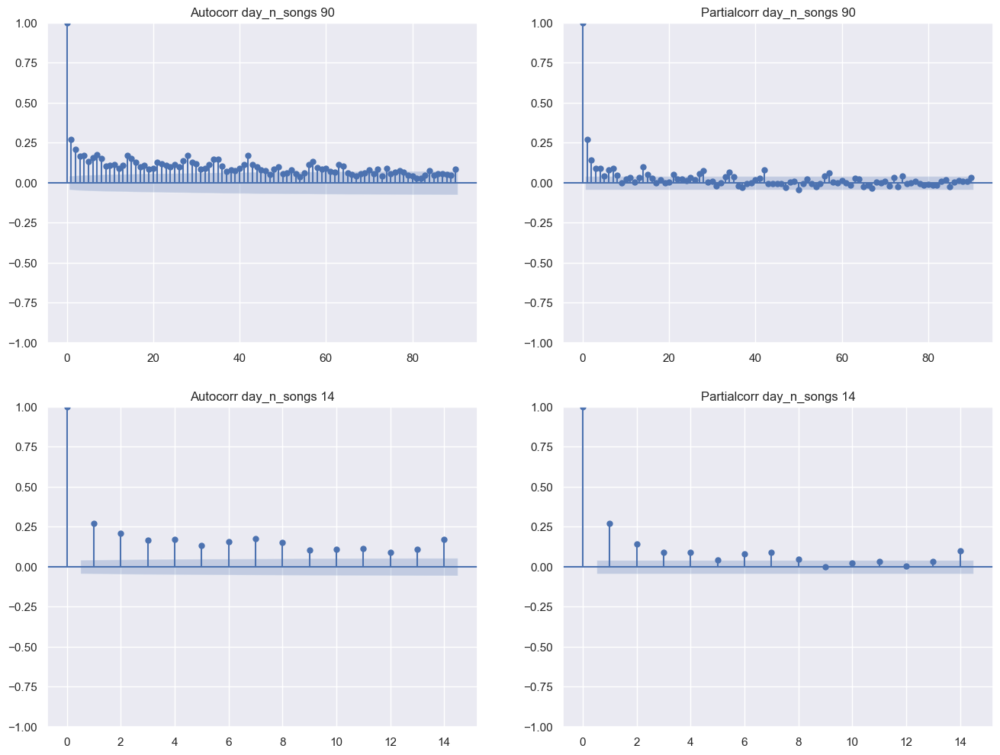

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_n_podcast --------------------------------------------------------------------


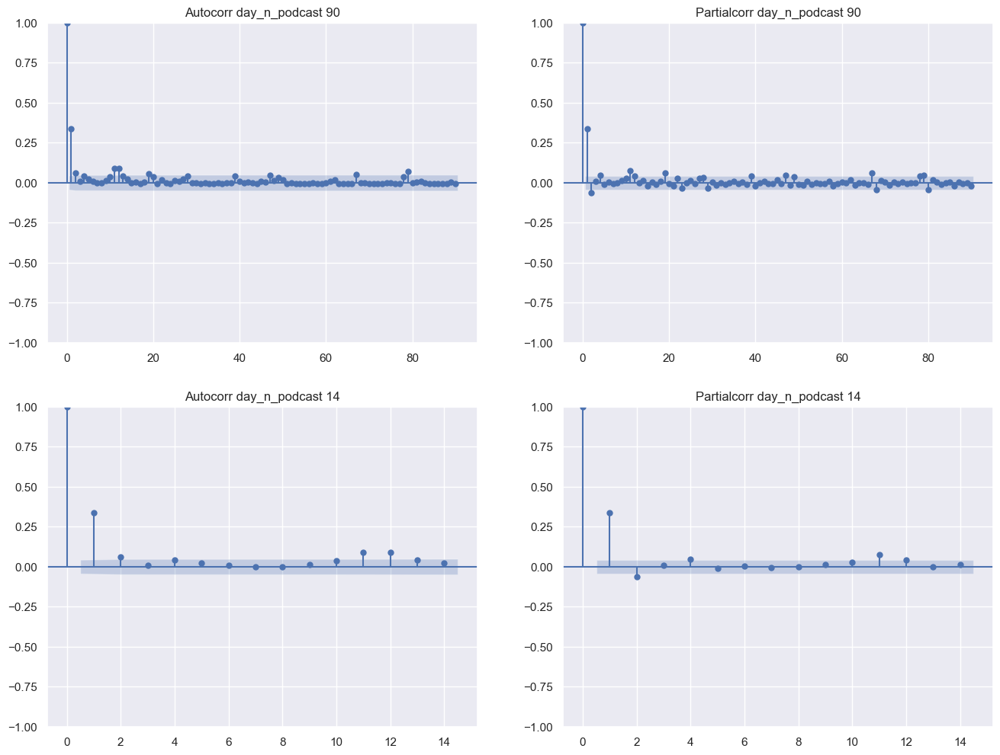

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_stream --------------------------------------------------------------------


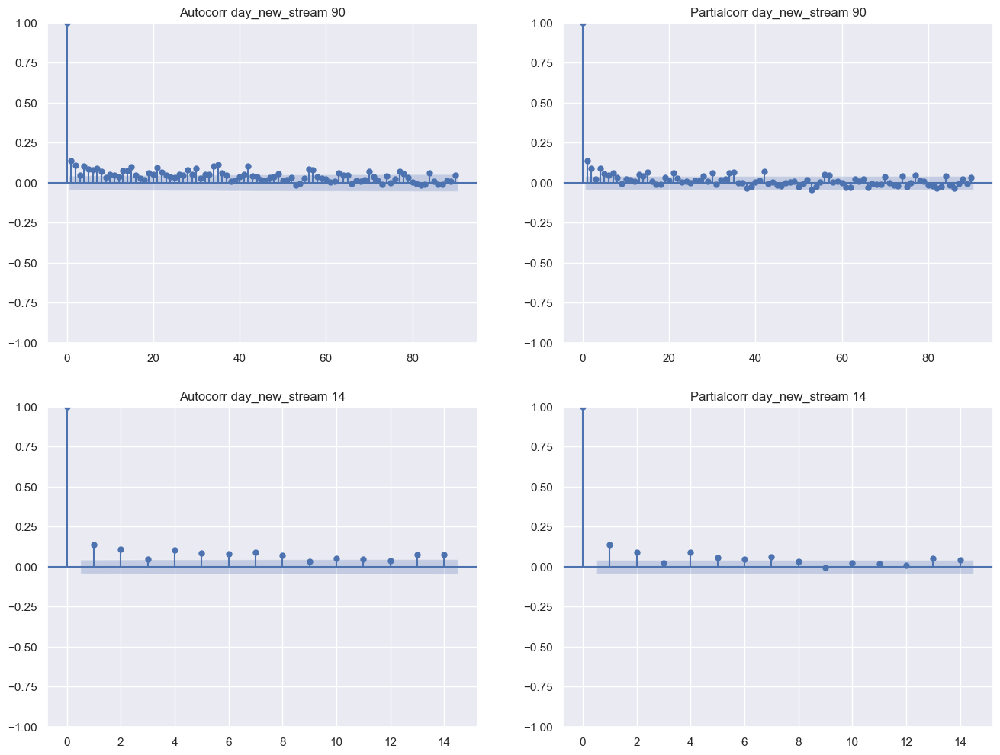

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_song --------------------------------------------------------------------


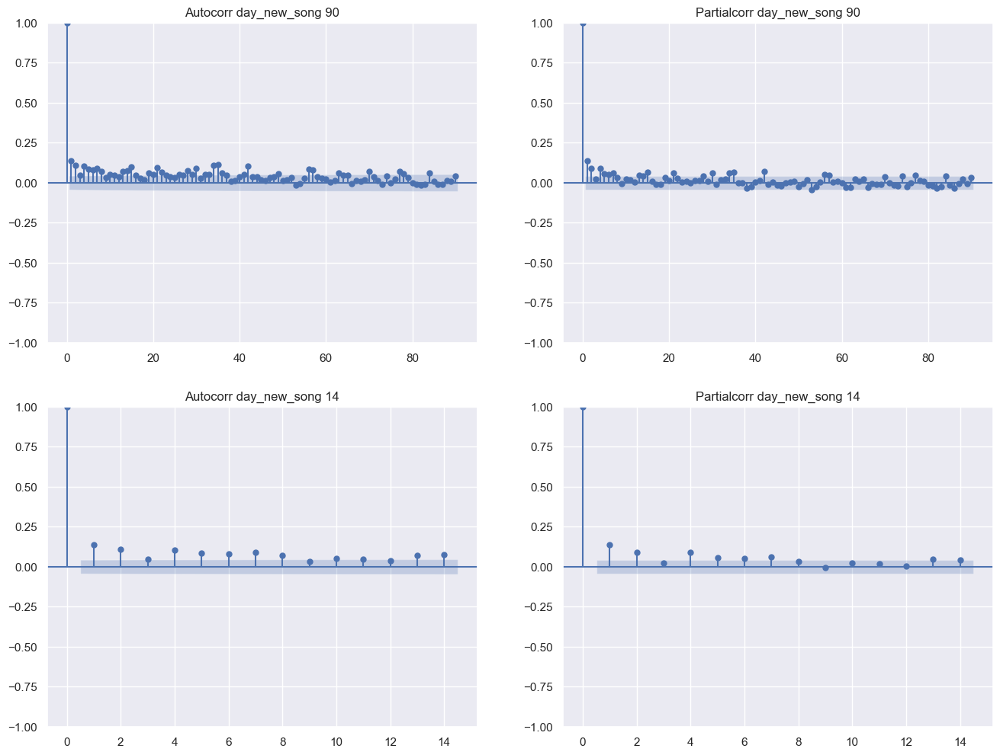

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_podcast --------------------------------------------------------------------


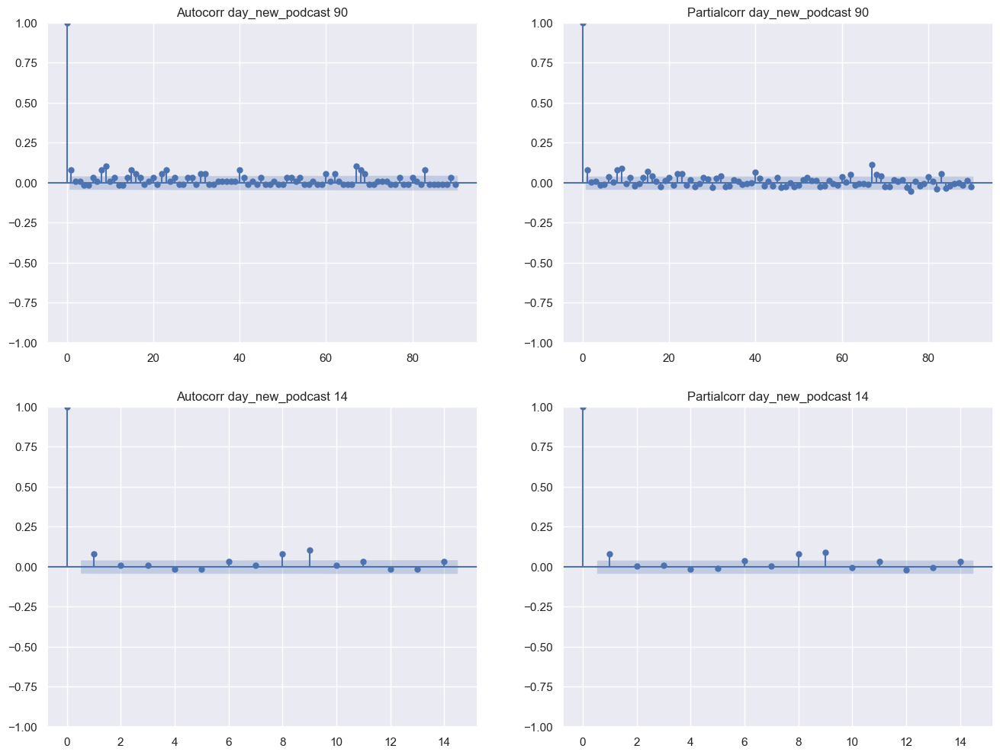

------------------------------------------------------------------------------------------------------------------------


In [85]:
for i in TARGETS:
    print('-------------------------------------------- ' + str(i) + ' --------------------------------------------------------------------')    
    plot_corrs(i)
    print('------------------------------------------------------------------------------------------------------------------------')

#### <span style='background :yellow' > Conclusiones Autocorrelacion Alta??? -- o AutocorrParcial Alta??? </span>

<span style='background :yellow' > Que signignifican estos valores altos y como se puede proceder </span>

<span style='background :yellow' > Como no hay ningun bucle subida bajada, intuímos que no son AUTOREGRESIVOS???? Habria que estudiarlo por horas, es decir un dia se explica por el anterior, como un servicio de alquiler de bicis electricas, que se usan mas a unas horas que a otras. Esto también depende fuertemente del usuario</span>

https://statisticsbyjim.com/time-series/autocorrelation-partial-autocorrelation/

https://machinelearningmastery.com/feature-selection-time-series-forecasting-python/

#### Check Autocorrelation between weekdays: Monday, Tuestday, ...

In [86]:
def plot_dailies(data = 'day_n_streams'):
    fig, ax = plt.subplots(7,2,figsize=(20,20))

    plot_acf(df.loc[df['week_day'] == 0, data].values, ax=ax[0][0], title='Autocorrelation - Day 0 - ' + str(data))
    plot_pacf(df.loc[df['week_day'] == 0, data].values, ax=ax[0][1], title='Partial Autocorrelation - Day 0 - ' + str(data))

    plot_acf(df.loc[df['week_day'] == 1, data].values, ax=ax[1][0], title='Autocorrelation - Day 1 - ' + str(data))
    plot_pacf(df.loc[df['week_day'] == 1, data].values, ax=ax[1][1], title='Partial Autocorrelation - Day 1 - ' + str(data))

    plot_acf(df.loc[df['week_day'] == 2, data].values, ax=ax[2][0], title='Autocorrelation - Day 2 - ' + str(data))
    plot_pacf(df.loc[df['week_day'] == 2, data].values, ax=ax[2][1], title='Partial Autocorrelation - Day 2 - ' + str(data))

    plot_acf(df.loc[df['week_day'] == 3, data].values, ax=ax[3][0], title='Autocorrelation - Day 3 - ' + str(data))
    plot_pacf(df.loc[df['week_day'] == 3, data].values, ax=ax[3][1], title='Partial Autocorrelation - Day 3 - ' + str(data))

    plot_acf(df.loc[df['week_day'] == 4, data].values, ax=ax[4][0], title='Autocorrelation - Day 4 - ' + str(data))
    plot_pacf(df.loc[df['week_day'] == 4, data].values, ax=ax[4][1], title='Partial Autocorrelation - Day 4 - ' + str(data))

    plot_acf(df.loc[df['week_day'] == 5, data].values, ax=ax[5][0], title='Autocorrelation - Day 5 - ' + str(data))
    plot_pacf(df.loc[df['week_day'] == 5, data].values, ax=ax[5][1], title='Partial Autocorrelation - Day 5 - ' + str(data))

    plot_acf(df.loc[df['week_day'] == 6, data].values, ax=ax[6][0], title='Autocorrelation - Day 6 - ' + str(data))
    plot_pacf(df.loc[df['week_day'] == 6, data].values, ax=ax[6][1], title='Partial Autocorrelation - Day 6 - ' + str(data))
    plt.show()

##### Singular Matrix

https://stats.stackexchange.com/questions/70899/what-correlation-makes-a-matrix-singular-and-what-are-implications-of-singularit

In [87]:
#plot_dailies(data = 'day_n_streams')

-------------------------------------------- day_n_streams --------------------------------------------------------------------


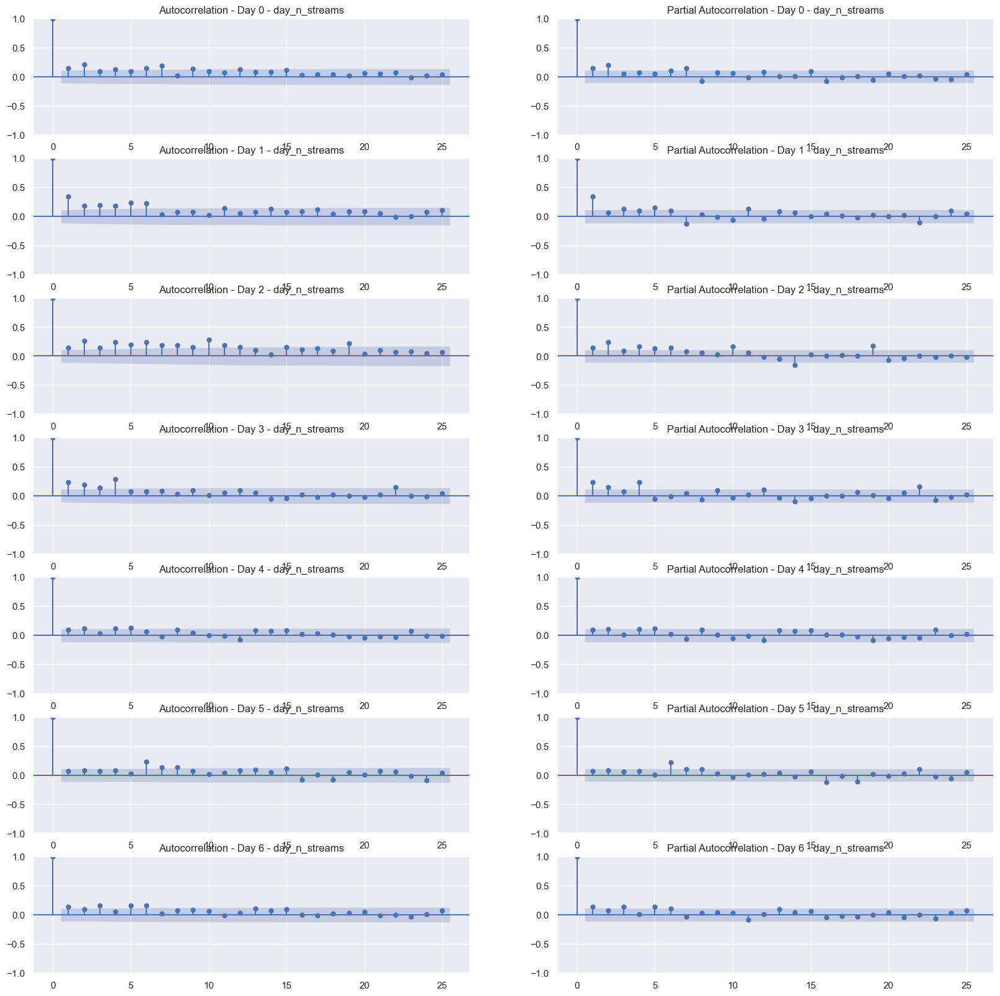

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_n_songs --------------------------------------------------------------------


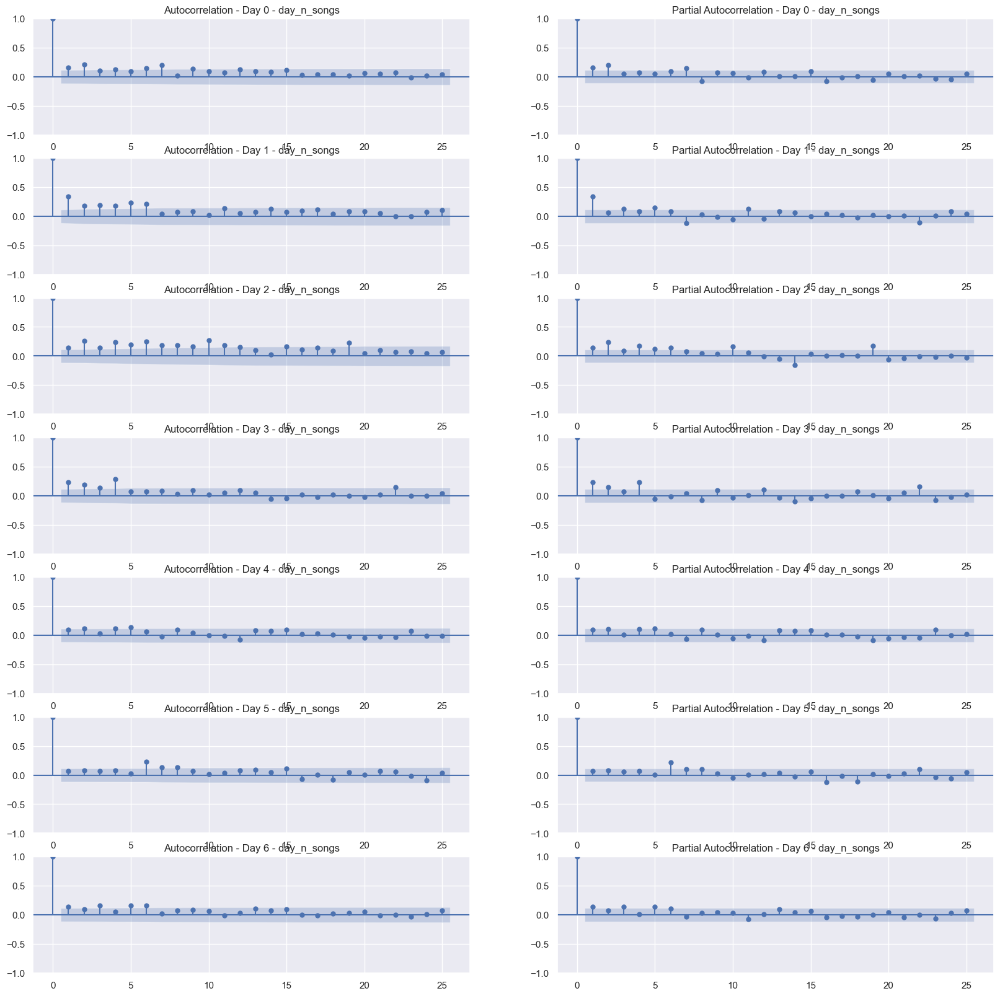

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_n_podcast --------------------------------------------------------------------


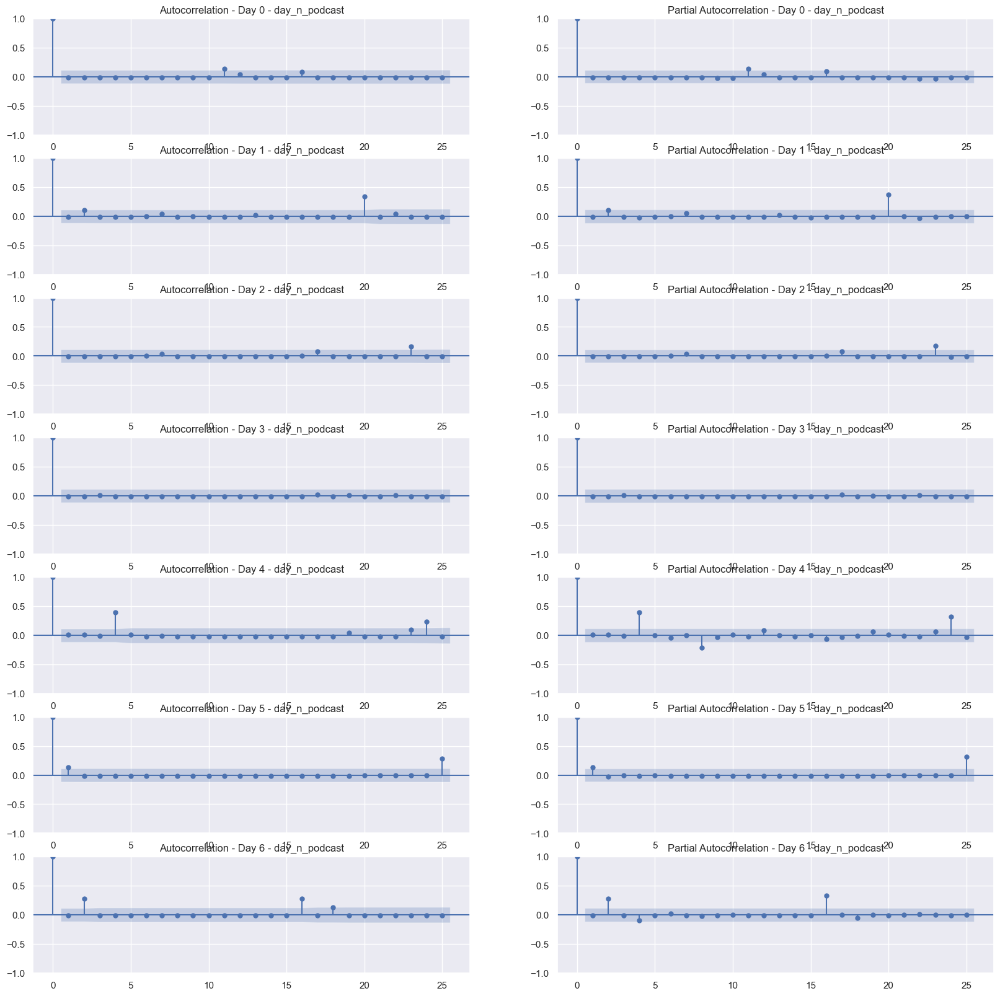

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_stream --------------------------------------------------------------------


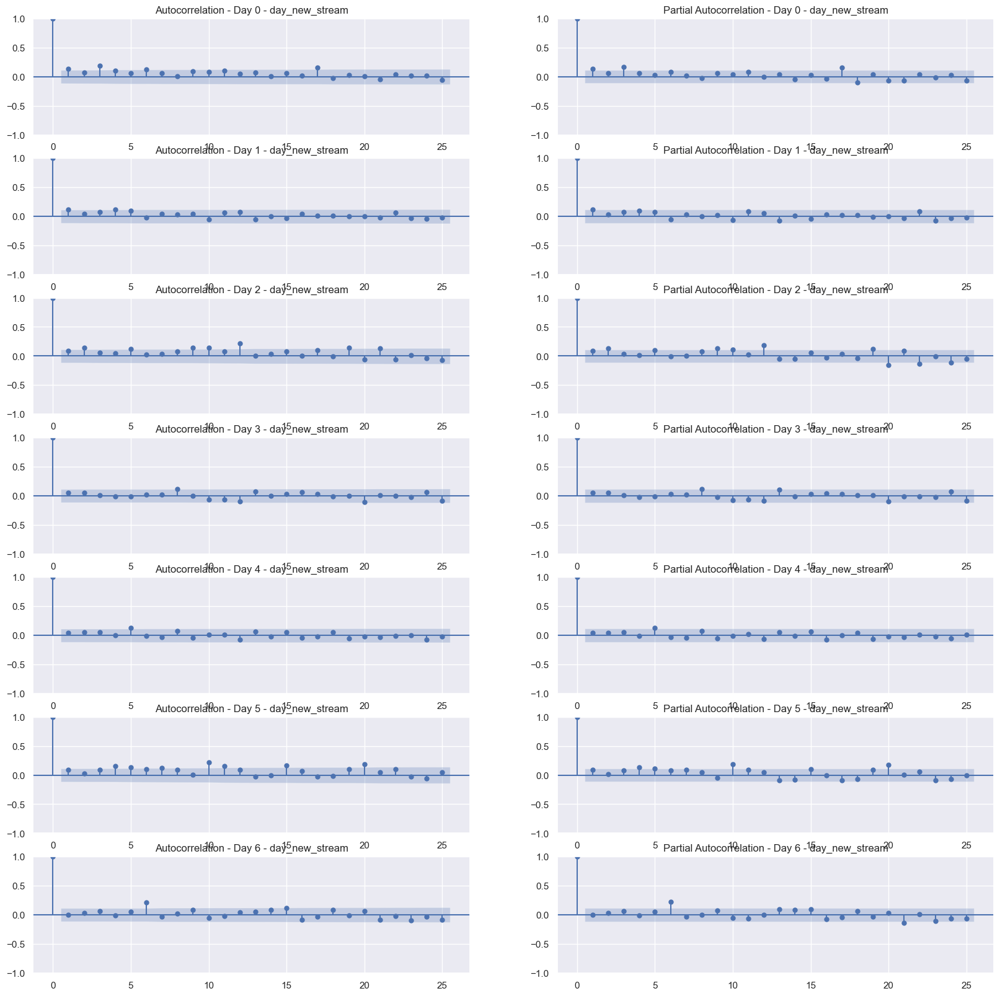

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_song --------------------------------------------------------------------


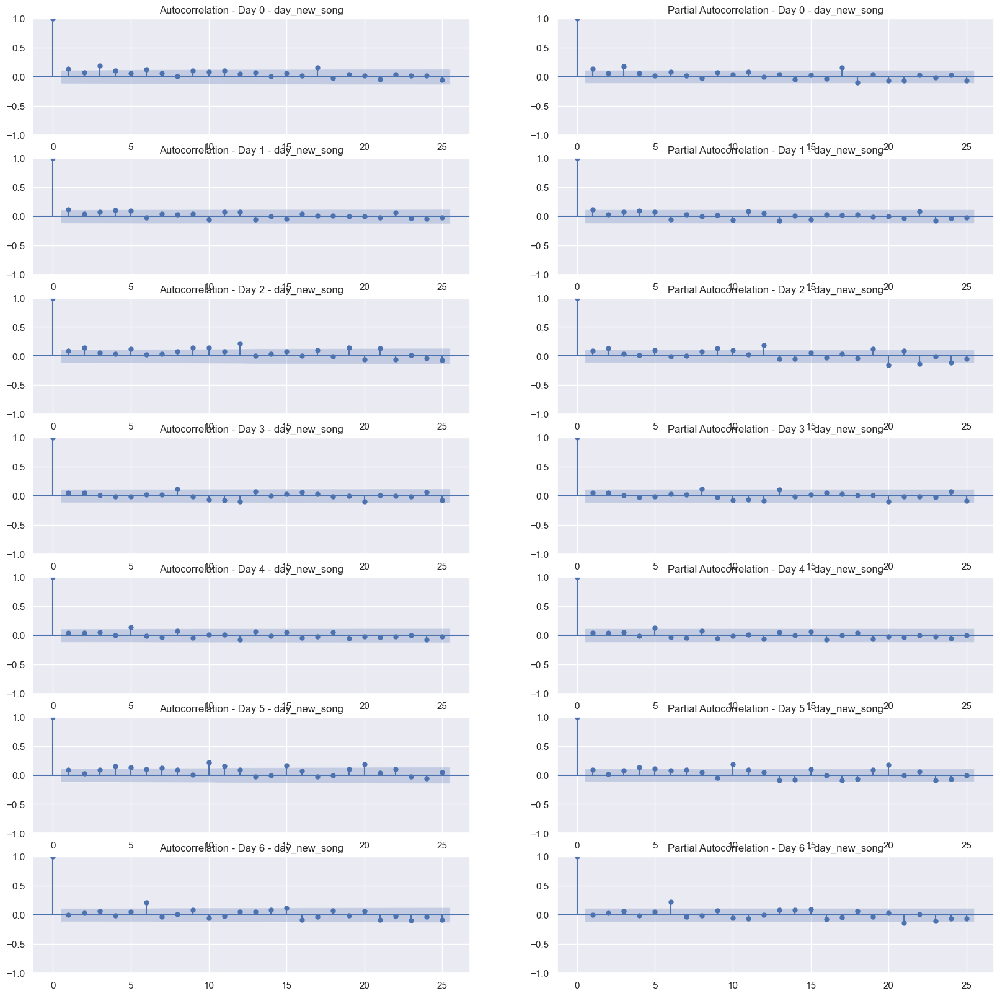

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_podcast --------------------------------------------------------------------


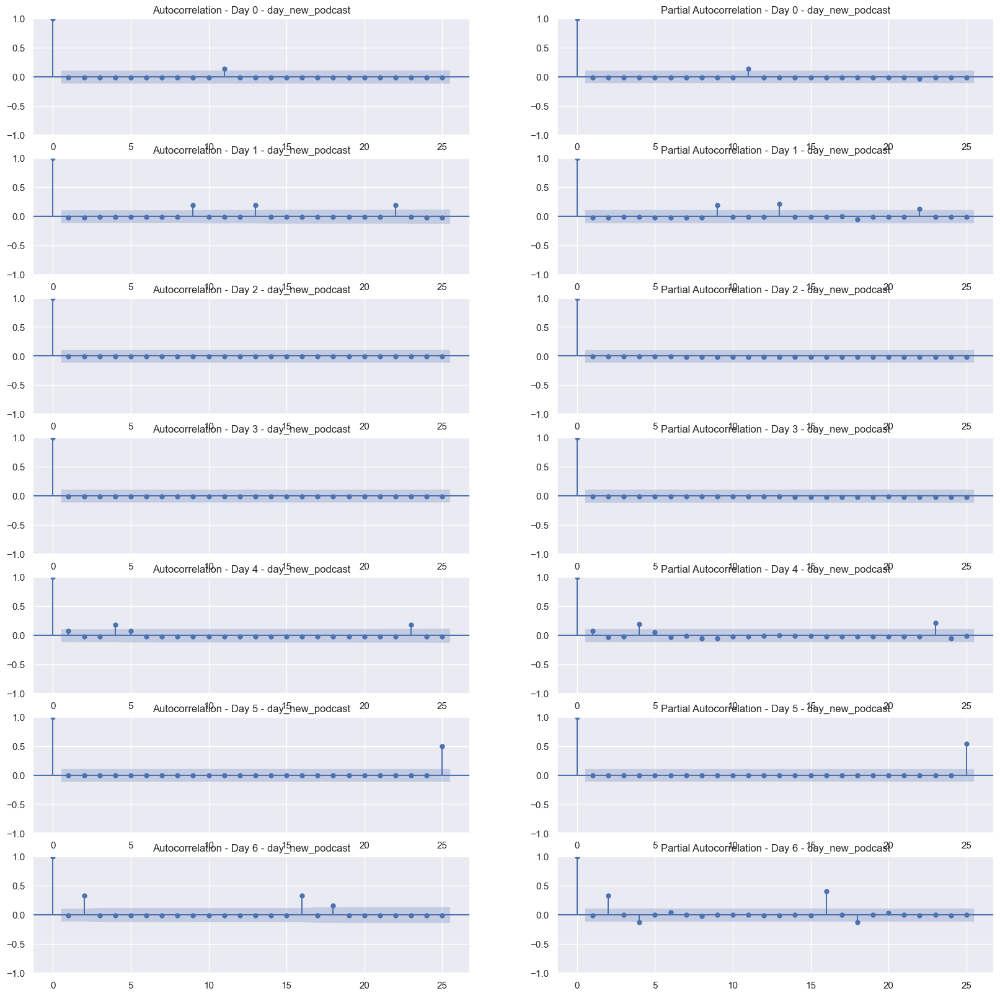

------------------------------------------------------------------------------------------------------------------------


In [88]:
for i in TARGETS:
    print('-------------------------------------------- ' + str(i) + ' --------------------------------------------------------------------')    
    plot_dailies(data = i)
    print('------------------------------------------------------------------------------------------------------------------------')


In [89]:
df.drop('week_day', inplace=True, axis=1)

##### It is clearly visible there is no corralation between same dayweeks
- Maybe between hours we can find that correlation in same dayweeks, but between days and the small duration of streams 


# Proving Our Serie is Stationary

In [90]:
def analyze_stationarity(timeseries, title, target):
    fig, ax = plt.subplots(3, 1, figsize=(20, 12))

    rolmean = pd.Series(timeseries).rolling(window='30D').mean() 
    rolstd = pd.Series(timeseries).rolling(window='30D').std()
    ax[0].plot(timeseries, label= title)
    ax[0].plot(rolmean, label='rolling mean');
    ax[0].plot(rolstd, label='rolling std (x10)');
    ax[0].set_title('30-day window')
    ax[0].legend()
    
    rolmean = pd.Series(timeseries).rolling(window='270D').mean() 
    rolstd = pd.Series(timeseries).rolling(window='270D').std()
    ax[1].plot(timeseries, label= title)
    ax[1].plot(rolmean, label='rolling mean');
    ax[1].plot(rolstd, label='rolling std (x10)');
    ax[1].set_title('365-day window')
    ax[1].legend()
    
    x = range(0, len(df.index))
    rolmean = [np.mean(df.loc[:x, i]) for x in df.index]
    rolstd = [np.std(df.loc[:x, i]) for x in df.index]
    ax[2].plot(x, timeseries, label= title)
    ax[2].plot(rolmean, label='rolling mean');
    ax[2].plot(rolstd, label='rolling std (x10)');
    ax[2].set_title('increasing day window')
    ax[2].legend()
    
    plt.show()

-------------------------------------------- day_n_streams --------------------------------------------------------------------


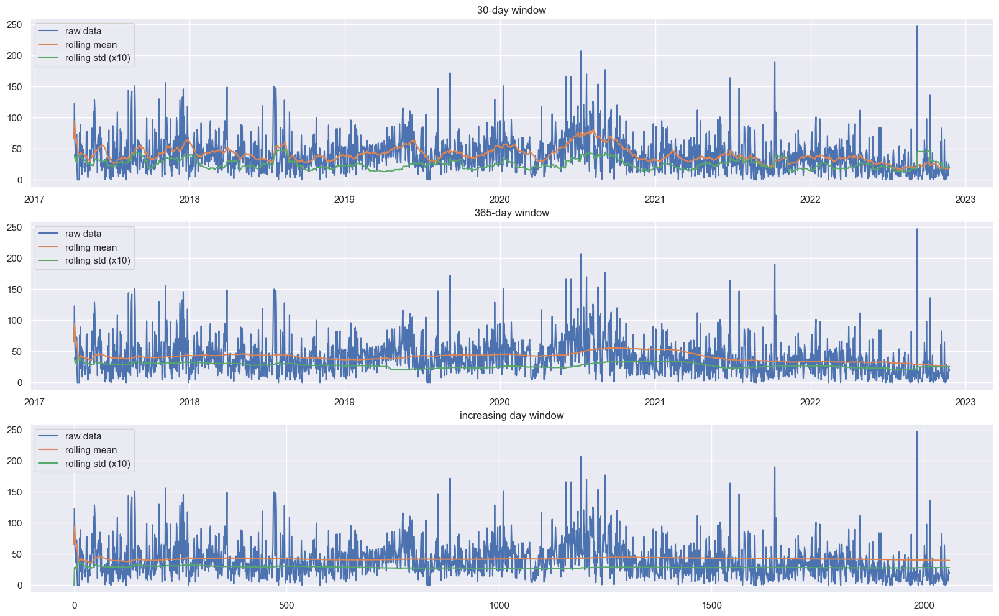

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_n_songs --------------------------------------------------------------------


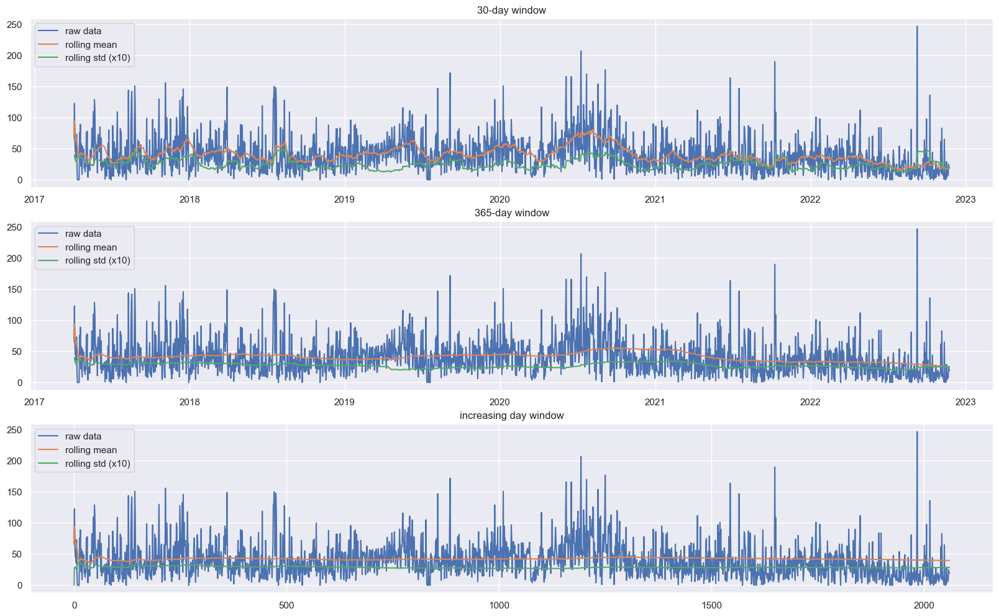

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_n_podcast --------------------------------------------------------------------


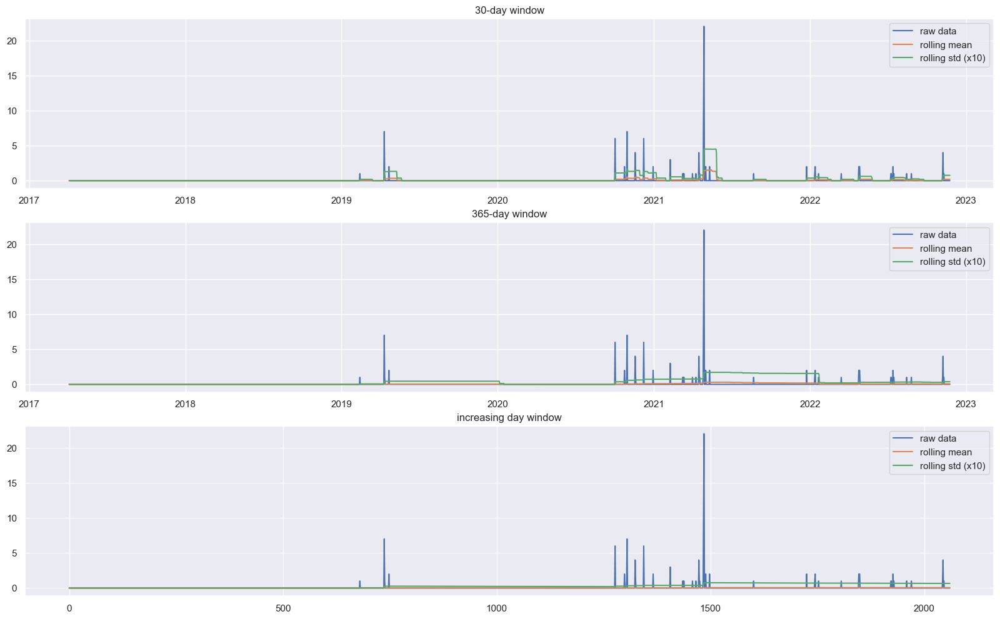

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_stream --------------------------------------------------------------------


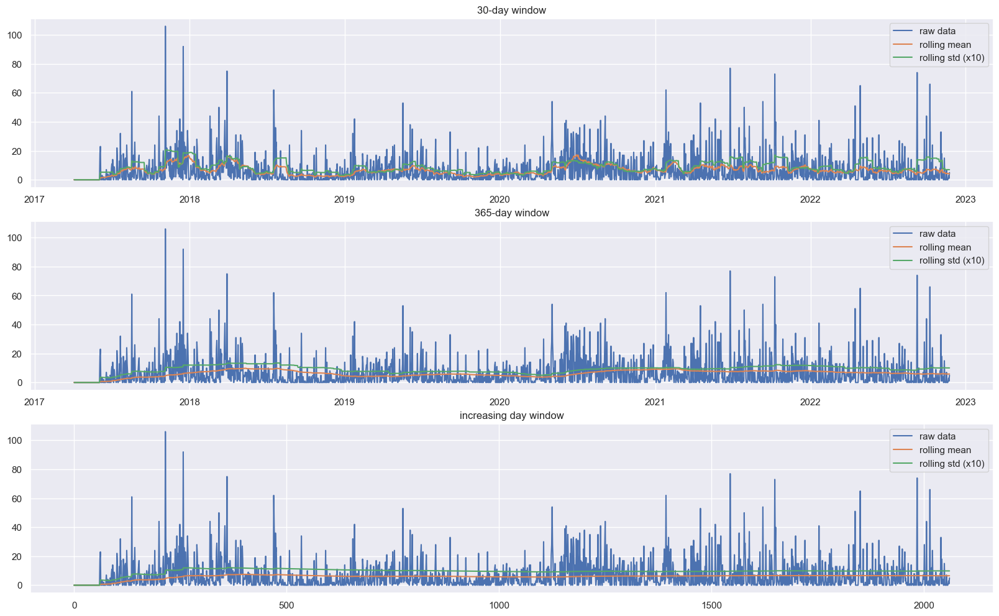

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_song --------------------------------------------------------------------


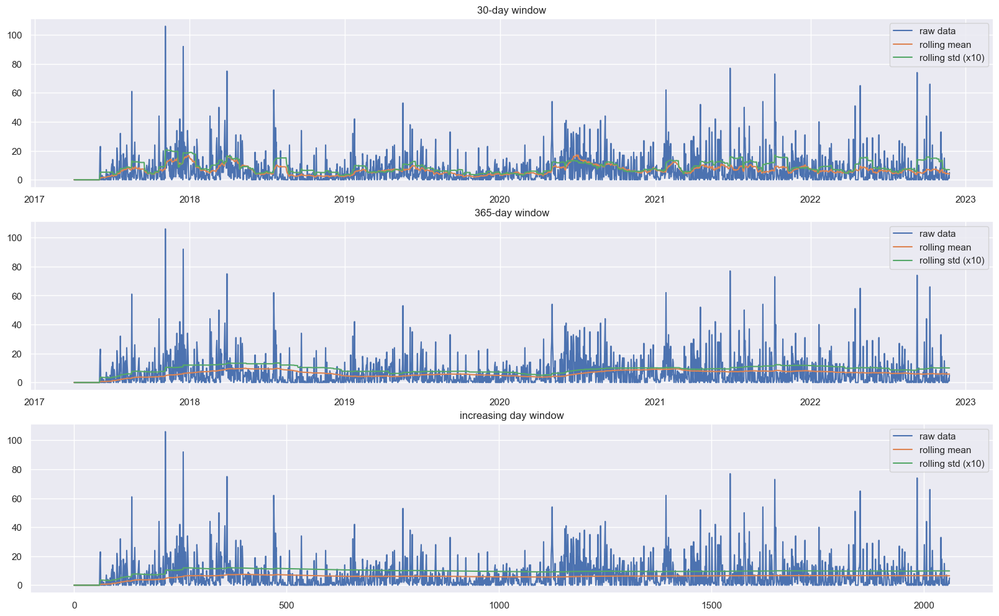

------------------------------------------------------------------------------------------------------------------------
-------------------------------------------- day_new_podcast --------------------------------------------------------------------


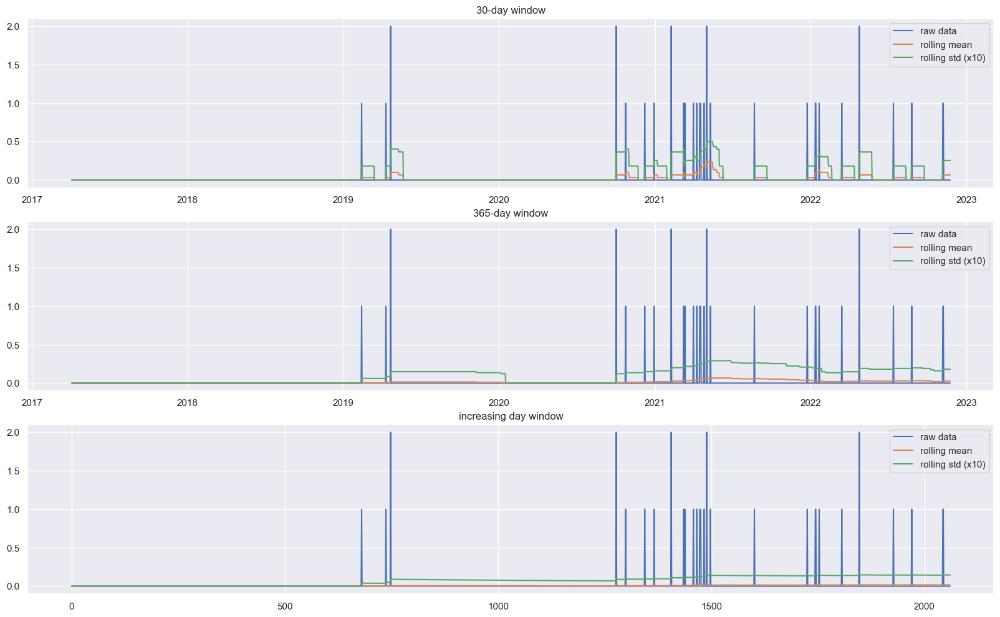

------------------------------------------------------------------------------------------------------------------------


In [91]:
for i in TARGETS:
    print('-------------------------------------------- ' + str(i) + ' --------------------------------------------------------------------')    
    analyze_stationarity(df[i], 'raw data', i)
    print('------------------------------------------------------------------------------------------------------------------------')

In [92]:
##### We can observe the rolling mean and std preatty stable while increasing the window, but we cant affirm yet the serie is statioanry

### Stationarity Tests


#### Dickey-Fuller Test

In [93]:
#### Dickey Fuller
    # Null Hypothesis (H0): If failed to be rejected, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.
    # Alternate Hypothesis (H1): The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure.
        # p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

    # p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
    # p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.
    
    # ADF Statistic < %Percetnajes -- Confidence Rechanzando

In [94]:
#define function for ADF test
def adf_test(timeseries, i, c = 1):
    #Perform Dickey-Fuller test:
    if(c == 1):
        print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    
    if(c == 1):
        print (dfoutput)
    
    if(dftest[1] < 0.05):
        if(c == 1):
            print('\n', i, '-- is STATIONARY')
        return 0
    
    else:
        if(c == 1):
            print('\n', i, 'is NOT Stationary')
        return 1

In [95]:
fuller_station = []

for i in TARGETS:
    print('------------------------------------------- ' + str(i) + ' -------------------------------------------------------------------')    
    fuller_station.append(adf_test(df[i], i))
    print('------------------------------------------------------------------------------------------------------------------------\n\n')

print(fuller_station)

------------------------------------------- day_n_streams -------------------------------------------------------------------
Results of Dickey-Fuller Test:
Test Statistic                -6.877217e+00
p-value                        1.464133e-09
#Lags Used                     1.400000e+01
Number of Observations Used    2.046000e+03
Critical Value (1%)           -3.433550e+00
Critical Value (5%)           -2.862954e+00
Critical Value (10%)          -2.567523e+00
dtype: float64

 day_n_streams -- is STATIONARY
------------------------------------------------------------------------------------------------------------------------


------------------------------------------- day_n_songs -------------------------------------------------------------------
Results of Dickey-Fuller Test:
Test Statistic                -6.871405e+00
p-value                        1.512352e-09
#Lags Used                     1.400000e+01
Number of Observations Used    2.046000e+03
Critical Value (1%)           -3.

https://www.analyticsvidhya.com/blog/2018/09/non-stationary-time-series-python/

https://www.analyticsvidhya.com/blog/2016/02/time-series-forecasting-codes-python/

#### KPSS

In [96]:
#define function for kpss test
from statsmodels.tsa.stattools import kpss
#define KPSS
def kpss_test(timeseries, i, c = 1):
    if(c == 1):
        print ('Results of KPSS Test: -- ', i)
    kpsstest = kpss(timeseries, regression='c')
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    
    if(c == 1):
        print (kpss_output)
    
    if(kpsstest[1] < 0.05):
        if(c == 1):
            print('\n', i, '-- is STATIONARY')
        return 0
    
    else:
        if(c == 1):
            print('\n', i, 'is NOT Stationary')
        return 1
    

In [97]:
kpss_station = []

for i in TARGETS:
    print('------------------------------------------- ' + str(i) + ' -------------------------------------------------------------------')    
    kpss_station.append(kpss_test(df[i], i))
    print('------------------------------------------------------------------------------------------------------------------------\n\n')

print(kpss_station)

------------------------------------------- day_n_streams -------------------------------------------------------------------
Results of KPSS Test: --  day_n_streams
Test Statistic            1.606838
p-value                   0.010000
Lags Used                21.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64

 day_n_streams -- is STATIONARY
------------------------------------------------------------------------------------------------------------------------


------------------------------------------- day_n_songs -------------------------------------------------------------------
Results of KPSS Test: --  day_n_songs
Test Statistic            1.621748
p-value                   0.010000
Lags Used                21.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: floa

### <span style='background :yellow' > Make Serie Stationary: </span>
- Serveral Ways

3. Types of Stationarity
Let us understand the different types of stationarities and how to interpret the results of the above tests.

- Strict Stationary: A strict stationary series satisfies the mathematical definition of a stationary process. For a strict stationary series, the mean, variance and covariance are not the function of time. The aim is to convert a non-stationary series into a strict stationary series for making predictions.

- Trend Stationary: A series that has no unit root but exhibits a trend is referred to as a trend stationary series. Once the trend is removed, the resulting series will be strict stationary. The KPSS test classifies a series as stationary on the absence of unit root. This means that the series can be strict stationary or trend stationary.

- Difference Stationary: A time series that can be made strict stationary by differencing falls under difference stationary. ADF test is also known as a difference stationarity test.

4. Posible Cases:

- Case 1: Both tests conclude that the series is not stationary -> series is not stationary
- Case 2: Both tests conclude that the series is stationary -> series is stationary
- Case 3: KPSS = stationary and ADF = not stationary  -> trend stationary, remove the trend to make series strict stationary
- Case 4: KPSS = not stationary and ADF = stationary -> difference stationary, use differencing to make series stationary

In [98]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning

In [99]:
def run_stationary_test(TARGETS, df):
    fuller_station = []
    kpss_station = []
    for i in TARGETS:
        fuller_station.append(adf_test(df[i], i, 0))
        kpss_station.append(kpss_test(df[i], i, 0))
    
    return fuller_station, kpss_station

In [100]:
def cases(kp = kpss_station, fl = fuller_station, TS = TARGETS):
    station = []
    
    for k,f,i in zip(kp, fl, TS):
        if (k == 1 and f == 1):
            #print(i, '-- Case 1: Not Stationary\n')
            station.append(1)
        
        elif(k == 0 and f == 0):
            #print(i, '-- Case 2: Stationary\n')
            station.append(2)
        
        elif(k == 0 and f == 1):
            #print(i, '-- Case 3: Trend Stationary -- Remove Trend for Strict Statinary Serie\n')
            station.append(3)
    
        elif(k == 1 and f == 0):
            #print(i, '-- Case 4: Difference Stationary -- Use differencing to make serie Stationary\n')
            station.append(4)
        
        else:
            print('ERROR')
        
    return station

In [101]:
# In this method, we compute the difference of consecutive terms in the series. 
# Differencing is typically performed to get rid of the varying mean. Mathematically, 
# differencing can be written as:
def differencing(df, i):
    df[i + '_diff'] = df[i] - df[i].shift(1)
    #df[i + '_diff'].dropna().plot(figsize=(12, 8))
    
# In seasonal differencing, instead of calculating the difference between consecutive values, 
# we calculate the difference between an observation and a previous observation from the same season. 
# For example, an observation taken on a Monday will be subtracted from an observation taken on the previous Monday. 
def seasonal_diff(df, i, time = 'd'):
    if time == 'd':
        n=7
    
    elif time == 'h':
        n=24
        
    else:
        print('ERROR')
        return 0
        
    df[i + '_diff'] = df[i] - df[i].shift(n)
    
# Transformations are used to stabilize the non-constant variance of a series. 
# Common transformation methods include power transform, square root, and log transform. 
# Let’s do a quick log transform and differencing on our air passenger dataset:
def transformation(df, i):
    df[i + '_log'] = np.log(train[i])
    df[i + '_log_diff'] = df[i + '_log'] - df[i + '_log'].shift(1)
    df[i + '_log_diff'].dropna(inplace = True)
    #train[i + '_log_diff'].dropna()

In [102]:
def to_stationary(station, TARGETS):
    for s,i in zip(station, TARGETS):
        if s == 1:
            #print(i + '-- No Stationary -- Transformation\n')
            transformation(df, i)
        
        elif s == 2:
            #print(i + '-- Stationary -- Continue\n')
            pass
        
        elif s == 3:
            #print(i, '-- Trend Stationary -- Remove Trend for Strict Statinary\n')
            seasonal_diff(df, i , 'd')
        
        elif s == 4:
            #print(i, '-- Difference Stationary -- Use differencing to make serie Stationary\n')
            differencing(df, i)
        
        else:
            print('ERROR')
            return -1

    #print(station)
    df.dropna(inplace=True)
    df.head()
    
    return 0

In [103]:
def modify_Targets(st, TS = TARGETS, df = df, no_ts = [], c = 0):
    counter = c
    nt = no_ts.copy()
    TAGS = list(df.columns)
    
    #print('df TAGS -- ', TAGS)
    #print('\n Actual TAGS -- ', TS)
    #print('\t\t\tmodify - target - st = ', st)
    
    for s,i in zip(st, range(len(st))):
        if s != 2:
            nt.append(TS[i])
            counter = counter + 1
            
    #print('\n Remove from df TAGS -- ', nt)
    
    for n in nt:
        TAGS.remove(n)
        
    #print('\n New TAGS --', TAGS)
        
    return TAGS, nt, counter

In [104]:
# Generated Info
i = 0
counter = 0
lp = 3
aux = 1

nt = []
station = []
fuller_station = []
kpss_station = []

def recursive_station(df, targets, nt, c, i, loop_condition = aux):
    warnings.simplefilter('ignore')
    print('Original Targets nº', i, targets)
    
    fuller_station, kpss_station = run_stationary_test(targets, df)
    print('fuller result = ', fuller_station)
    print('kpss result = ', kpss_station)
    
    # def cases(kp = kpss_station, fl = fuller_station, TS = TARGETS):
    station = cases(kp = kpss_station, fl = fuller_station, TS = targets).copy()
    print('Cases Station = ', station) # Station = [1,2,2,3,3,4,4]
    
    # If Station = [2,2,2,2,2,2] -- All 2. RETURN / END
    if(sum(station) == len(station)*2):
        print('All Stationary')
        return tags
    
    # ELSE
    to_stationary(station, targets)
    tags, nt, counter = modify_Targets(st = station, TS = targets, df = df, no_ts = nt, c = c)
    
    print('\nc = ', c)
    print('\nnt = ', nt)
    print('\ndf.colums = ', list(df.columns))
    print('\ntags = Targets = ', tags)
    
    fuller_station, kpss_station = run_stationary_test(tags, df)
    
    if(loop_condition == lp):
        print('\n______________________________Ended Manualy______________________________\n')
        return tags
    
    elif(sum(fuller_station) >=1 or sum(kpss_station)>= 1):
        print('----------------------- iteration number º ', i, ' ------------------------------')
        i = i+1
        
        print('TARGETS = ', targets)
        print('____________________________________________________________________________________________________')
        print('____________________________________________________________________________________________________\n')
        
        loop_condition = loop_condition + 1
        recursive_station(df, tags, nt, c, i, loop_condition)
        
    else:
        return tags

In [105]:
ts = recursive_station(df, TARGETS, nt, counter, i)
print('____________________________ TARGETS -- \n', ts, '\n')

Original Targets nº 0 ['day_n_streams', 'day_n_songs', 'day_n_podcast', 'day_new_stream', 'day_new_song', 'day_new_podcast']
fuller result =  [0, 0, 0, 0, 0, 0]
kpss result =  [0, 0, 0, 1, 1, 0]
Cases Station =  [2, 2, 2, 4, 4, 2]

c =  0

nt =  ['day_new_stream', 'day_new_song']

df.colums =  ['day_n_streams', 'day_n_songs', 'day_n_podcast', 'day_new_stream', 'day_new_song', 'day_new_podcast', 'day_new_stream_diff', 'day_new_song_diff']

tags = Targets =  ['day_n_streams', 'day_n_songs', 'day_n_podcast', 'day_new_podcast', 'day_new_stream_diff', 'day_new_song_diff']
----------------------- iteration number º  0  ------------------------------
TARGETS =  ['day_n_streams', 'day_n_songs', 'day_n_podcast', 'day_new_stream', 'day_new_song', 'day_new_podcast']
____________________________________________________________________________________________________
____________________________________________________________________________________________________

Original Targets nº 1 ['day_n_s

In [106]:
def clean_targets(df, tags):
    df = df[tags]
    return df

print(df.head(1))
df = clean_targets(df, ts)
df.head(1)

            day_n_streams  day_n_songs  day_n_podcast  day_new_stream  \
2017-04-07             45           45              0               0   

            day_new_song  day_new_podcast  day_new_stream_diff  \
2017-04-07             0                0                  0.0   

            day_new_song_diff  day_new_stream_diff_diff  \
2017-04-07                0.0                       0.0   

            day_new_song_diff_diff  day_new_stream_diff_diff_diff  \
2017-04-07                     0.0                            0.0   

            day_new_song_diff_diff_diff  
2017-04-07                          0.0  


KeyError: None

https://towardsdatascience.com/stationarity-in-time-series-analysis-90c94f27322

##### <span style='background :yellow' > Debería ser una función recursiva </span>    <span style='background :lightgreen'>   YA ESTA HECHO PERO FALLA LA TRANSFORMACIÓN </span>

# <span style='background :yellow' > Single - Step </span>  <span style='background :lightgreen'> Solved With TS CROSS VALIDATION ?? </span>

https://www.theclickreader.com/single-step-time-series-forecasting/

## <span style='background :lightgreen' > Baseline Prediction Methods <span>

https://towardsdatascience.com/baseline-models-your-guide-for-model-building-1ec3aa244b8d

### the persistence algorithm
https://machinelearningmastery.com/persistence-time-series-forecasting-with-python/

Tenemos 6 variables a predecir:
- Nº Streams
- Nº Songs
- Nº Podcasts


- Nº New Streams
- Nº New Songs
- Nº New Podcasts


La correlacion entre estas variables es muy alta, por lo que usar alguna para predecir otra sería un 'fake feature'
Por ello, necesitamos predecirlas por separado.


En cuanto a Nº Streams y Nº (tanto como para news), Se utilizará de baseline siempre predecir la media. Y en cuanto a Nº Podcasts se utilizará de Baseline que se escucharán 0.

In [107]:
df[TARGETS].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2058 entries, 2017-04-07 to 2022-11-24
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   day_n_streams    2058 non-null   int64
 1   day_n_songs      2058 non-null   int64
 2   day_n_podcast    2058 non-null   int64
 3   day_new_stream   2058 non-null   int64
 4   day_new_song     2058 non-null   int64
 5   day_new_podcast  2058 non-null   int64
dtypes: int64(6)
memory usage: 112.5 KB


In [108]:
df[TARGETS].describe()

,day_n_streams,day_n_songs,day_n_podcast,day_new_stream,day_new_song,day_new_podcast
count,2058.000000,2058.000000,2058.000000,2058.000000,2058.000000,2058.000000
mean,39.735666,39.676871,0.058795,6.524781,6.508260,0.016521
std,28.350489,28.352134,0.667273,9.866075,9.859202,0.145318
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,20.000000,0.000000,0.000000,0.000000,0.000000
50%,35.000000,34.000000,0.000000,3.000000,3.000000,0.000000
75%,53.000000,53.000000,0.000000,9.000000,9.000000,0.000000
max,247.000000,247.000000,22.000000,106.000000,106.000000,2.000000


<span style='background :yellow' > Aún sin realizar el proceso se asume que el método de los podcast tiene mejor baseline que predicción, por lo que no se realizara una prediccion directa de sus variables </span>
    
    
<span style='background :yellow' > En cuanto al número de streams y canciones (nuevas o totales), se asume que es mejor la prediccion obtenida con machine learning </span>


Como la correlación de estas dos variables es muy muy alta, de hecho en este dataset concreto es de uno. para otro usuario puede pasar lo mismo con podcast. La candición para tomar la siguiente decisión vendra determinada por los errores de las predicciones, mientras tante, se asume, que el resultado de las predicciones para obtener el número de podcasts va a ser:


Pred Nº Podcasts = Nº Streams - Nº songs


Pred Nº New Podcasts = Nº New Streams - Nº New songs

### Split dataframes

In [109]:
df_name_list = []

for i in TARGETS:
    exec("df_" + i + " = df[i]")
    df_name_list.append('df_' + i)

In [110]:
dataframes = {}

for i in df_name_list:
    dataframes[i] = eval(i).to_frame()

In [111]:
list(dataframes.keys())

['df_day_n_streams',
 'df_day_n_songs',
 'df_day_n_podcast',
 'df_day_new_stream',
 'df_day_new_song',
 'df_day_new_podcast']

### Baseline Methods - Dummy Regressor

In [112]:
for d in dataframes:
    dataframes[d]['t-1'] = dataframes[d][d.replace('df_', '')].shift(1)
    dataframes[d].dropna(inplace = True)
    dataframes[d]['i'] = [i for i in range(dataframes[d].shape[0])]
    print(dataframes[d].head())

            day_n_streams   t-1  i
2017-04-08             56  45.0  0
2017-04-09             36  56.0  1
2017-04-10             73  36.0  2
2017-04-11             18  73.0  3
2017-04-12              0  18.0  4
            day_n_songs   t-1  i
2017-04-08           56  45.0  0
2017-04-09           36  56.0  1
2017-04-10           73  36.0  2
2017-04-11           18  73.0  3
2017-04-12            0  18.0  4
            day_n_podcast  t-1  i
2017-04-08              0  0.0  0
2017-04-09              0  0.0  1
2017-04-10              0  0.0  2
2017-04-11              0  0.0  3
2017-04-12              0  0.0  4
            day_new_stream  t-1  i
2017-04-08               0  0.0  0
2017-04-09               0  0.0  1
2017-04-10               0  0.0  2
2017-04-11               0  0.0  3
2017-04-12               0  0.0  4
            day_new_song  t-1  i
2017-04-08             0  0.0  0
2017-04-09             0  0.0  1
2017-04-10             0  0.0  2
2017-04-11             0  0.0  3
2017-04-12   

# Split data in Train and Set
##### <span style='background :lightgreen' > Counts as single step prediction?? </span>

In [113]:
X_l = []
y_l = []

X_d = {}
y_d = {}

for d,i in zip(dataframes, range(len(dataframes))):
    exec("X_" + str(d.replace('df_','')) + " = dataframes[d]['t-1']")
    exec("y_" + str(d.replace('df_','')) + " = dataframes[d][d.replace('df_', '')]")
    X_l.append('X_' + str(d.replace('df_','')))
    y_l.append('y_' + str(d.replace('df_','')))
    

for x,y in zip(X_l, y_l):
    X_d[x] = eval(x)
    y_d[y] = eval(y)
    

In [114]:
# persistence model
def model_persistence(x):
    return x

In [115]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

# Evaluate Forecast
test_size = 1
predictions = []

for xd,yd,d in zip(X_d, y_d, dataframes):
    predict = []
    for x in X_d[xd][-test_size:]:
        yhat = model_persistence(x)
        predict.append(yhat)
        
    mse = mean_squared_error(y_d[yd][-test_size:], predict)
    mae = mean_absolute_error(y_d[yd][-test_size:], predict)
    #r2 = r2_score(y_d[yd][-test_size:], predict)
    print(d)
    
    print('\nPrediction Vs Original')
    print('\t', str(predict).replace('[', '').replace(']',''), '--', int(y_d[yd][-test_size:].values), '\n')
    
    print('Test MSE: %.3f' % mse)
    print('Test MAE: %.3f' % mae)
    #print('Test MAE: %.3f' % r2)
    predictions.append(predict)
    
    print('---------------------------------------')
    print('---------------------------------------\n')
    


df_day_n_streams

Prediction Vs Original
	 21.0 -- 19 

Test MSE: 4.000
Test MAE: 2.000
---------------------------------------
---------------------------------------

df_day_n_songs

Prediction Vs Original
	 21.0 -- 19 

Test MSE: 4.000
Test MAE: 2.000
---------------------------------------
---------------------------------------

df_day_n_podcast

Prediction Vs Original
	 0.0 -- 0 

Test MSE: 0.000
Test MAE: 0.000
---------------------------------------
---------------------------------------

df_day_new_stream

Prediction Vs Original
	 1.0 -- 5 

Test MSE: 16.000
Test MAE: 4.000
---------------------------------------
---------------------------------------

df_day_new_song

Prediction Vs Original
	 1.0 -- 5 

Test MSE: 16.000
Test MAE: 4.000
---------------------------------------
---------------------------------------

df_day_new_podcast

Prediction Vs Original
	 0.0 -- 0 

Test MSE: 0.000
Test MAE: 0.000
---------------------------------------
---------------------------------

# <span style='background :lightgreen' > What is the best Evaluation Metric: MAE, MSE... <span>

https://sitiobigdata.com/2018/08/27/machine-learning-metricas-regresion-mse/#

##### <span style='background :yellow' > Cross_val_score ?? </span>

## Cross Validation

https://medium.com/@soumyachess1496/cross-validation-in-time-series-566ae4981ce4

https://goldinlocks.github.io/Time-Series-Cross-Validation/

https://www.sciencedirect.com/science/article/abs/pii/S0020025511006773

##### <span style='background :lightgreen' > Time serie Split Cross Validation </span>

In [116]:
# Evaluate Forecast

In [117]:
%%time
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

c = 0
test_size = 1

predictions = []
cv_b_mse = []
cv_b_mae = []

for xd,yd,d in zip(X_d, y_d, dataframes):
    cc = 0
    predict = []
    b_mse = []
    b_mae = []
    
    tscv = TimeSeriesSplit(max_train_size=None, n_splits = 5, test_size=test_size)
    #print(tscv)

    print('__________________________________', d, '_____________________________________\n')
    
    for train_index, test_index in tscv.split(X_d[xd]):
        pre = []
        
        print('TRAIN:', train_index, 'TEST:', test_index) 
        print('type', type(train_index), type(test_index))
        #print(type(X_d[xd][train_index]))
        #print(X_d[xd][train_index])
        X_train, X_test = X_d[xd][train_index], X_d[xd][test_index]
        y_train, y_test = y_d[yd][train_index], y_d[yd][test_index]

        for x in X_test:
            yhat = model_persistence(x)
            pre.append(yhat)
            print('\nX_test = ', x, '-- Predict = ', yhat, '\n')
        
        for x in test_index:
            print('T = ', dataframes[d].loc[dataframes[d]['i'] == x], '\nT-1', dataframes[d].loc[dataframes[d]['i'] == x-1])
            
        predict.append(pre)
        
        b_mse.append(mean_squared_error(y_test, pre))
        b_mae.append(mean_absolute_error(y_test, pre))
        print('\nBaseline_MSE = ', b_mse[cc], '-- Baseline_MAE = ', b_mae[cc])
        
        cc = cc+1
        
        print('\n------------------------------------------------------------------------\n')
    
    predictions.append(predict)
    
    cv_b_mse.append(np.mean(b_mse))
    cv_b_mae.append(np.mean(b_mae))
    print('\nMSE = ', cv_b_mse[c])
    print('\nMAE = ', cv_b_mae[c])
    
    c = c+1
    
    print('_______________________________________________________________________________________')
    print('_______________________________________________________________________________________\n')



__________________________________ df_day_n_streams _____________________________________

TRAIN: [   0    1    2 ... 2049 2050 2051] TEST: [2052]
type <class 'numpy.ndarray'> <class 'numpy.ndarray'>

X_test =  16.0 -- Predict =  16.0 

T =              day_n_streams   t-1     i
2022-11-20              9  16.0  2052 
T-1             day_n_streams  t-1     i
2022-11-19             16  4.0  2051

Baseline_MSE =  49.0 -- Baseline_MAE =  7.0

------------------------------------------------------------------------

TRAIN: [   0    1    2 ... 2050 2051 2052] TEST: [2053]
type <class 'numpy.ndarray'> <class 'numpy.ndarray'>

X_test =  9.0 -- Predict =  9.0 

T =              day_n_streams  t-1     i
2022-11-21              7  9.0  2053 
T-1             day_n_streams   t-1     i
2022-11-20              9  16.0  2052

Baseline_MSE =  4.0 -- Baseline_MAE =  2.0

------------------------------------------------------------------------

TRAIN: [   0    1    2 ... 2051 2052 2053] TEST: [2054]
type

In [118]:
for i,mae,mse in zip(dataframes, cv_b_mae, cv_b_mse):
    print(i )
    print('\n\tMAE: ', mae)
    print('\tMSE: ', np.round(mse, 3))
    print('__________________________________________\n')

df_day_n_streams

	MAE:  6.6
	MSE:  79.4
__________________________________________

df_day_n_songs

	MAE:  6.6
	MSE:  79.4
__________________________________________

df_day_n_podcast

	MAE:  0.0
	MSE:  0.0
__________________________________________

df_day_new_stream

	MAE:  1.8
	MSE:  5.0
__________________________________________

df_day_new_song

	MAE:  1.8
	MSE:  5.0
__________________________________________

df_day_new_podcast

	MAE:  0.0
	MSE:  0.0
__________________________________________



##### <span style='background :yellow' > Blocked Cross Validation </span>

In [119]:
class BlockingTimeSeriesSplit():
    def __init__(self, n_splits):
        self.n_splits = n_splits
    
    def get_n_splits(self, X, y, groups):
        return self.n_splits
    
    def split(self, X, y=None, groups=None):
        n_samples = len(X)
        k_fold_size = n_samples // self.n_splits
        indices = np.arange(n_samples)

        margin = 0
        for i in range(self.n_splits):
            start = i * k_fold_size
            stop = start + k_fold_size
            mid = int(0.999999 * (stop - start)) + start
            yield indices[start: mid], indices[mid + margin: stop]

https://medium.com/@soumyachess1496/cross-validation-in-time-series-566ae4981ce4

In [120]:
%%time
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

c = 0
test_size = 1

predictions = []
cv_b_mse = []
cv_b_mae = []

for xd,yd,d in zip(X_d, y_d, dataframes):
    cc = 0
    predict = []
    b_mse = []
    b_mae = []
    
    tscv = BlockingTimeSeriesSplit(n_splits = 5)
    #print(tscv)

    print('__________________________________', d, '_____________________________________\n')
    
    for train_index, test_index in tscv.split(X_d[xd]):
        pre = []
        
        #print('TRAIN:', train_index, 'TEST:', test_index)
        print('type', type(train_index), type(test_index))
        #print(type(X_d[xd][train_index]))
        #print(X_d[xd][train_index])
        X_train, X_test = X_d[xd][train_index], X_d[xd][test_index]
        y_train, y_test = y_d[yd][train_index], y_d[yd][test_index]

        for x in X_test:
            yhat = model_persistence(x)
            pre.append(yhat)
            print('\nX_test = ', x, '-- Predict = ', yhat, '\n')
        
        for x in test_index:
            print('T = ', dataframes[d].loc[dataframes[d]['i'] == x], '\nT-1', dataframes[d].loc[dataframes[d]['i'] == x-1])
            
        predict.append(pre)
        
        b_mse.append(mean_squared_error(y_test, pre))
        b_mae.append(mean_absolute_error(y_test, pre))
        print('\nBaseline_MSE = ', b_mse[cc], '-- Baseline_MAE = ', b_mae[cc])
        
        cc = cc+1
        
        print('\n------------------------------------------------------------------------\n')
    
    predictions.append(predict)
    
    cv_b_mse.append(np.mean(b_mse))
    cv_b_mae.append(np.mean(b_mae))
    print('\nMSE = ', cv_b_mse[c])
    print('\nMAE = ', cv_b_mae[c])
    
    c = c+1
    
    print('_______________________________________________________________________________________')
    print('_______________________________________________________________________________________\n')



__________________________________ df_day_n_streams _____________________________________

type <class 'numpy.ndarray'> <class 'numpy.ndarray'>

X_test =  33.0 -- Predict =  33.0 

T =              day_n_streams   t-1    i
2018-05-23             30  33.0  410 
T-1             day_n_streams   t-1    i
2018-05-22             33  27.0  409

Baseline_MSE =  9.0 -- Baseline_MAE =  3.0

------------------------------------------------------------------------

type <class 'numpy.ndarray'> <class 'numpy.ndarray'>

X_test =  23.0 -- Predict =  23.0 

T =              day_n_streams   t-1    i
2019-07-08             29  23.0  821 
T-1             day_n_streams   t-1    i
2019-07-07             23  52.0  820

Baseline_MSE =  36.0 -- Baseline_MAE =  6.0

------------------------------------------------------------------------

type <class 'numpy.ndarray'> <class 'numpy.ndarray'>

X_test =  107.0 -- Predict =  107.0 

T =              day_n_streams    t-1     i
2020-08-22             94  107.0  1232

T =              day_new_song  t-1     i
2021-10-07             1  0.0  1643 
T-1             day_new_song  t-1     i
2021-10-06             0  0.0  1642

Baseline_MSE =  1.0 -- Baseline_MAE =  1.0

------------------------------------------------------------------------

type <class 'numpy.ndarray'> <class 'numpy.ndarray'>

X_test =  1.0 -- Predict =  1.0 

T =              day_new_song  t-1     i
2022-11-22             3  1.0  2054 
T-1             day_new_song  t-1     i
2022-11-21             1  0.0  2053

Baseline_MSE =  4.0 -- Baseline_MAE =  2.0

------------------------------------------------------------------------


MSE =  30.8

MAE =  4.8
_______________________________________________________________________________________
_______________________________________________________________________________________

__________________________________ df_day_new_podcast _____________________________________

type <class 'numpy.ndarray'> <class 'numpy.ndarray'>

X_test =  0.0 -- 

In [121]:
for i,mae,mse in zip(dataframes, cv_b_mae, cv_b_mse):
    print(i )
    print('\n\tMAE: ', mae)
    print('\tMSE: ', np.round(mse, 3))
    print('__________________________________________\n')

df_day_n_streams

	MAE:  9.2
	MSE:  114.8
__________________________________________

df_day_n_songs

	MAE:  9.2
	MSE:  114.8
__________________________________________

df_day_n_podcast

	MAE:  0.0
	MSE:  0.0
__________________________________________

df_day_new_stream

	MAE:  4.8
	MSE:  30.8
__________________________________________

df_day_new_song

	MAE:  4.8
	MSE:  30.8
__________________________________________

df_day_new_podcast

	MAE:  0.0
	MSE:  0.0
__________________________________________



Como se observa, es mejor predecir 0, o el resultado del día anterior en cuanto a los datasets de podcasts. Este caso puede ser diferente para otros usuarios, de hecho puede llegar a ser contrario, de un modo que esto mismo ocurra para las canciones.

Esto significa que este tipo de usuario utiliza su cuenta para una única actividad en vez de para las dos.

Como el método base obtiene unos resutlados muy complicados de mejorar, con muy poca computación. Se define como el método adecuado para predecir estas variables.

# <span style='background :red' >  -------------------------------------------- NEXT LEVEL ---------------------------------------------</span>

##### <span style='background :yellow' > Hay que eliminar Variables con Baseline Metric Excesivamente Bajo  <span>

## <span style='background :lightblue' > 1.- Predictions </span>

- <span style='background :beige' > Tree Function </span>

In [122]:
def tree_feature_importance(df, target, split=7, n_s=100, plot = 0, r = 0, sort = 0):
    # Data
    X = df.drop(target, axis=1)
    y = df[target]
    
    # Split
    X_train, X_test = X.iloc[:-split,:], X.iloc[-split:,:]
    y_train, y_test = y.iloc[:-split], y.iloc[-split:]
    
    # Create - Train - Predict
    model = RandomForestRegressor(n_estimators=n_s)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    
    # Evaluation Methods - MAE & MSE
    mae = np.round(mean_absolute_error(y_test, predictions), 3)    
    mse = np.round(mean_squared_error(y_test, predictions), 3)    
    #print('mae', mae)
    #print('mse', mse)
    
    if plot == 0 or plot == 1:
        # Plot Real Vs Prediction
        fig = plt.figure(figsize=(6,3))
        plt.title(f' {target}: Random Forest Real vs Prediction - MAE {mae}', fontsize=20)
        plt.plot(y_test, color='red')
        plt.plot(pd.Series(predictions, index=y_test.index), color='green')
        plt.xlabel('Dais', fontsize=12)
        plt.ylabel('Number of streams listened', fontsize=12)
        plt.legend(labels=['Real', 'Prediction'], fontsize=12)
        plt.grid()
        plt.show()
    
    # Dataframe with Importance of each feature
    if sort == 0:
        df_importances = pd.DataFrame({
            'feature': df.drop(columns = target).columns,
            'importance': model.feature_importances_}
        ).sort_values(by='importance', ascending=False)
    
    if sort == 1:
        df_importances = pd.DataFrame({
            'feature': df.drop(columns = target).columns,
            'importance': model.feature_importances_}
        )
    
    if plot == 0 or plot == 2:
        # Plot Features Importance
        plt.figure(figsize=(12,8))
        plt.title('Variable Importances', fontsize=12)
        sns.barplot(x=df_importances.importance, y=df_importances.feature, orient='h')
        plt.show()
    
    #  Print Importances
    #print('MAE: ', mae)
    #print(df_importances.sort_values(by='importance'), '\n')
    
    if r == 1:
        return mae, mse, df_importances
    
    return mae, mse

- <span style='background :beige' > TS-CV - Tree Function </span>

In [123]:
def tree_feature_importance_cv(df, target, cv_split = 5, test_size = 1, n_s=100, plot = 5, r = 0, sort = 0):
    # Results
    c_predict = []
    c_mae = []
    c_mse = []
    vals = []
    
    # Data
    X = df.drop(target, axis=1)
    y = df[target]
    
    tscv = TimeSeriesSplit(max_train_size=None, n_splits = cv_split, test_size=test_size)

    # Splti CV Data
    for train_index, test_index in tscv.split(X):
        pre = []
        df_i = []
        
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        
        # Transformation for a single feature.
        if X_train.shape[1] == 1:
            X_train = X.iloc[train_index].to_numpy().reshape(-1, 1)
            y_train, y_test = y[train_index], y[test_index]
            
        # Transformation for a single sample.
        if test_size == 1:
            X_test = X.iloc[test_index].to_numpy()
            y_train, y_test = y[train_index], y[test_index]
            
            for x in list(X_test):
                model = RandomForestRegressor(n_estimators=n_s)
                model.fit(X_train, y_train)
                yhat = model.predict(x.reshape(1, -1))
                pre.append(yhat)
                
                # Variable Importance
                if sort == 0:
                    df_importances = pd.DataFrame({
                        'feature': df.drop(columns = target).columns,
                        'importance': model.feature_importances_}
                    ).sort_values(by='importance', ascending=False)
    
                if sort == 1:
                    df_importances = pd.DataFrame({
                        'feature': df.drop(columns = target).columns,
                        'importance': model.feature_importances_}
                    )
                
                df_i.append(df_importances)
                vals.append(df_importances['importance'].values)
            
        else:
            print('AUN YO NO SE')

            
        #print('\nX_test 2.0 :', type(X_test),  X_test.shape, X_test)
        #print('\nX_train 2.0:', type(X_train), X_train.shape, X_train)
        #print(df_i)
        
        
        # CV Predict
        c_predict.append(pre)
        c_mse.append(mean_squared_error(y_test, pre))
        c_mae.append(mean_absolute_error(y_test, pre))
        #print('\nCV_MSE = ', c_mse[-1], '-- CV_MAE = ', c_mae[-1])
    
    # Variable Importance mean CV
    mean_i = pd.DataFrame(columns = ['feature', 'importance'])

    for i, cols in zip(range(len(vals[0])), df_importances['feature']):
        aux = []

        for j in range(len(vals)):
            aux.append(vals[j][i])
        
        mean_i.loc[i, 'feature'] = cols
        mean_i.loc[i, 'importance'] = np.mean(aux)
        
    predictions.append(predict)
    cv_b_mse = np.mean(c_mse)
    cv_b_mae = np.mean(c_mae)
    
    if plot == 1 or plot == 0 or plot == 4:
        print('\nMSE = ', cv_b_mse)
        print('\nMAE = ', cv_b_mae)
    
    if plot == 2 or plot == 4:
        print('\n Predictions: \n', c_predict)
    
    if plot == 3 or plot == 0 or plot == 4:
        print('\n VI\n', mean_i)

    # Create - Train - Predict

    if r == 0:
        return cv_b_mae, cv_b_mse, mean_i
    
    if r == 1:
        return cv_b_mae, cv_b_mse, mean_i, predictions
    
    if r == 2:
        return cv_b_mae, cv_b_mse

- <span style='background :beige' > B-TS-CV - Tree Function </span>

In [124]:
def tree_feature_importance_bcv(df, target, cv_split = 5, n_s=100, plot = 5, r = 0, sort = 0):
    # Results
    c_predict = []
    c_mae = []
    c_mse = []
    vals = []
    
    # Data
    X = df.drop(target, axis=1)
    y = df[target]
    
    tscv = BlockingTimeSeriesSplit(n_splits = cv_split)

    # Splti CV Data
    for train_index, test_index in tscv.split(X):
        pre = []
        df_i = []
        
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        
        # Transformation for a single feature.
        if X_train.shape[1] == 1:
            X_train = X.iloc[train_index].to_numpy().reshape(-1, 1)
            y_train, y_test = y[train_index], y[test_index]
            
        # Transformation for a single sample.
        if test_size == 1:
            X_test = X.iloc[test_index].to_numpy()
            y_train, y_test = y[train_index], y[test_index]
            
            for x in list(X_test):
                model = RandomForestRegressor(n_estimators=n_s)
                model.fit(X_train, y_train)
                yhat = model.predict(x.reshape(1, -1))
                pre.append(yhat)
                
                # Variable Importance
                if sort == 0:
                    df_importances = pd.DataFrame({
                        'feature': df.drop(columns = target).columns,
                        'importance': model.feature_importances_}
                    ).sort_values(by='importance', ascending=False)
    
                if sort == 1:
                    df_importances = pd.DataFrame({
                        'feature': df.drop(columns = target).columns,
                        'importance': model.feature_importances_}
                    )
                
                df_i.append(df_importances)
                vals.append(df_importances['importance'].values)
            
        else:
            print('AUN YO NO SE')

            
        #print('\nX_test 2.0 :', type(X_test),  X_test.shape, X_test)
        #print('\nX_train 2.0:', type(X_train), X_train.shape, X_train)
        #print(df_i)
        
        
        # CV Predict
        c_predict.append(pre)
        c_mse.append(mean_squared_error(y_test, pre))
        c_mae.append(mean_absolute_error(y_test, pre))
        #print('\nCV_MSE = ', c_mse[-1], '-- CV_MAE = ', c_mae[-1])
    
    # Variable Importance mean CV
    mean_i = pd.DataFrame(columns = ['feature', 'importance'])

    for i, cols in zip(range(len(vals[0])), df_importances['feature']):
        aux = []

        for j in range(len(vals)):
            aux.append(vals[j][i])
        
        mean_i.loc[i, 'feature'] = cols
        mean_i.loc[i, 'importance'] = np.mean(aux)
        
    predictions.append(predict)
    cv_b_mse = np.mean(c_mse)
    cv_b_mae = np.mean(c_mae)
    
    if plot == 1 or plot == 0 or plot == 4:
        print('\nMSE = ', cv_b_mse)
        print('\nMAE = ', cv_b_mae)
    
    if plot == 2 or plot == 4:
        print('\n Predictions: \n', c_predict)
    
    if plot == 3 or plot == 0 or plot == 4:
        print('\n VI\n', mean_i)

    # Create - Train - Predict

    if r == 0:
        return cv_b_mae, cv_b_mse, mean_i
    
    if r == 1:
        return cv_b_mae, cv_b_mse, mean_i, predictions
    
    if r == 2:
        return cv_b_mae, cv_b_mse

#### <span style='background :lightgreen' > 1.1.- Generate Lags and Select a number of Lags </span>

- <span style='background :beige' > Generate Lags for better predictions - VI.- VARIABLE IMPORTANCE </span>

Creating lagged dataframes to inspect with the studied information of Autocorrelation and Partial Autocorrelation

- <span style='background :beige' > As we have studied Autocorrelation and Partial-Autocorrelation for all variables we can see best posible options for each variable:  </span>

Partial Autocorrelation <br/>
- day_n_stream = from 5 to 8 <br/>
- day_new_stream = from 3 to 8 <br/>
- day_n_song = same ass n_streams <br/>
- day_new_song = same as new_stream <br/>

We remove this variables because the baseline method already haves awesome results
- day_n_podcast = 1 or 2<br/>
- day_new_podcast = 1 <br/>

https://stackoverflow.com/questions/48818213/make-multiple-shifted-lagged-columns-in-pandas
    
https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.assign.html
        
https://www.geeksforgeeks.org/what-does-the-double-star-operator-mean-in-python/

In [125]:
%%time 

df_list = []
X_list = []
y_list = []

for i in TARGETS:
    autocorr = 8
    l_df_var = []
    X_aux = []
    y_aux = []
    lags = range(1, autocorr+1)
    
    for la in lags:
        # Create List of lags for dataframe
        df_tr_var = df[i].copy().to_frame()
        df_tr_var = df_tr_var.assign(**{f'{col} (t-{l})': df[col].shift(l) for l in range(1, la+1) for col in df_tr_var})
        df_tr_var.dropna(inplace=True)
        l_df_var.append(df_tr_var)
        
        # Create list of Data for dataframe
        X = df_tr_var[df_tr_var.columns[1:]]
        y = df_tr_var[df_tr_var.columns[0]].to_frame()
        X_aux.append(X)
        y_aux.append(y)
        
    #l_df_var[7].head(1)
    df_list.append(l_df_var)
    X_list.append(X_aux)
    y_list.append(y_aux)

CPU times: total: 172 ms
Wall time: 232 ms


<span style='background :violet' > 1.1.2.- Simulate and predict Lags results </span>

In [126]:
%%time

n_sims = 2

df_mae = []
df_mse = []
df_var_i = []

for d in df_list:
    lag_mae = []
    lag_mse = []
    lag_vi = []

    # Diferent Lags Loop
    for df_vi, lag_i in zip(d, range(len(d))):
        sim_mae = []
        sim_mse = []
        sim_vi = []
        
        target = df_vi.columns[0]
        
        # Simulation Loop
        for sim in range(n_sims):
            #print('-- Sim Nº', sim, '--\n')
            mae , mse, vi = tree_feature_importance(df_vi, target, split=1, plot = 3, r = 1)
        
            # Save data -- SIM
            sim_mae.append(mae)
            sim_mse.append(mse)
            sim_vi.append(vi)
        
            #print('mae = ', mae)
            #print('mse = ', mse)
            #print('vi -- \n', vi, '\n')
            #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
        #print('\n\nMean Evaluation LAGS ', lag_i , ' METRICS')
        #print('MAE ', np.mean(sim_mae))
        #print('MSE ', np.mean(sim_mse))

        mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
        # Loop to make variable importance simulation mean
        for i,col in zip(range(sim_vi[0].shape[0]), sim_vi[0]['feature']):
            aux = []
    
            for j in range(n_sims):
                aux.append(sim_vi[j]['importance'][i])
    
            mean_sim_vi.loc[i, 'feature'] = col
            mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

        #print('\n Mean Variable Importance LAGS DATAFRAMES \n')
        #mean_sim_vi.head()
    
        # Save Data -- LAG Loop
        lag_mae.append(np.mean(sim_mae))
        lag_mse.append(np.mean(sim_mse))
        lag_vi.append(mean_sim_vi)
    
    # Save Data -- VARIABLES/FEATURES

    #print(lag_mae)
    #print(lag_mse)
    #print(lag_vi)
    
    df_mae.append(lag_mae)
    df_mse.append(lag_mse)
    df_var_i.append(lag_vi)    

CPU times: total: 32.1 s
Wall time: 52.4 s


In [127]:
for a,e,i in zip(df_mae, df_mse, df_vi):
    print(a)
    print(e, '\n')
    # print(i, '\n')

#print(df_mae)
#print(df_mse)
#print(df_vi)

[17.509, 19.143, 27.009999999999998, 14.309999999999999, 13.399999999999999, 13.41, 10.25, 8.25]
[306.5625, 368.39099999999996, 732.4984999999999, 205.858, 183.722, 181.22050000000002, 111.92699999999999, 70.165] 

[17.3975, 17.7305, 24.2075, 16.509999999999998, 18.424999999999997, 10.705, 12.684999999999999, 9.215]
[302.8535, 323.703, 586.6155, 279.9785, 341.8065, 116.6275, 161.91899999999998, 87.33449999999999] 

[0.031, 0.03, 0.029, 0.0295, 0.029, 0.0295, 0.029, 0.026000000000000002]
[0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001] 

[1.5845, 0.491, 9.902000000000001, 30.6185, 2.1215, 0.954, 0.63, 0.625]
[2.5145, 0.2415, 99.661, 937.5095, 5.528, 0.913, 0.459, 0.5165] 

[1.4064999999999999, 0.796, 10.1685, 28.1255, 1.048, 1.5374999999999999, 1.145, 1.155]
[1.978, 0.662, 103.408, 792.7685, 1.2610000000000001, 2.5869999999999997, 1.5865, 1.541] 

[0.015, 0.015, 0.015, 0.015, 0.015, 0.014, 0.0135, 0.013]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0] 



- <span style='background :beige' > Select lowe MAE to get the best nº of lags </span>

In [128]:
best_res = []
ix_lags = []

for d, mae in zip(df_list, df_mae):
    best_res.append(min(mae))
    ix_lags.append(mae.index(min(mae)))
    print(str(d[ix_lags[-1]].columns[0]), ' - ', ix_lags[-1], ': ', best_res[-1])

day_n_streams  -  7 :  8.25
day_n_songs  -  7 :  9.215
day_n_podcast  -  7 :  0.026000000000000002
day_new_stream  -  1 :  0.491
day_new_song  -  1 :  0.796
day_new_podcast  -  7 :  0.013


<span style='background :violet' > Cross Validation Lags Prediction </span>

- <span style='background :beige' > TS-CV Lags </span>

In [129]:
%%time

n_sims = 2

df_mae = []
df_mse = []
df_var_i = []

for d in df_list:
    lag_mae = []
    lag_mse = []
    lag_vi = []

    # Diferent Lags Loop
    for df_vi, lag_i in zip(d, range(len(d))):
        sim_mae = []
        sim_mse = []
        sim_vi = []
        
        target = df_vi.columns[0]
        
        # Simulation Loop
        for sim in range(n_sims):
            #print('-- Sim Nº', sim, '--\n')
            mae , mse, vi = tree_feature_importance_cv(df_vi, target = df_vi.columns[0], r = 0)
        
            # Save data -- SIM
            sim_mae.append(mae)
            sim_mse.append(mse)
            sim_vi.append(vi)
        
            #print('mae = ', mae)
            #print('mse = ', mse)
            #print('vi -- \n', vi, '\n')
            #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
        #print('\n\nMean Evaluation LAGS ', lag_i , ' METRICS')
        #print('MAE ', np.mean(sim_mae))
        #print('MSE ', np.mean(sim_mse))

        mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
        # Loop to make variable importance simulation mean
        for i,col in zip(range(sim_vi[0].shape[0]), sim_vi[0]['feature']):
            aux = []
    
            for j in range(n_sims):
                aux.append(sim_vi[j]['importance'][i])
    
            mean_sim_vi.loc[i, 'feature'] = col
            mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

        #print('\n Mean Variable Importance LAGS DATAFRAMES \n')
        #mean_sim_vi.head()
    
        # Save Data -- LAG Loop
        lag_mae.append(np.round(np.mean(sim_mae), 3))
        lag_mse.append(np.round(np.mean(sim_mse), 3))
        lag_vi.append(mean_sim_vi)
    
    # Save Data -- VARIABLES/FEATURES

    #print(lag_mae)
    #print(lag_mse)
    #print(lag_vi)
    
    df_mae.append(lag_mae)
    df_mse.append(lag_mse)
    df_var_i.append(lag_vi)    

CPU times: total: 2min 47s
Wall time: 4min 21s


In [130]:
for a,e,i in zip(df_mae, df_mse, df_vi):
    print(a)
    print(e, '\n')
    # print(i, '\n')

#print(df_mae)
#print(df_mse)
#print(df_vi)

[15.268, 13.216, 14.006, 13.822, 10.796, 10.435, 7.799, 8.802]
[270.531, 187.217, 285.824, 254.268, 150.707, 123.253, 83.945, 106.965] 

[15.25, 12.593, 13.446, 14.798, 11.998, 9.689, 9.249, 8.38]
[276.799, 171.404, 217.531, 294.534, 171.703, 114.066, 105.166, 98.947] 

[0.031, 0.029, 0.03, 0.029, 0.029, 0.029, 0.028, 0.027]
[0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001] 

[3.687, 2.425, 4.666, 12.544, 5.304, 3.12, 2.895, 2.0]
[15.167, 7.284, 30.759, 247.992, 47.808, 15.508, 11.816, 5.266] 

[3.657, 2.408, 4.435, 12.265, 5.152, 3.135, 2.783, 1.731]
[14.961, 7.147, 26.901, 240.949, 50.062, 12.753, 11.088, 4.366] 

[0.015, 0.015, 0.015, 0.015, 0.015, 0.014, 0.014, 0.012]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0] 



- <span style='background :beige' > Select lowe MAE to get the best nº of lags </span>

In [131]:
best_res = []
ix_lags = []

for d, mae in zip(df_list, df_mae):
    best_res.append(min(mae))
    ix_lags.append(mae.index(min(mae)))
    print(str(d[ix_lags[-1]].columns[0]), ' - ', ix_lags[-1], ': ', best_res[-1])

day_n_streams  -  6 :  7.799
day_n_songs  -  7 :  8.38
day_n_podcast  -  7 :  0.027
day_new_stream  -  7 :  2.0
day_new_song  -  7 :  1.731
day_new_podcast  -  7 :  0.012


Se puede observar como para los valores que no han necesitado ser estandarizados, los cuatro primeros, tienen valores de lags mas grandes. Los últimos 2 valores, han sido expuestos al proceso de estandarización y tienen valores de nº de lags menores

- <span style='background :beige' > B-TS-CV - Lags </span>

In [224]:
%%time

n_sims = 2

df_mae = []
df_mse = []
df_var_i = []

for d in df_list:
    lag_mae = []
    lag_mse = []
    lag_vi = []

    # Diferent Lags Loop
    for df_vi, lag_i in zip(d, range(len(d))):
        sim_mae = []
        sim_mse = []
        sim_vi = []
        
        target = df_vi.columns[0]
        
        # Simulation Loop
        for sim in range(n_sims):
            #print('-- Sim Nº', sim, '--\n')
            mae , mse, vi = tree_feature_importance_bcv(df_vi, target = df_vi.columns[0], r = 0)
        
            # Save data -- SIM
            sim_mae.append(mae)
            sim_mse.append(mse)
            sim_vi.append(vi)
        
            #print('mae = ', mae)
            #print('mse = ', mse)
            #print('vi -- \n', vi, '\n')
            #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
        #print('\n\nMean Evaluation LAGS ', lag_i , ' METRICS')
        #print('MAE ', np.mean(sim_mae))
        #print('MSE ', np.mean(sim_mse))

        mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
        # Loop to make variable importance simulation mean
        for i,col in zip(range(sim_vi[0].shape[0]), sim_vi[0]['feature']):
            aux = []
    
            for j in range(n_sims):
                aux.append(sim_vi[j]['importance'][i])
    
            mean_sim_vi.loc[i, 'feature'] = col
            mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

        #print('\n Mean Variable Importance LAGS DATAFRAMES \n')
        #mean_sim_vi.head()
    
        # Save Data -- LAG Loop
        lag_mae.append(np.round(np.mean(sim_mae), 3))
        lag_mse.append(np.round(np.mean(sim_mse), 3))
        lag_vi.append(mean_sim_vi)
    
    # Save Data -- VARIABLES/FEATURES

    #print(lag_mae)
    #print(lag_mse)
    #print(lag_vi)
    
    df_mae.append(lag_mae)
    df_mse.append(lag_mse)
    df_var_i.append(lag_vi)    

NameError: name 'tree_feature_importance_bcv' is not defined

In [956]:
for a,e,i in zip(df_mae, df_mse, df_vi):
    print(a)
    print(e, '\n')
    # print(i, '\n')

#print(df_mae)
#print(df_mse)
#print(df_vi)

[25.798, 17.672, 14.115, 15.747, 51.266, 18.861, 16.414, 32.112]
[809.927, 595.983, 269.697, 378.645, 6047.946, 404.158, 285.14, 1631.828] 

[25.111, 17.379, 14.21, 14.005, 50.768, 16.943, 15.696, 30.857]
[768.73, 556.372, 274.377, 350.472, 5977.475, 373.617, 256.824, 1627.136] 

[0.033, 0.032, 0.031, 0.031, 0.032, 0.033, 0.033, 0.031]
[0.002, 0.002, 0.002, 0.002, 0.003, 0.003, 0.003, 0.002] 

[0.015, 0.016, 0.015, 0.016, 0.016, 0.016, 0.016, 0.014]
[0.0, 0.001, 0.001, 0.001, 0.001, 0.001, 0.0, 0.0] 

[7.211, 6.312, 5.851, 5.252, 17.991, 4.023, 6.584, 8.168]
[82.493, 41.706, 37.568, 36.022, 788.81, 20.625, 51.533, 96.857] 

[7.623, 6.464, 5.864, 4.69, 17.917, 3.9, 6.55, 7.857]
[83.232, 48.657, 37.639, 28.796, 759.159, 22.584, 52.763, 93.098] 



- <span style='background :beige' > Select lowe MAE to get the best nº of lags </span>

In [957]:
best_res = []
ix_lags = []

for d, mae in zip(df_list, df_mae):
    best_res.append(min(mae))
    ix_lags.append(mae.index(min(mae)))
    print(str(d[ix_lags[-1]].columns[0]), ' - ', ix_lags[-1], ': ', best_res[-1])

day_n_streams  -  2 :  14.115
day_n_songs  -  3 :  14.005
day_n_podcast  -  2 :  0.031
day_new_podcast  -  7 :  0.014
day_new_stream_diff  -  5 :  4.023
day_new_song_diff  -  5 :  3.9


#### <span style='background :lightgreen' > 1.2.- Check Time Features improvement </span>

- <span style='background :beige' > Create New Variable Specific Dataframes </span>

In [958]:
pre_df_list_tf = []

for t,i in zip(TARGETS, ix_lags):
    l_df_var_tf = []
    
    l_df_var_tf = df[t].copy().to_frame()
    l_df_var_tf = l_df_var_tf.assign(**{f'{col} (t-{l})': df[col].shift(l) for l in range(1, i+2) for col in l_df_var_tf})
    l_df_var_tf.dropna(inplace=True)
    l_df_var_tf.append(l_df_var_tf)
    
    #l_df_var[7].head(1)
    pre_df_list_tf.append(l_df_var_tf)

In [1]:
def create_time_features(df, f=0):
    df = df.copy()
    if f == 0:
        df['year'] = df.index.year
        df['quarter'] = df.index.quarter
        df['month'] = df.index.month
        df['week'] = df.index.isocalendar().week
        df['day'] = df.index.day
        df['dayofyear'] = df.index.dayofyear
        df['dayofweek'] = df.index.dayofweek
    
        df['is_month_end'] = df.index.is_month_end
        df['is_month_start'] = df.index.is_month_start
        df['is_cuarter_end'] = df.index.is_quarter_end
        df['is_cuarter_start'] = df.index.is_quarter_start
        df['is_year_start'] = df.index.is_year_start
    
        #df['is_month_end'] = df['is_month_end'].apply(lambda x : 1 if(x == True) else 0)
        #df['is_month_start'] = df['is_month_start'].apply(lambda x : 1 if(x == True) else 0)
        #df['is_cuarter_end'] = df['is_cuarter_end'].apply(lambda x : 1 if(x == True) else 0)
        #df['is_cuarter_start'] = df['is_cuarter_start'].apply(lambda x : 1 if(x == True) else 0)
        #df['is_year_start'] = df['is_year_start'].apply(lambda x : 1 if(x == True) else 0)
    
    if f == 1:
        df['year'] = df.index.year
        df['quarter'] = df.index.quarter
        df['month'] = df.index.month
        df['week'] = df.index.isocalendar().week
        df['day'] = df.index.day
        df['dayofyear'] = df.index.dayofyear
        df['dayofweek'] = df.index.dayofweek
        
    if f == 2:
        df['day'] = df.index.day
        df['dayofyear'] = df.index.dayofyear
        
    return df

<span style='background :violet' > 1.1.1.- Add Time Variable Features </span>

In [960]:
df_list_tf = []

for d in pre_df_list_tf:
    df_list_tf.append(create_time_features(d))

In [961]:
df_list_tf[3].head(1)

,day_new_podcast,day_new_podcast (t-1),day_new_podcast (t-2),day_new_podcast (t-3),day_new_podcast (t-4),day_new_podcast (t-5),day_new_podcast (t-6),day_new_podcast (t-7),day_new_podcast (t-8),year,...,month,week,day,dayofyear,dayofweek,is_month_end,is_month_start,is_cuarter_end,is_cuarter_start,is_year_start
2017-04-13,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2017,...,4,15,13,103,3,False,False,False,False,False


- <span style='background :beige' > Base Time Features Analysis </span>

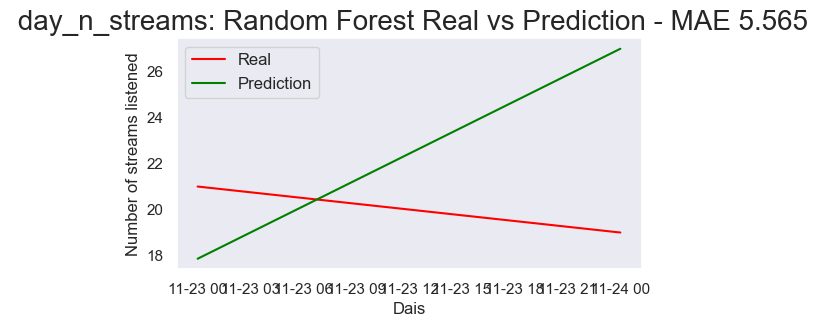

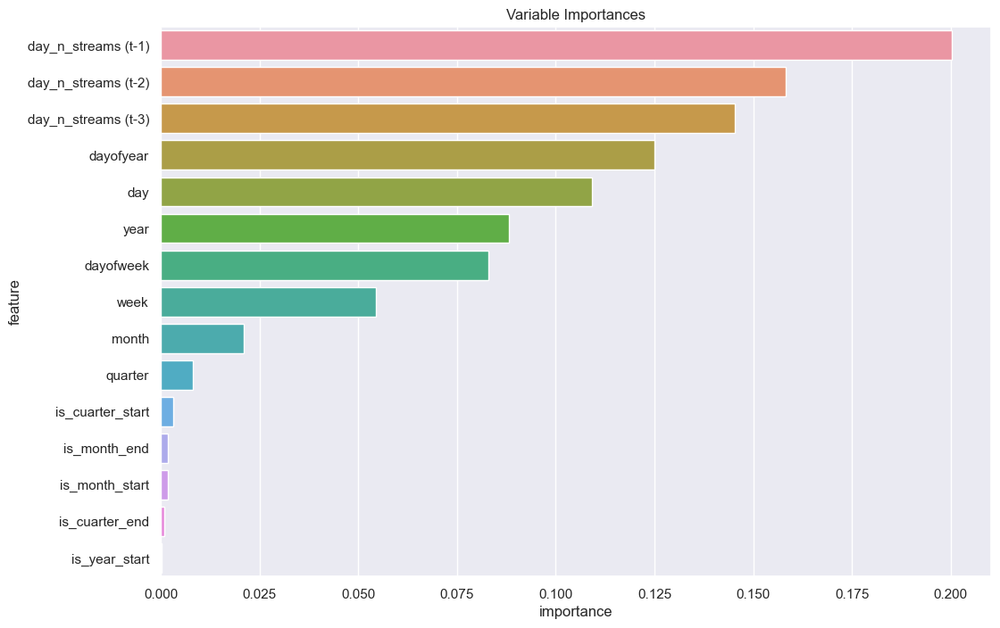

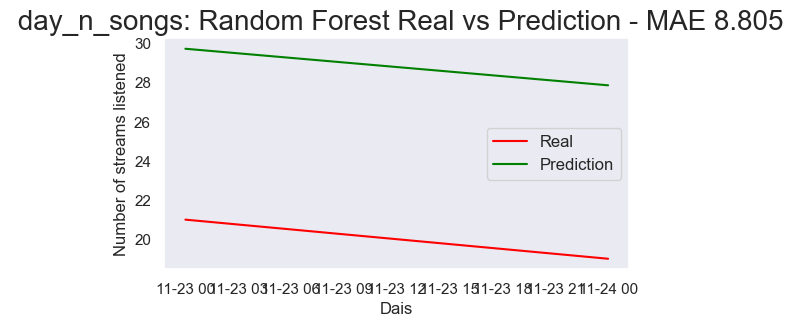

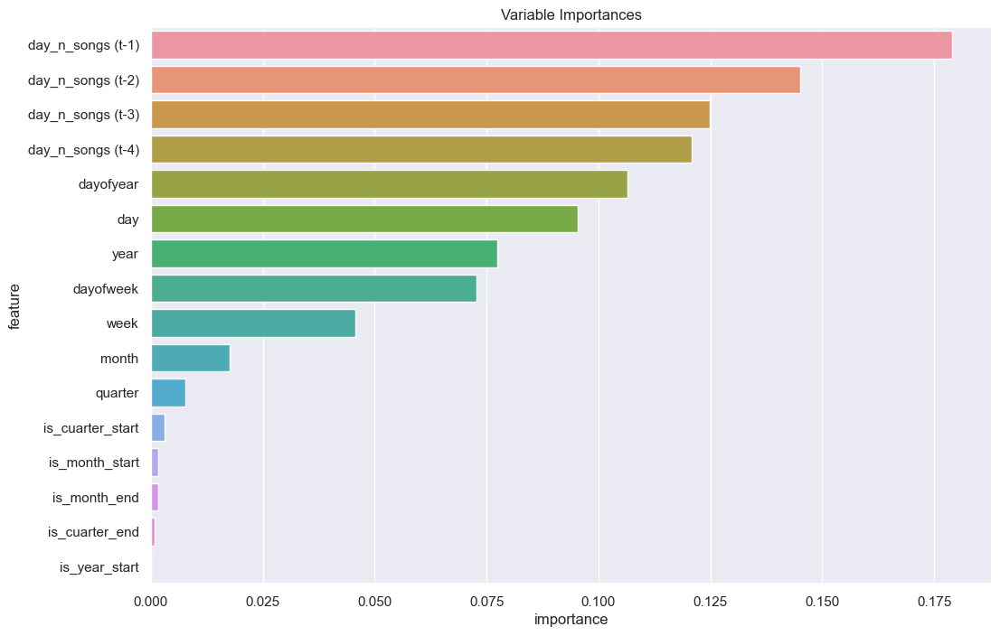

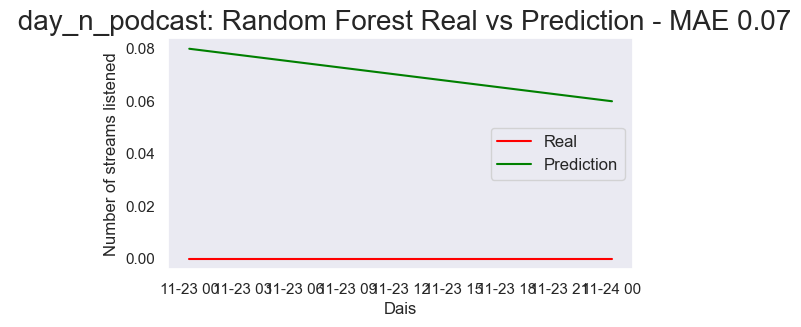

...

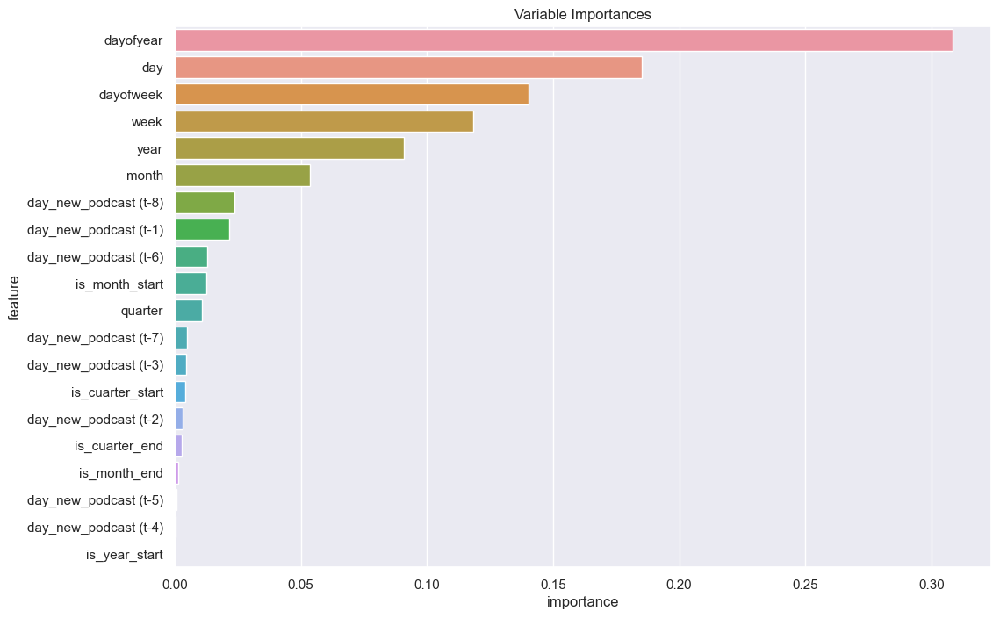

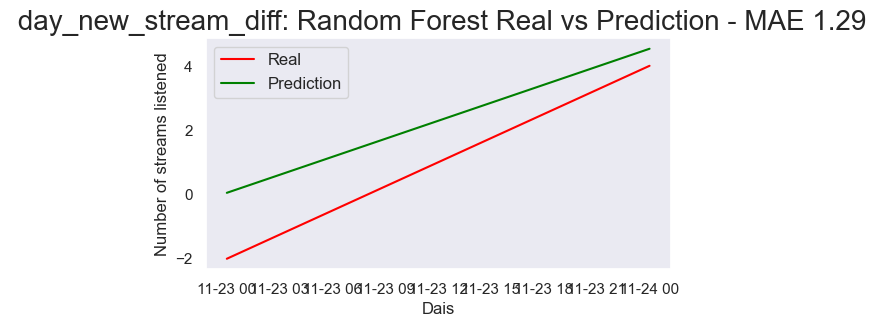

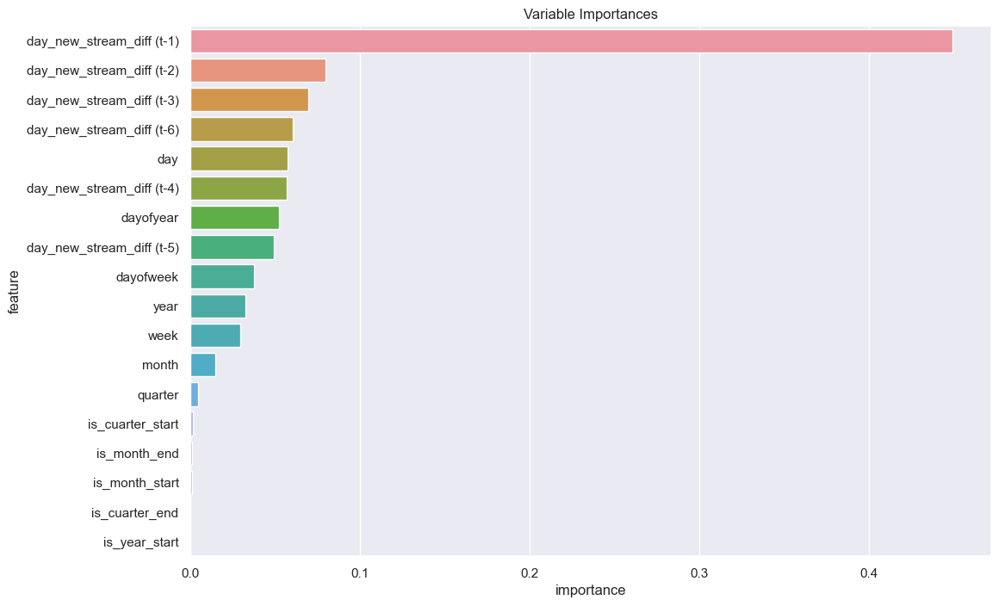

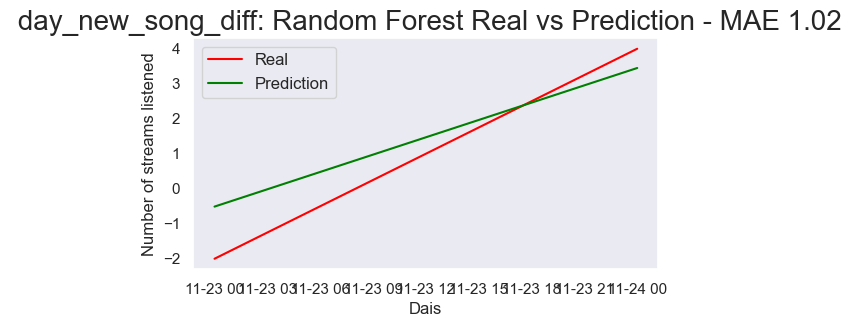

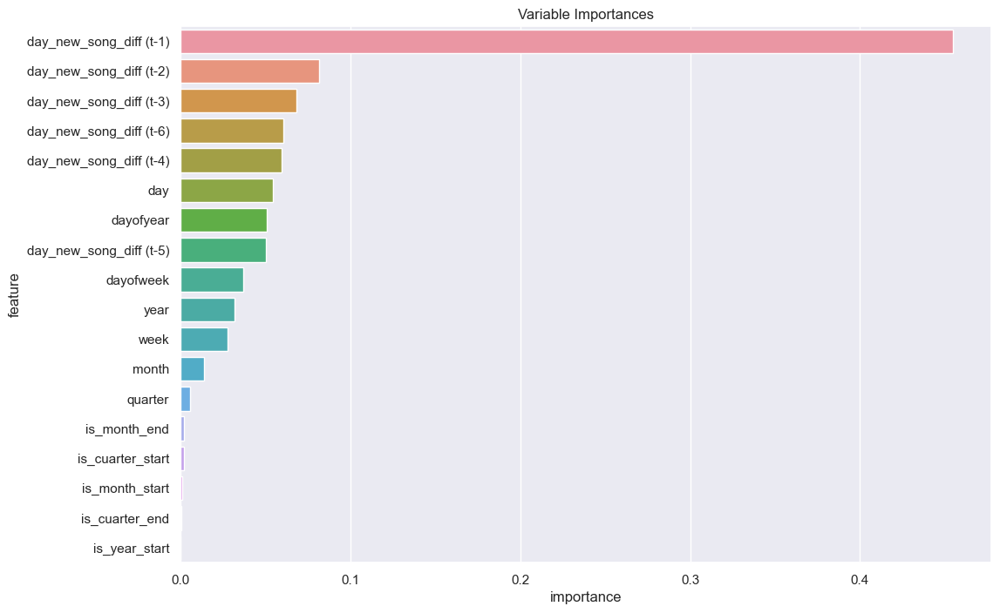

In [962]:
for d in df_list_tf:
    target = d.columns[0]
    tree_feature_importance(d, target, split=2, plot = 0, r = 1)

<span style='background :yellow' > 1.1.1.- Funcion que seleccion X numero de variables según un threshold de importancia </span>

Por ejemplo: 
   - solo las variables que su VI >= 0.1
   - Sumar VI de Variables, de mas importante a menos, hasta llegar a un VI_TOTAL >= 0.8 

<span style='background :violet' > 1.1.2.- Simulate and predict all results </span>

In [963]:
%%time

n_sims = 2

df_mae_tf = []
df_mse_tf = []
df_var_i_tf = []

# Dataframes Loop
for d in df_list_tf:
    sim_mae_tf = []
    sim_mse_tf = []
    sim_vi_tf = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance(d, target, split=1, plot = 3, r = 1)
        
        # Save data -- SIM
        sim_mae_tf.append(mae)
        sim_mse_tf.append(mse)
        sim_vi_tf.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf[0].shape[0]), sim_vi_tf[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf.append(np.mean(sim_mae_tf))
    df_mse_tf.append(np.mean(sim_mse_tf))
    df_var_i_tf.append(mean_sim_vi)

CPU times: total: 9.53 s
Wall time: 9.54 s


In [964]:
for d,mae in zip(df_list_tf,df_mae_tf):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  7.105
day_n_songs :  10.37
day_n_podcast :  0.03
day_new_podcast :  0.0
day_new_stream_diff :  1.035
day_new_song_diff :  0.7849999999999999


- <span style='background :beige' > TS - CV - Time Features 0 </span>

In [965]:
%%time

n_sims = 2

df_mae_tf = []
df_mse_tf = []
df_var_i_tf = []

# Dataframes Loop
for d in df_list_tf:
    sim_mae_tf = []
    sim_mse_tf = []
    sim_vi_tf = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance_bcv(d, target = d.columns[0], r = 0)

        # Save data -- SIM
        sim_mae_tf.append(mae)
        sim_mse_tf.append(mse)
        sim_vi_tf.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf[0].shape[0]), sim_vi_tf[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf.append(np.mean(sim_mae_tf))
    df_mse_tf.append(np.mean(sim_mse_tf))
    df_var_i_tf.append(mean_sim_vi)

CPU times: total: 11.9 s
Wall time: 11.9 s


In [966]:
for d,mae in zip(df_list_tf,df_mae_tf):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  15.463
day_n_songs :  6.6259999999999994
day_n_podcast :  0.0
day_new_podcast :  0.002
day_new_stream_diff :  5.401
day_new_song_diff :  4.244


- <span style='background :beige' > B -TS - CV - Time Features 0 </span>

In [967]:
%%time

n_sims = 2

df_mae_tf = []
df_mse_tf = []
df_var_i_tf = []

# Dataframes Loop
for d in df_list_tf:
    sim_mae_tf = []
    sim_mse_tf = []
    sim_vi_tf = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance_bcv(d, target = d.columns[0], r = 0)

        # Save data -- SIM
        sim_mae_tf.append(mae)
        sim_mse_tf.append(mse)
        sim_vi_tf.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf[0].shape[0]), sim_vi_tf[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf.append(np.mean(sim_mae_tf))
    df_mse_tf.append(np.mean(sim_mse_tf))
    df_var_i_tf.append(mean_sim_vi)

CPU times: total: 14.6 s
Wall time: 14.6 s


In [968]:
for d,mae in zip(df_list_tf,df_mae_tf):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  15.619999999999997
day_n_songs :  6.464
day_n_podcast :  0.0
day_new_podcast :  0.0
day_new_stream_diff :  5.171
day_new_song_diff :  5.151


- <span style='background :beige' > Create Time Features Variation - N1 </span>

In [969]:
pre_df_list_tf_1 = []

for t,i in zip(TARGETS, ix_lags):
    l_df_var_tf = []
    
    l_df_var_tf = df[t].copy().to_frame()
    l_df_var_tf = l_df_var_tf.assign(**{f'{col} (t-{l})': df[col].shift(l) for l in range(1, i+2) for col in l_df_var_tf})
    l_df_var_tf.dropna(inplace=True)
    l_df_var_tf.append(l_df_var_tf)
    
    #l_df_var[7].head(1)
    pre_df_list_tf_1.append(l_df_var_tf)
    
df_list_tf_1 = []

for d in pre_df_list_tf_1:
    df_list_tf_1.append(create_time_features(d, f = 1))
    
df_list_tf_1[3].head(1)

,day_new_podcast,day_new_podcast (t-1),day_new_podcast (t-2),day_new_podcast (t-3),day_new_podcast (t-4),day_new_podcast (t-5),day_new_podcast (t-6),day_new_podcast (t-7),day_new_podcast (t-8),year,quarter,month,week,day,dayofyear,dayofweek
2017-04-13,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2017,2,4,15,13,103,3


In [970]:
%%time

n_sims = 2

df_mae_tf_1 = []
df_mse_tf_1 = []
df_var_i_tf_1 = []

# Dataframes Loop
for d in df_list_tf_1:
    sim_mae_tf_1 = []
    sim_mse_tf_1 = []
    sim_vi_tf_1 = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance(d, target, split=1, plot = 3, r = 1)
        
        # Save data -- SIM
        sim_mae_tf_1.append(mae)
        sim_mse_tf_1.append(mse)
        sim_vi_tf_1.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf_1[0].shape[0]), sim_vi_tf_1[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf_1[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf_1.append(np.mean(sim_mae_tf_1))
    df_mse_tf_1.append(np.mean(sim_mse_tf_1))
    df_var_i_tf_1.append(mean_sim_vi)

CPU times: total: 12.6 s
Wall time: 12.7 s


In [971]:
for d,mae in zip(df_list_tf_1, df_mae_tf_1):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  7.0
day_n_songs :  8.525
day_n_podcast :  0.03
day_new_podcast :  0.005
day_new_stream_diff :  0.8949999999999999
day_new_song_diff :  0.7000000000000001


- <span style='background :beige' > CV - Time Features - N1</span>

In [972]:
%%time

n_sims = 2

df_mae_tf_1 = []
df_mse_tf_1 = []
df_var_i_tf_1 = []

# Dataframes Loop
for d in df_list_tf_1:
    sim_mae_tf_1 = []
    sim_mse_tf_1 = []
    sim_vi_tf_1 = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance_cv(d, target = d.columns[0], r = 0)
        
        # Save data -- SIM
        sim_mae_tf_1.append(mae)
        sim_mse_tf_1.append(mse)
        sim_vi_tf_1.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf_1[0].shape[0]), sim_vi_tf_1[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf_1[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf_1.append(np.mean(sim_mae_tf_1))
    df_mse_tf_1.append(np.mean(sim_mse_tf_1))
    df_var_i_tf_1.append(mean_sim_vi)

CPU times: total: 47.1 s
Wall time: 47.1 s


In [973]:
for d,mae in zip(df_list_tf_1, df_mae_tf_1):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  10.109
day_n_songs :  10.624
day_n_podcast :  0.057
day_new_podcast :  0.031000000000000003
day_new_stream_diff :  3.8419999999999996
day_new_song_diff :  3.688


- <span style='background :beige' > B-TS-CV - Time Features - N1</span>

In [974]:
%%time

n_sims = 2

df_mae_tf_1 = []
df_mse_tf_1 = []
df_var_i_tf_1 = []

# Dataframes Loop
for d in df_list_tf_1:
    sim_mae_tf_1 = []
    sim_mse_tf_1 = []
    sim_vi_tf_1 = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance_bcv(d, target = d.columns[0], r = 0)
        
        # Save data -- SIM
        sim_mae_tf_1.append(mae)
        sim_mse_tf_1.append(mse)
        sim_vi_tf_1.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf_1[0].shape[0]), sim_vi_tf_1[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf_1[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf_1.append(np.mean(sim_mae_tf_1))
    df_mse_tf_1.append(np.mean(sim_mse_tf_1))
    df_var_i_tf_1.append(mean_sim_vi)

CPU times: total: 16.8 s
Wall time: 16.9 s


In [975]:
for d,mae in zip(df_list_tf_1, df_mae_tf_1):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  15.171999999999997
day_n_songs :  6.7330000000000005
day_n_podcast :  0.0
day_new_podcast :  0.0
day_new_stream_diff :  4.784999999999999
day_new_song_diff :  5.079


- <span style='background :beige' > Create Time Features Variation - N2 </span>

In [976]:
pre_df_list_tf_2 = []

for t,i in zip(TARGETS, ix_lags):
    l_df_var_tf = []
    
    l_df_var_tf = df[t].copy().to_frame()
    l_df_var_tf = l_df_var_tf.assign(**{f'{col} (t-{l})': df[col].shift(l) for l in range(1, i+2) for col in l_df_var_tf})
    l_df_var_tf.dropna(inplace=True)
    l_df_var_tf.append(l_df_var_tf)
    
    #l_df_var[7].head(1)
    pre_df_list_tf_2.append(l_df_var_tf)
    
df_list_tf_2 = []

for d in pre_df_list_tf_2:
    df_list_tf_2.append(create_time_features(d, f = 2))
    
df_list_tf_2[3].head(1)

,day_new_podcast,day_new_podcast (t-1),day_new_podcast (t-2),day_new_podcast (t-3),day_new_podcast (t-4),day_new_podcast (t-5),day_new_podcast (t-6),day_new_podcast (t-7),day_new_podcast (t-8),day,dayofyear
2017-04-13,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13,103


In [977]:
%%time

n_sims = 2

df_mae_tf_2 = []
df_mse_tf_2 = []
df_var_i_tf_2 = []

# Dataframes Loop
for d in df_list_tf_2:
    sim_mae_tf_2 = []
    sim_mse_tf_2 = []
    sim_vi_tf_2 = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance(d, target, split=1, plot = 3, r = 1)
        
        # Save data -- SIM
        sim_mae_tf_2.append(mae)
        sim_mse_tf_2.append(mse)
        sim_vi_tf_2.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf_2[0].shape[0]), sim_vi_tf_2[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf_2[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf_2.append(np.mean(sim_mae_tf_2))
    df_mse_tf_2.append(np.mean(sim_mse_tf_2))
    df_var_i_tf_2.append(mean_sim_vi)

CPU times: total: 9.56 s
Wall time: 9.57 s


In [978]:
for d,mae in zip(df_list_tf_2, df_mae_tf_2):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  17.815
day_n_songs :  22.305
day_n_podcast :  0.0
day_new_podcast :  0.01
day_new_stream_diff :  2.52
day_new_song_diff :  2.08


- <span style='background :beige' > CV - Time Features - N2</span>

In [979]:
%%time

n_sims = 2

df_mae_tf_2 = []
df_mse_tf_2 = []
df_var_i_tf_2 = []

# Dataframes Loop
for d in df_list_tf_2:
    sim_mae_tf_2 = []
    sim_mse_tf_2 = []
    sim_vi_tf_2 = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance_cv(d, target = d.columns[0], r = 0)
        
        # Save data -- SIM
        sim_mae_tf_2.append(mae)
        sim_mse_tf_2.append(mse)
        sim_vi_tf_2.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf_2[0].shape[0]), sim_vi_tf_2[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf_2[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf_2.append(np.mean(sim_mae_tf_2))
    df_mse_tf_2.append(np.mean(sim_mse_tf_2))
    df_var_i_tf_2.append(mean_sim_vi)

CPU times: total: 34.3 s
Wall time: 34.3 s


In [980]:
for d,mae in zip(df_list_tf_2, df_mae_tf_2):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  13.927999999999999
day_n_songs :  14.375
day_n_podcast :  0.0
day_new_podcast :  0.0
day_new_stream_diff :  3.3870000000000005
day_new_song_diff :  2.662


- <span style='background :beige' > CV - Time Features - N2</span>

In [981]:
%%time

n_sims = 2

df_mae_tf_2 = []
df_mse_tf_2 = []
df_var_i_tf_2 = []

# Dataframes Loop
for d in df_list_tf_2:
    sim_mae_tf_2 = []
    sim_mse_tf_2 = []
    sim_vi_tf_2 = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance_bcv(d, target = d.columns[0], r = 0)
        
        # Save data -- SIM
        sim_mae_tf_2.append(mae)
        sim_mse_tf_2.append(mse)
        sim_vi_tf_2.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_tf_2[0].shape[0]), sim_vi_tf_2[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_tf_2[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_tf_2.append(np.mean(sim_mae_tf_2))
    df_mse_tf_2.append(np.mean(sim_mse_tf_2))
    df_var_i_tf_2.append(mean_sim_vi)

CPU times: total: 10.9 s
Wall time: 10.9 s


In [982]:
for d,mae in zip(df_list_tf_2, df_mae_tf_2):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  12.879000000000001
day_n_songs :  10.331
day_n_podcast :  0.0
day_new_podcast :  0.0
day_new_stream_diff :  5.006
day_new_song_diff :  5.236


#### <span style='background :yellow' > Comparar resultados </span>
#### <span style='background :yellow' > Comparar resultados  </span>
#### <span style='background :yellow' > Comparar resultados  </span>

<span style='background :yellow' > 1.1.1.- Funcion que seleccion X numero de variables según un threshold de importancia </span>

<span style='background :yellow' > 1.1.1.- Funcion que seleccion X numero de variables según un threshold de importancia </span>

<span style='background :yellow' > 1.1.1.- Funcion que seleccion X numero de variables según un threshold de importancia </span>


# <span style='background :red' > Cambiar Nombres de Cada Proceso (los de CV Sobre todo) y crear funcion para reducir codigo  </span>

# <span style='background :red' > Save Models  </span>

#### <span style='background :lightgreen' > 1.3.- Check Ciclycal Time Values </span>

https://developer.nvidia.com/blog/three-approaches-to-encoding-time-information-as-features-for-ml-models/

https://towardsdatascience.com/three-approaches-to-feature-engineering-for-time-series-2123069567be

Create Dataframes with best results of Time Features

In [983]:
pre_df_list_cy = []

for t,i in zip(TARGETS, ix_lags):
    l_df_var_tf = []
    
    l_df_var_tf = df[t].copy().to_frame()
    l_df_var_tf = l_df_var_tf.assign(**{f'{col} (t-{l})': df[col].shift(l) for l in range(1, i+2) for col in l_df_var_tf})
    l_df_var_tf.dropna(inplace=True)
    l_df_var_tf.append(l_df_var_tf)
    
    #l_df_var[7].head(1)
    pre_df_list_cy.append(l_df_var_tf)
    
df_list_cy = []

for d in pre_df_list_cy:
    df_list_cy.append(create_time_features(d, f = 1))
    
df_list_cy[3].head(1)

,day_new_podcast,day_new_podcast (t-1),day_new_podcast (t-2),day_new_podcast (t-3),day_new_podcast (t-4),day_new_podcast (t-5),day_new_podcast (t-6),day_new_podcast (t-7),day_new_podcast (t-8),year,quarter,month,week,day,dayofyear,dayofweek
2017-04-13,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2017,2,4,15,13,103,3


In [984]:
df_list_cy[1].head(100)

,day_n_songs,day_n_songs (t-1),day_n_songs (t-2),day_n_songs (t-3),day_n_songs (t-4),year,quarter,month,week,day,dayofyear,dayofweek
2017-04-09,36,56.0,45.0,63.0,123.0,2017,2,4,14,9,99,6
2017-04-10,73,36.0,56.0,45.0,63.0,2017,2,4,15,10,100,0
2017-04-11,18,73.0,36.0,56.0,45.0,2017,2,4,15,11,101,1
2017-04-12,0,18.0,73.0,36.0,56.0,2017,2,4,15,12,102,2
2017-04-13,0,0.0,18.0,73.0,36.0,2017,2,4,15,13,103,3
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-13,29,18.0,30.0,50.0,25.0,2017,3,7,28,13,194,3
2017-07-14,74,29.0,18.0,30.0,50.0,2017,3,7,28,14,195,4
2017-07-15,109,74.0,29.0,18.0,30.0,2017,3,7,28,15,196,5
2017-07-16,12,109.0,74.0,29.0,18.0,2017,3,7,28,16,197,6


In [985]:
df_list_cy[1][df_list_cy[1]['month'] == 13]

,day_n_songs,day_n_songs (t-1),day_n_songs (t-2),day_n_songs (t-3),day_n_songs (t-4),year,quarter,month,week,day,dayofyear,dayofweek


In [986]:
'''df_list_cy[1]['m-yday'] = 0
df_list_cy[1]['w-yday'] = 0

m_yd = [str(i.month) + '-' + str(i.dayofyear) for i in df_list_cy[1].index]
w_yd = [str(i.week) + '-' + str(i.dayofyear) for i in df_list_cy[1].index]

df_list_cy[1]['m-yday'] = m_yd
df_list_cy[1]['w-yday'] = w_yd

df_list_cy[1]['m-yday']
df_list_cy[1]['w-yday']

len(df_list_cy[1]['m-yday'].unique())'''

"df_list_cy[1]['m-yday'] = 0\ndf_list_cy[1]['w-yday'] = 0\n\nm_yd = [str(i.month) + '-' + str(i.dayofyear) for i in df_list_cy[1].index]\nw_yd = [str(i.week) + '-' + str(i.dayofyear) for i in df_list_cy[1].index]\n\ndf_list_cy[1]['m-yday'] = m_yd\ndf_list_cy[1]['w-yday'] = w_yd\n\ndf_list_cy[1]['m-yday']\ndf_list_cy[1]['w-yday']\n\nlen(df_list_cy[1]['m-yday'].unique())"

### <span style='background :red' > Loop for all dataframes not only one </span> 

<span style='background :violet' >  Create Aux Time Features </span> 

In [987]:
df_list_cy[1]

,day_n_songs,day_n_songs (t-1),day_n_songs (t-2),day_n_songs (t-3),day_n_songs (t-4),year,quarter,month,week,day,dayofyear,dayofweek
2017-04-09,36,56.0,45.0,63.0,123.0,2017,2,4,14,9,99,6
2017-04-10,73,36.0,56.0,45.0,63.0,2017,2,4,15,10,100,0
2017-04-11,18,73.0,36.0,56.0,45.0,2017,2,4,15,11,101,1
2017-04-12,0,18.0,73.0,36.0,56.0,2017,2,4,15,12,102,2
2017-04-13,0,0.0,18.0,73.0,36.0,2017,2,4,15,13,103,3
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-20,9,16.0,4.0,29.0,1.0,2022,4,11,46,20,324,6
2022-11-21,7,9.0,16.0,4.0,29.0,2022,4,11,47,21,325,0
2022-11-22,25,7.0,9.0,16.0,4.0,2022,4,11,47,22,326,1
2022-11-23,21,25.0,7.0,9.0,16.0,2022,4,11,47,23,327,2


<span style='background :violet' > 1.1.1.3.- Transform Featuers to Cyclical Values </span> 

In [988]:
# Save all new Features:
cy_list = []

# Transforming quarter to cyclical Values
rbf_quarter = RepeatingBasisFunction(n_periods=4,
                             column="dayofyear",
                             input_range=(1,365),
                             remainder="drop")

rbf_quarter.fit(df_list_cy[1])
df_cy_quarter = pd.DataFrame(index=df_list_cy[1].index, data=rbf_quarter.transform(df_list_cy[1]))
cy_list.append(df_cy_quarter)

# Transforming month to cyclical Values
rbf_month = RepeatingBasisFunction(n_periods=12,
                             column="dayofyear",
                             input_range=(1,365),
                             remainder="drop")

rbf_month.fit(df_list_cy[1])
df_cy_month = pd.DataFrame(index=df_list_cy[1].index, data=rbf_month.transform(df_list_cy[1]))
cy_list.append(df_cy_month)

# ----------------------------------------------------------------------------------------------------------------------
# Transforming monthday to cyclical Values
rbf_monthday = RepeatingBasisFunction(n_periods=30,
                             column="month",
                             input_range=(1,12),
                             remainder="drop")

rbf_monthday.fit(df_list_cy[1])
df_cy_monthday = pd.DataFrame(index=df_list_cy[1].index, data=rbf_monthday.transform(df_list_cy[1]))
cy_list.append(df_cy_monthday)
# ----------------------------------------------------------------------------------------------------------------------

# Transforming week to cyclical Values
rbf_week = RepeatingBasisFunction(n_periods=52,
                             column="dayofyear",
                             input_range=(1,365),
                             remainder="drop")

rbf_week.fit(df_list_cy[1])
df_cy_week = pd.DataFrame(index=df_list_cy[1].index, data=rbf_week.transform(df_list_cy[1]))
cy_list.append(df_cy_week)

# Transforming weekday to cyclical Values
rbf_weekday = RepeatingBasisFunction(n_periods=7,
                             column="week",
                             input_range=(1,52),
                             remainder="drop")

rbf_weekday.fit(df_list_cy[1])
df_cy_weekday = pd.DataFrame(index=df_list_cy[1].index, data=rbf_weekday.transform(df_list_cy[1]))
cy_list.append(df_cy_weekday)

# Transforming yearday to cyclical Values
rbf_yearday = RepeatingBasisFunction(n_periods=365,
                             column="dayofyear",
                             input_range=(1,365),
                             remainder="drop")

rbf_yearday.fit(df_list_cy[1])
df_cy_yearday = pd.DataFrame(index=df_list_cy[1].index, data=rbf_yearday.transform(df_list_cy[1]))
cy_list.append(df_cy_yearday)

In [989]:
print('df_cy_quarter', len(df_cy_quarter.columns), df_cy_quarter.columns, '\n',
     'df_cy_month', len(df_cy_month.columns), df_cy_month.columns, '\n',
     'df_cy_monthday', len(df_cy_monthday.columns), df_cy_monthday.columns, '\n',
     'df_cy_week', len(df_cy_week.columns), df_cy_week.columns, '\n',
     'df_cy_weekday', len(df_cy_weekday.columns), df_cy_weekday.columns, '\n',
     'df_cy_yearday', len(df_cy_yearday.columns), df_cy_yearday.columns, '\n')

df_cy_quarter 4 RangeIndex(start=0, stop=4, step=1) 
 df_cy_month 12 RangeIndex(start=0, stop=12, step=1) 
 df_cy_monthday 30 RangeIndex(start=0, stop=30, step=1) 
 df_cy_week 52 RangeIndex(start=0, stop=52, step=1) 
 df_cy_weekday 7 RangeIndex(start=0, stop=7, step=1) 
 df_cy_yearday 365 RangeIndex(start=0, stop=365, step=1) 



CPU times: total: 2min 38s
Wall time: 2min 52s


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
      

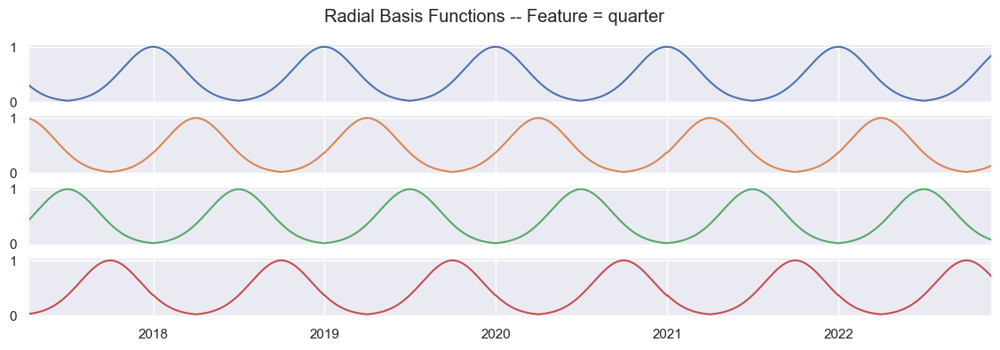

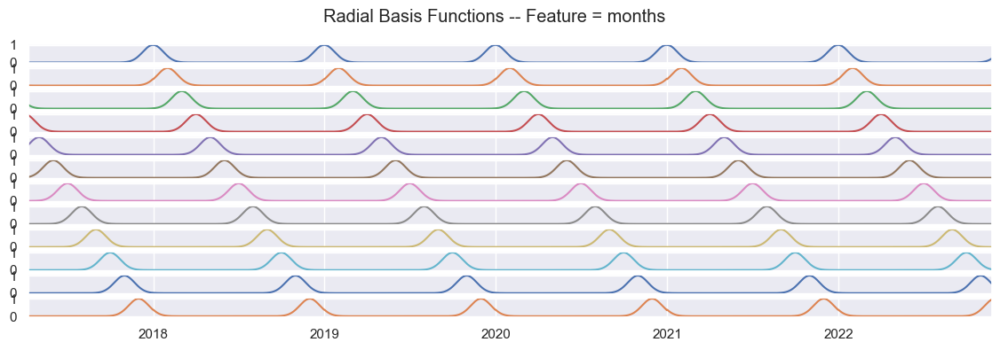

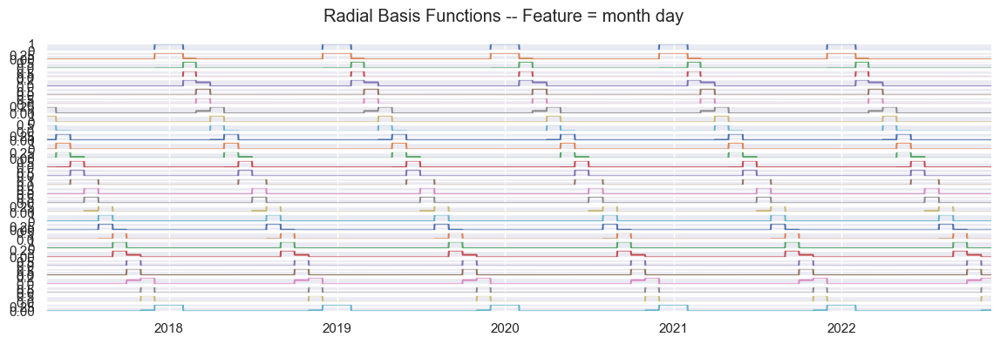

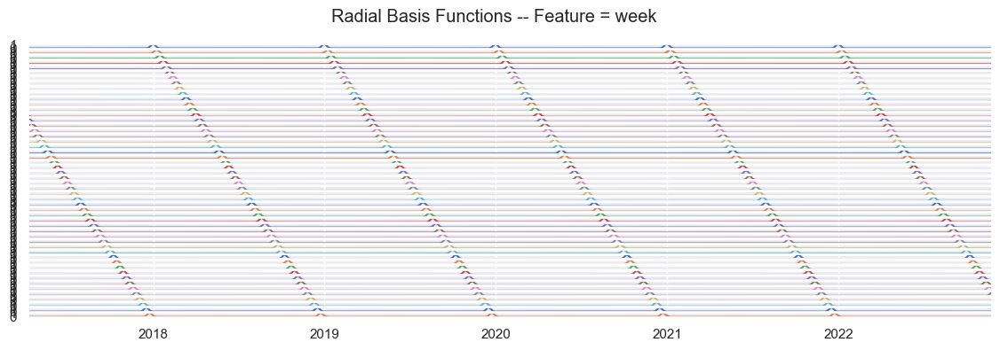

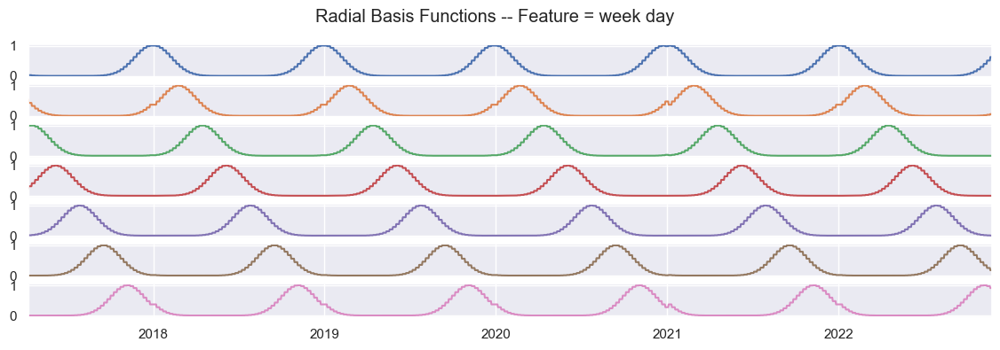

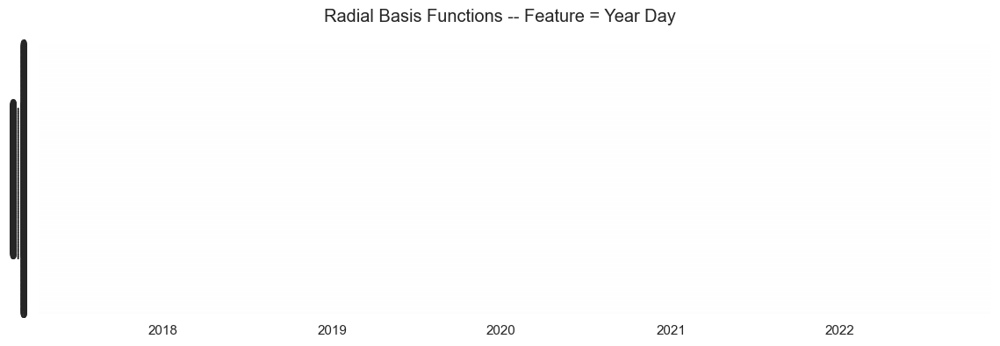

In [990]:
%%time 

# Plotsss
df_cy_quarter.plot(subplots=True, figsize=(14, 4), 
         sharex=True, title="Radial Basis Functions -- Feature = quarter",
         legend=False);

df_cy_month.plot(subplots=True, figsize=(14, 4), 
         sharex=True, title="Radial Basis Functions -- Feature = months",
         legend=False);

df_cy_monthday.plot(subplots=True, figsize=(14, 4), 
         sharex=True, title="Radial Basis Functions -- Feature = month day",
         legend=False);

df_cy_week.plot(subplots=True, figsize=(14, 4), 
         sharex=True, title="Radial Basis Functions -- Feature = week",
         legend=False);

df_cy_weekday.plot(subplots=True, figsize=(14, 4), 
         sharex=True, title="Radial Basis Functions -- Feature = week day",
         legend=False);

df_cy_yearday.plot(subplots=True, figsize=(14, 4), 
         sharex=True, title="Radial Basis Functions -- Feature = Year Day",
         legend=False);

### Checking values are Right Generated

In [991]:
df_cy_monthday[13].unique()

array([8.27765727e-11, 1.26272156e-02, 6.67004372e-01, 1.22003052e-05,
       7.72740443e-17, 1.69479635e-34, 1.28712974e-58, 3.38491730e-89,
       4.02006022e-74, 1.47696404e-46, 1.87900621e-25])

In [992]:
df_list_cy[1][(df_list_cy[1]['day'] == 1) & (df_list_cy[1]['month'] == 5)]

,day_n_songs,day_n_songs (t-1),day_n_songs (t-2),day_n_songs (t-3),day_n_songs (t-4),year,quarter,month,week,day,dayofyear,dayofweek
2017-05-01,26,13.0,20.0,19.0,49.0,2017,2,5,18,1,121,0
2018-05-01,89,37.0,14.0,48.0,53.0,2018,2,5,18,1,121,1
2019-05-01,55,34.0,46.0,86.0,69.0,2019,2,5,18,1,121,2
2020-05-01,60,19.0,61.0,33.0,53.0,2020,2,5,18,1,122,4
2021-05-01,75,72.0,31.0,29.0,9.0,2021,2,5,17,1,121,5
2022-05-01,10,44.0,12.0,112.0,77.0,2022,2,5,17,1,121,6


In [993]:
df_cy_monthday.loc['2017-05-01'] == df_cy_monthday.loc['2017-06-01']
df_cy_monthday.loc['2017-05-01'] == df_cy_monthday.loc['2018-05-01']
df_cy_monthday.loc['2018-05-01'] == df_cy_monthday.loc['2019-05-01'] 
df_cy_monthday.loc['2019-05-01'] == df_cy_monthday.loc['2020-05-01']
df_cy_monthday.loc['2020-05-01'] == df_cy_monthday.loc['2021-05-01']
df_cy_monthday.loc['2021-05-01'] == df_cy_monthday.loc['2022-05-01']
df_cy_monthday.loc['2021-05-01'] == df_cy_monthday.loc['2022-05-03']

0     True
1     True
2     True
3     True
4     True
5     True
6     True
7     True
8     True
9     True
10    True
11    True
12    True
13    True
14    True
15    True
16    True
17    True
18    True
19    True
20    True
21    True
22    True
23    True
24    True
25    True
26    True
27    True
28    True
29    True
dtype: bool

In [994]:
#df_list_cy[1][df_list_cy[1]['dayofweek'] == 0]
#df_list_cy[1].head(20)
df_list_cy[1][(df_list_cy[1]['dayofweek'] == 0) & (df_list_cy[1]['month'] == 5)].head()

,day_n_songs,day_n_songs (t-1),day_n_songs (t-2),day_n_songs (t-3),day_n_songs (t-4),year,quarter,month,week,day,dayofyear,dayofweek
2017-05-01,26,13.0,20.0,19.0,49.0,2017,2,5,18,1,121,0
2017-05-08,21,4.0,5.0,78.0,41.0,2017,2,5,19,8,128,0
2017-05-15,41,35.0,44.0,48.0,15.0,2017,2,5,20,15,135,0
2017-05-22,129,29.0,110.0,73.0,67.0,2017,2,5,21,22,142,0
2017-05-29,11,56.0,32.0,32.0,60.0,2017,2,5,22,29,149,0


In [995]:
df_cy_weekday.loc['2017-05-01'] == df_cy_weekday.loc['2017-05-16'] 

0    False
1    False
2    False
3    False
4    False
5    False
6    False
dtype: bool

In [996]:
df_cy_weekday.loc['2017-05-01'] == df_cy_weekday.loc['2017-05-08'] 

0    False
1    False
2    False
3    False
4    False
5    False
6    False
dtype: bool

Esta es una buena teoría para concluir que esta bien - Estaría muy bien poder meterle zum a un solo mes

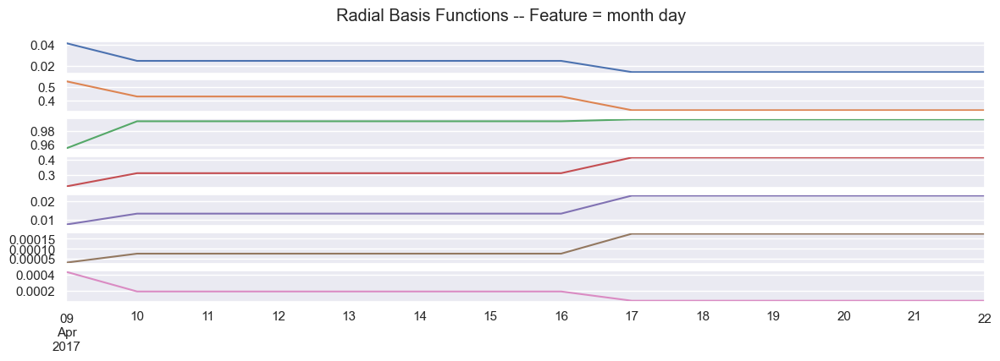

In [997]:
df_cy_weekday.iloc[:14].plot(subplots=True, figsize=(14, 4), 
         sharex=True, title="Radial Basis Functions -- Feature = month day",
         legend=False);

#### <span style='background :red' > WeekDAY y MonthDAY falla. El mes tiene los 30 dias iguales, año tras año. La semana igual. Una misma semana tiene los mismos dias sea lunes martes o miercoles, pero el resto de semanas tienen valores diferentes </span>

In [998]:
for cy, j in zip(cy_list, range(len(cy_list))):
    for c in cy.columns:
        cy.rename(columns = {c:str(j)+'-'+str(c)}, inplace=True)

In [999]:
cy_list[0]

,0-0,0-1,0-2,0-3
2017-04-09,0.313560,0.994100,0.426531,0.024767
2017-04-10,0.306189,0.992301,0.435220,0.025834
2017-04-11,0.298919,0.990266,0.443978,0.026939
2017-04-12,0.291751,0.987997,0.452804,0.028085
2017-04-13,0.284686,0.985494,0.461694,0.029273
...,...,...,...,...
2022-11-20,0.816282,0.121956,0.090646,0.739415
2022-11-21,0.824306,0.125892,0.087600,0.730451
2022-11-22,0.832208,0.129923,0.084637,0.721422
2022-11-23,0.839982,0.134050,0.081754,0.712333


<span style='background :violet' > Join cyclical variables to each dataframe and delete old time features </span>

In [1000]:
### Prepare Dataframes to compare:
df_cy_1 = []

for df in df_list_cy:
    df_cy_1.append(df.copy())

### Delete TF Variables
for df1, i in zip(df_list_cy, range(len(df_list_cy))):
    df_list_cy[i].drop(['quarter', 'month', 'week', 'day', 'dayofyear', 'dayofweek'], axis = 1, inplace = True)
    
for df, i in zip(df_cy_1, range(len(df_cy_1))):
    df_cy_1[i].drop(['quarter', 'month', 'week'], axis = 1, inplace = True)


In [1001]:
#### Add Cyclical Dataframes
for df1, i in zip(df_list_cy, range(len(df_list_cy))):
    for cy in cy_list:
        df_list_cy[i] = df_list_cy[i].join(cy)

for df1, i in zip(df_cy_1, range(len(df_cy_1))):
    for cy, j in zip(cy_list, range(len(cy_list))):
        if(j == 0 or j == 1 or j == 3):
            df_cy_1[i] = df_cy_1[i].join(cy)

In [1002]:
df_cy_1[0]

,day_n_streams,day_n_streams (t-1),day_n_streams (t-2),day_n_streams (t-3),year,day,dayofyear,dayofweek,0-0,0-1,...,3-42,3-43,3-44,3-45,3-46,3-47,3-48,3-49,3-50,3-51
2017-04-08,56,45.0,63.0,123.0,2017,8,98,5,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-04-09,36,56.0,45.0,63.0,2017,9,99,6,0.313560,0.994100,...,7.020668e-251,1.812254e-230,6.330977e-211,2.993184e-192,1.915170e-174,1.658410e-157,1.943515e-141,3.082441e-126,6.616261e-112,1.921948e-98
2017-04-10,73,36.0,56.0,45.0,2017,10,100,0,0.306189,0.992301,...,7.235957e-254,2.485540e-233,1.155464e-213,7.269482e-195,6.189582e-177,7.132311e-160,1.112270e-143,2.347476e-128,6.705069e-114,2.591889e-100
2017-04-11,18,73.0,36.0,56.0,2017,11,101,1,0.298919,0.990266,...,7.159574e-257,3.272624e-236,2.024492e-216,1.694912e-197,1.920389e-179,2.944708e-162,6.110916e-146,1.716254e-130,6.523304e-116,3.355559e-102
2017-04-12,0,18.0,73.0,36.0,2017,12,102,2,0.291751,0.987997,...,6.800677e-260,4.136616e-239,3.405252e-219,3.793713e-200,5.719929e-182,1.167153e-164,3.223117e-148,1.204579e-132,6.092642e-118,4.170489e-104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-20,9,16.0,4.0,29.0,2022,20,324,6,0.816282,0.121956,...,3.516322e-08,5.131379e-05,1.013423e-02,2.708683e-01,9.797987e-01,4.796523e-01,3.177805e-02,2.849305e-04,3.457496e-07,5.678001e-11
2022-11-21,7,9.0,16.0,4.0,2022,21,325,0,0.824306,0.125892,...,1.054782e-08,2.048294e-05,5.383106e-03,1.914629e-01,9.216104e-01,6.003730e-01,5.293050e-02,6.315415e-04,1.019785e-06,2.228572e-10
2022-11-22,25,7.0,9.0,16.0,2022,22,326,1,0.832208,0.129923,...,3.037458e-09,7.849176e-06,2.745041e-03,1.299226e-01,8.322075e-01,7.214223e-01,8.463666e-02,1.343812e-03,2.887550e-06,8.397145e-10
2022-11-23,21,25.0,7.0,9.0,2022,23,327,2,0.839982,0.134050,...,8.397145e-10,2.887550e-06,1.343812e-03,8.463666e-02,7.214223e-01,8.322075e-01,1.299226e-01,2.745041e-03,7.849176e-06,3.037458e-09


In [1003]:
print(len(df_list_cy[1].columns))
print(list(df_list_cy[1].columns))

476
['day_n_songs', 'day_n_songs (t-1)', 'day_n_songs (t-2)', 'day_n_songs (t-3)', 'day_n_songs (t-4)', 'year', '0-0', '0-1', '0-2', '0-3', '1-0', '1-1', '1-2', '1-3', '1-4', '1-5', '1-6', '1-7', '1-8', '1-9', '1-10', '1-11', '2-0', '2-1', '2-2', '2-3', '2-4', '2-5', '2-6', '2-7', '2-8', '2-9', '2-10', '2-11', '2-12', '2-13', '2-14', '2-15', '2-16', '2-17', '2-18', '2-19', '2-20', '2-21', '2-22', '2-23', '2-24', '2-25', '2-26', '2-27', '2-28', '2-29', '3-0', '3-1', '3-2', '3-3', '3-4', '3-5', '3-6', '3-7', '3-8', '3-9', '3-10', '3-11', '3-12', '3-13', '3-14', '3-15', '3-16', '3-17', '3-18', '3-19', '3-20', '3-21', '3-22', '3-23', '3-24', '3-25', '3-26', '3-27', '3-28', '3-29', '3-30', '3-31', '3-32', '3-33', '3-34', '3-35', '3-36', '3-37', '3-38', '3-39', '3-40', '3-41', '3-42', '3-43', '3-44', '3-45', '3-46', '3-47', '3-48', '3-49', '3-50', '3-51', '4-0', '4-1', '4-2', '4-3', '4-4', '4-5', '4-6', '5-0', '5-1', '5-2', '5-3', '5-4', '5-5', '5-6', '5-7', '5-8', '5-9', '5-10', '5-11', '5-

In [1004]:
df_list_cy[2].isnull().values.any()
df_list_cy[2].dropna(inplace = True)

df_cy_1[2].isnull().values.any()
df_cy_1[2].dropna(inplace = True)

In [1022]:
df_list_cy[0].isnull().values.any()
df_list_cy[0].dropna(inplace = True)

df_cy_1[0].isnull().values.any()
df_cy_1[0].dropna(inplace = True)

<span style='background :red' > Why only this DF has nan Values </span>

<span style='background :violet' > 1.1.2.- Simulate and predict all results </span>

In [1023]:
%%time

n_sims = 2

df_mae_cy = []
df_mse_cy = []
df_var_i_cy = []

# Dataframes Loop
for d in df_list_cy:
    sim_mae_cy = []
    sim_mse_cy = []
    sim_vi_cy = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance_cv(d, target = d.columns[0], r = 0)
        
        # Save data -- SIM
        sim_mae_cy.append(mae)
        sim_mse_cy.append(mse)
        sim_vi_cy.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_cy[0].shape[0]), sim_vi_cy[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_cy[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_cy.append(np.mean(sim_mae_cy))
    df_mse_cy.append(np.mean(sim_mse_cy))
    df_var_i_cy.append(mean_sim_vi)

CPU times: total: 14min 43s
Wall time: 14min 43s


In [1024]:
for d,mae in zip(df_list_cy, df_mae_cy):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  9.807000000000002
day_n_songs :  10.055
day_n_podcast :  0.005
day_new_podcast :  0.0
day_new_stream_diff :  3.455
day_new_song_diff :  3.4739999999999998


<span style='background :violet' > Only some TF transformed </span>

In [1035]:
%%time

n_sims = 2

df_mae_cy_1 = []
df_mse_cy_1 = []
df_var_i_cy_1 = []

# Dataframes Loop
for d, l in zip(df_cy_1, range(len(df_cy_1))) :
    sim_mae_cy_1 = []
    sim_mse_cy_1 = []
    sim_vi_cy_1 = []

    target = d.columns[0]
        
    # Simulation Loop
    for sim in range(n_sims):
        #print('-- Sim Nº', sim, '--\n')
        mae , mse, vi = tree_feature_importance_cv(d, target = d.columns[0], r = 0)
        
        # Save data -- SIM
        sim_mae_cy_1.append(mae)
        sim_mse_cy_1.append(mse)
        sim_vi_cy_1.append(vi)
        
        #print('mae = ', mae)
        #print('mse = ', mse)
        #print('vi -- \n', vi, '\n')
        #print('feature --\n', vi['feature'], '\n\nimportance -- \n', vi['importance'], '\n\n')
    
    #print('\n\nMean Evaluation SIM ', lag_i , ' METRICS')
    #print('MAE ', np.mean(sim_mae))
    #print('MSE ', np.mean(sim_mse))

    mean_sim_vi = pd.DataFrame(columns = ['feature', 'importance'])
    
    # Loop to make variable importance simulation mean
    for i,col in zip(range(sim_vi_cy_1[0].shape[0]), sim_vi_cy_1[0]['feature']):
        aux = []
    
        for j in range(n_sims):
            aux.append(sim_vi_cy_1[j]['importance'][i])
    
        mean_sim_vi.loc[i, 'feature'] = col
        mean_sim_vi.loc[i, 'importance'] = np.mean(aux)

    #print('\n Mean Variable Importance \n')
    #mean_sim_vi.head()
    
    # Save Data -- VARIABLES/FEATURES
    df_mae_cy_1.append(np.mean(sim_mae_cy_1))
    df_mse_cy_1.append(np.mean(sim_mse_cy_1))
    df_var_i_cy_1.append(mean_sim_vi)
    print(l)

0
1
2
3
4
5
CPU times: total: 4min 39s
Wall time: 4min 39s


In [1039]:
for d,mae in zip(df_cy_1, df_mae_cy_1):
    print(str(d.columns[0]), ': ', mae)

day_n_streams :  9.686
day_n_songs :  10.834
day_n_podcast :  0.0
day_new_podcast :  0.0
day_new_stream_diff :  3.3
day_new_song_diff :  3.603999999999999


In [1030]:
df_cy_1[2]

,day_n_podcast,day_n_podcast (t-1),day_n_podcast (t-2),day_n_podcast (t-3),year,day,dayofyear,dayofweek,0-0,0-1,...,3-42,3-43,3-44,3-45,3-46,3-47,3-48,3-49,3-50,3-51
2017-04-09,0,0.0,0.0,0.0,2017,9,99,6,0.313560,0.994100,...,7.020668e-251,1.812254e-230,6.330977e-211,2.993184e-192,1.915170e-174,1.658410e-157,1.943515e-141,3.082441e-126,6.616261e-112,1.921948e-98
2017-04-10,0,0.0,0.0,0.0,2017,10,100,0,0.306189,0.992301,...,7.235957e-254,2.485540e-233,1.155464e-213,7.269482e-195,6.189582e-177,7.132311e-160,1.112270e-143,2.347476e-128,6.705069e-114,2.591889e-100
2017-04-11,0,0.0,0.0,0.0,2017,11,101,1,0.298919,0.990266,...,7.159574e-257,3.272624e-236,2.024492e-216,1.694912e-197,1.920389e-179,2.944708e-162,6.110916e-146,1.716254e-130,6.523304e-116,3.355559e-102
2017-04-12,0,0.0,0.0,0.0,2017,12,102,2,0.291751,0.987997,...,6.800677e-260,4.136616e-239,3.405252e-219,3.793713e-200,5.719929e-182,1.167153e-164,3.223117e-148,1.204579e-132,6.092642e-118,4.170489e-104
2017-04-13,0,0.0,0.0,0.0,2017,13,103,3,0.284686,0.985494,...,6.201415e-263,5.019587e-242,5.498652e-222,8.151837e-203,1.635557e-184,4.441065e-167,1.631998e-150,8.116390e-135,5.462826e-120,4.976029e-106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-20,0,0.0,0.0,0.0,2022,20,324,6,0.816282,0.121956,...,3.516322e-08,5.131379e-05,1.013423e-02,2.708683e-01,9.797987e-01,4.796523e-01,3.177805e-02,2.849305e-04,3.457496e-07,5.678001e-11
2022-11-21,0,0.0,0.0,0.0,2022,21,325,0,0.824306,0.125892,...,1.054782e-08,2.048294e-05,5.383106e-03,1.914629e-01,9.216104e-01,6.003730e-01,5.293050e-02,6.315415e-04,1.019785e-06,2.228572e-10
2022-11-22,0,0.0,0.0,0.0,2022,22,326,1,0.832208,0.129923,...,3.037458e-09,7.849176e-06,2.745041e-03,1.299226e-01,8.322075e-01,7.214223e-01,8.463666e-02,1.343812e-03,2.887550e-06,8.397145e-10
2022-11-23,0,0.0,0.0,0.0,2022,23,327,2,0.839982,0.134050,...,8.397145e-10,2.887550e-06,1.343812e-03,8.463666e-02,7.214223e-01,8.322075e-01,1.299226e-01,2.745041e-03,7.849176e-06,3.037458e-09


#### <span style='background :yellow' > Probar eliminando dia de la semana y día del mes </span>

#### <span style='background :yellow' > Probar unicamente con las 2 time features ams importantes </span>

<span style='background :violet' > 1.1.2.- Simulate and predict all results </span>

#### <span style='background :yellow' > ESTUDIAR </span>
#### <span style='background :yellow' > ESTUDIAR </span>
#### <span style='background :yellow' > ESTUDIAR </span>

https://towardsdatascience.com/cyclical-features-encoding-its-about-time-ce23581845ca

https://towardsdatascience.com/three-approaches-to-feature-engineering-for-time-series-2123069567be

Technical theory - https://en.wikipedia.org/wiki/Radial_basis_function

Decision trees based algorithms (Random Forest, Gradient Boosted Trees, XGBoost) 

build their split rules according to one feature at a time. This means that they will fail to process 

these two features simultaneously whereas the cos/sin values are expected to be considered as one single coordinates system.

Facebook Profet get this variables automatically

### <span style='background :red' > Select Best performance model and CV type for Grid Search </span>

#### <span style='background :lightgreen' > 1.4.- Grid Search + Cross Validation </span>

<span style='background :violet' > 1.4.1.- Simulate and predict all results </span>

- <span style='background :beige' > Grid Search 4 best performance dataframe with Time Serie Cross Validation </span>

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

https://medium.com/all-things-ai/in-depth-parameter-tuning-for-random-forest-d67bb7e920d

https://www.analyticsvidhya.com/blog/2020/03/beginners-guide-random-forest-hyperparameter-tuning/

https://towardsdatascience.com/random-forest-hyperparameters-and-how-to-fine-tune-them-17aee785ee0d

In [ ]:
import pandas
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
import joblib
import os

In [ ]:
%%time
# save the model to disk
models_path = r'C:\Users\ghoyo\Desktop\TFM 2.0\BETA\Project\RegularDatasets\GridModels'

# Dataframes
grid_clf = []
grid_mae = []
grid_mse = []
grid_pred = []
grid_params = []

# Data - NOT RUNNED CODE --------------------------------------------------------------------------------------------------
X_train_list = []
X_test_list = []
y_train_list = []
y_test_list = []
# -------------------------------------------------------------------------------------------------------------------------

# Future days predictions
horizon = 1

# Generate Best Grid
# RF Grid - https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 1, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(start = 1, stop = 100, num = 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print(len(n_estimators))
#print('Grid:\n', random_grid)

for df, i in zip(df_list_tf_1, range(len(df_list_tf_2))):
    
    features = df.drop(df.columns[0], axis=1).columns
    target = df.columns[0]

    X = df[features]
    y = df[target]

    X_train, X_test = X.iloc[:-horizon,:], X.iloc[-horizon:,:]
    y_train, y_test = y.iloc[:-horizon], y.iloc[-horizon:]
    
    # NOT RUNNED CODE ---------------------------------------------------------------------------------------------------------
    X_train_list.append(X_train)
    X_test_list.append(X_test)
    y_train_list.append(y_train)
    y_test_list.append(y_test)
    # -------------------------------------------------------------------------------------------------------------------------
    
    # https://stackoverflow.com/questions/46732748/how-do-i-use-a-timeseriessplit-with-a-gridsearchcv-object-to-tune-a-model-in-sci
    rf = RandomForestRegressor()

    tscv = TimeSeriesSplit(n_splits = 5, test_size = horizon)

    #rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = tscv, verbose=2, n_jobs = -1)
    rf_random = GridSearchCV(estimator = rf, param_grid = random_grid, cv = tscv, verbose=2, n_jobs = -1)
    rf_random.fit(X_train, y_train)
    
    # Save Data - NOT RUNNED CODE ---------------------------------------------------------------------------------------------
    filename = '\grid_clf_model_' + str(i) + '.sav'
    joblib.dump(g, models_path + filename)
    # -------------------------------------------------------------------------------------------------------------------------

    # Results
    grid_params.append(rf_random.best_params_)
    print('Best Params: \n', rf_random.best_params_)
    
    grid_clf.append(rf_random.best_estimator_)
    grid_pred.append(grid_clf[-1].predict(X_test))
    grid_mae.append(np.round(mean_absolute_error(y_test, grid_pred[-1]), 3))
    grid_mse.append(np.round(mean_squared_error(y_test, grid_pred[-1]), 3))
    print('Mae = ', grid_mae[-1])
    print('Mse = ', grid_mse[-1])
    

<span style='background :violet' > 1.4.2.- Load Models </span>

https://machinelearningmastery.com/save-load-machine-learning-models-python-scikit-learn/

In [ ]:
loaded_grids = []
res = []

for filename, i in zip(os.listdir(models_path), range(len(os.listdir(models_path)))):
    loaded_grids.append(joblib.load(models_path + '\\' + filename))
    #print(models_path + '\\' + filename)
    result = loaded_grids[-1].score(X_test_list[i], y_test_list[i])
    res.append(result)
    print(result)
    

#### <span style='background :red' >  -------------------------------------------- AKI ME KEDAO ---------------------------------------------</span>
#### <span style='background :red' >  -------------------------------------------- AKI ME KEDAO ---------------------------------------------</span>
#### <span style='background :red' >  -------------------------------------------- AKI ME KEDAO ---------------------------------------------</span>
#### <span style='background :red' >  -------------------------------------------- AKI ME KEDAO ---------------------------------------------</span>


Mismisimo CHATGPT

Si GridSearchCV devuelve los valores más bajos posibles para cada parámetro, significa que la búsqueda exhaustiva de parámetros ha encontrado que la combinación de esos valores resulta en el mejor rendimiento del modelo. Esto puede ser porque una mayor complejidad del modelo (como un mayor número de árboles o hojas) no es necesaria para ajustarse adecuadamente a los datos de entrenamiento y, por lo tanto, puede llevar a un sobreajuste.

También es posible que la cantidad de datos de entrenamiento sea insuficiente para justificar un modelo más complejo o que los datos de entrenamiento estén muy correlacionados, lo que resulta en un modelo más simple.

En cualquier caso, los resultados obtenidos con el GridSearchCV te permiten tener una idea de la configuración óptima de los parámetros para el modelo RandomForestRegressor. Sin embargo, es importante tener en cuenta que los resultados pueden ser influenciados por la división de datos utilizada para entrenar y validar el modelo, por lo que es recomendable realizar varias divisiones de datos y validar los resultados de GridSearchCV en diferentes conjuntos de datos antes de tomar una decisión final.

## <span style='background :lightblue' > 3.- Pred Song </span>

# <span style='background :red' >  -------------------------------------------- AKI ME KEDAO ---------------------------------------------</span>

https://towardsdatascience.com/a-practical-guide-to-implementing-a-random-forest-classifier-in-python-979988d8a263

- <span style='background :beige' > Dataset Only attributes of the songs ?? </span>

- <span style='background :beige' > Map Categorical Values -- OriginalEncoder sklearn package </span>
Does this count as order??? explicit 0, no 1 ... no explicit after explicit??

- <span style='background :beige' > Generate Charts observe relations betweek data features </span>

import seaborn
seaborn.pairplot(coffee_df.drop('total_cup_points', axis = 1))


- <span style='background :beige' > What About Outlayers? </span>

- <span style='background :beige' > Correlation Matrix </span>

- <span style='background :beige' > Data Augmentation ?? </span>

- <span style='background :beige' > BUILD RF </span>